In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
%matplotlib inline
import matplotlib.pyplot as plt

import sys 
import inspect
import seaborn as sns
import os
import copy

import perturbseq as perturb

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, color_map='viridis')
sc.logging.print_versions()

scanpy==1.5.1 anndata==0.7.1 umap==0.4.4 numpy==1.17.2 scipy==1.4.1 pandas==0.24.2 scikit-learn==0.22 statsmodels==0.11.0 python-igraph==0.7.1 louvain==0.6.1 leidenalg==0.8.1


In [2]:
PROTEIN='TP53'
DATA='/ahg/regevdata/projects/bn10_cancer_variants/bn10_oana_2018-06-22/results/2018-06-22/results/2020-02-14'
SUBSAMPLED=DATA+'/'+PROTEIN+'/subsampled/A549.'+PROTEIN

counts=20000

FIGS=DATA+'/2020-09-15_Figures/'
os.system('mkdir -p '+FIGS)
print(FIGS)

sc.settings.figdir=FIGS

/ahg/regevdata/projects/bn10_cancer_variants/bn10_oana_2018-06-22/results/2018-06-22/results/2020-02-14/2020-09-15_Figures/


In [3]:
FDR=0.01
#original anno
ANNO=DATA+'/'+PROTEIN+'/anno'
anno=pd.read_csv(ANNO+'/'+PROTEIN+'.anno.withresults.csv',sep='\t',index_col=0)
anno=anno.loc[anno['Library_synthesis']=='in',:]

anno.columns


Index(['Variant.1', 'Variant.1.1', 'Position', 'From', 'To', 'mutation_type',
       'Count_pancan', 'Count_ExAC', 'control_status', 'control_color',
       'Library_synthesis', 'long_name', 'control_status2', 'text_color',
       'HotellingT2', 'FDR.HotellingT2', 'cluster_color', 'Cells/variant',
       'variant expression', 'variant_expression', 'Control', 'Cluster',
       'Cluster2'],
      dtype='object')

In [4]:
sorted_variants_df=pd.read_csv(DATA+'/'+PROTEIN+'/clustering/'+PROTEIN+'.corrL1.sorted_variants.csv',header=None)
sorted_variants=list(sorted_variants_df[0])
print(sorted_variants)

['P359P', 'T170T', 'D21D', 'A83V', 'P153P', 'E2E', 'P47P', 'P295P', 'R158R', 'T118T', 'Q5R', 'G360V', 'V31I', 'P36P', 'P58R', 'P222P', 'T312S', 'P301P', 'L344L', 'P47S', 'WT', 'E339K', 'Y107H', 'S366A', 'V216V', 'R337C', 'R337L', 'unassigned', 'C277F', 'R280K', 'R213Q', 'P152L', 'S241C', 'R273H', 'R273L', 'R273C', 'K132R', 'R158H', 'M246V', 'M237I', 'V272L', 'C242F', 'E271K', 'Y205C', 'G154V', 'Y234C', 'Y220C', 'G266E', 'Y236C', 'R280T', 'R158L', 'R248W', 'C238F', 'Y163C', 'G266V', 'A159V', 'E285K', 'G105C', 'G245C', 'H179R', 'K132N', 'S241F', 'R248L', 'V272M', 'H193R', 'G245S', 'P250L', 'C141Y', 'P278L', 'A159P', 'G244C', 'E286K', 'S127F', 'C238Y', 'V216M', 'V173L', 'V157F', 'C176Y', 'C176F', 'H214R', 'H193Y', 'R110L', 'C135Y', 'R249S', 'R282W', 'L194R', 'G266R', 'R249M', 'G245V', 'C275Y', 'H179Y', 'P151S', 'R175H', 'C135F', 'I195T', 'P278S', 'V173M', 'G245D', 'H193L', 'C275F']


In [5]:
#read in Giacomelli data

f='/ahg/regevdata/projects/bn10_cancer_variants/bn10_oana_2018-06-22/results/2018-06-22/results/2019-06-07/TP53/mutational_signatures/TP53_mutationalSignatures_Giacomelli.txt'
mutsig=pd.read_csv(f,sep='\t',skiprows=1)
mutsig.index=mutsig['Allele']
print(mutsig.head())
print(mutsig.columns)

#modify the names for the synonymous ones
import re
new_vars=[]
for i in range(mutsig.shape[0]):
    v=mutsig.index[i]
    new_var_here=v
    if 'B' in v:
        new_var_here=re.sub('B',v[0],v)
    new_vars.append(new_var_here)
mutsig.index=new_vars


       Allele AA_wt AA_variant  Position  A549_p53WT_Nutlin-3_Z-score  \
Allele                                                                  
R175H   R175H     R          H       175                     1.791388   
R248Q   R248Q     R          Q       248                     1.233480   
R273H   R273H     R          H       273                     1.145501   
R248W   R248W     R          W       248                     1.552718   
R273C   R273C     R          C       273                     1.261347   

        A549_p53NULL_Nutlin-3_Z-score  A549_p53NULL_Etoposide_Z-score  \
Allele                                                                  
R175H                        0.538396                       -0.744765   
R248Q                        0.217053                       -0.985385   
R273H                        1.077844                       -1.438387   
R248W                        0.613931                       -0.689231   
R273C                        0.314304             

In [6]:
for c in ['A549_p53WT_Nutlin-3_Z-score', 'A549_p53NULL_Nutlin-3_Z-score',
       'A549_p53NULL_Etoposide_Z-score','IARC_Mutation_Counts']:
    anno[c]=mutsig.loc[anno.index,c]

/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/pandas/core/indexing.py:1017: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  return getattr(section, self.name)[new_key]


In [7]:
#check which of our variants are in the Giacomelli dataset
overlapping=set(mutsig.index).intersection(set(anno.index))
print('variants in Giacomelli',len(overlapping))
print(overlapping)
missed=set(anno.index).difference(set(mutsig.index))
print('variants not in Giacomelli',len(missed))
print(missed)

variants in Giacomelli 98
{'P359P', 'S366A', 'R248L', 'R158R', 'R175H', 'C238Y', 'A83V', 'T118T', 'S241F', 'R337L', 'R273L', 'Y236C', 'E285K', 'E271K', 'C135Y', 'V157F', 'H193R', 'V31I', 'V216M', 'P47P', 'R280T', 'C176F', 'I195T', 'G245S', 'Y163C', 'V216V', 'L344L', 'C135F', 'V272M', 'G360V', 'D21D', 'Q5R', 'P36P', 'R249S', 'P295P', 'E286K', 'Y234C', 'H214R', 'R158L', 'P151S', 'Y220C', 'C176Y', 'A159V', 'G266V', 'K132R', 'G245D', 'S241C', 'G154V', 'G105C', 'R280K', 'G266E', 'P152L', 'R337C', 'K132N', 'H193L', 'R282W', 'P278S', 'G244C', 'R249M', 'L194R', 'H179R', 'C275F', 'G245V', 'H193Y', 'R248W', 'R110L', 'G245C', 'C141Y', 'M246V', 'S127F', 'V272L', 'E339K', 'P222P', 'V173M', 'E2E', 'T170T', 'R273C', 'P58R', 'P153P', 'C277F', 'C238F', 'C275Y', 'P250L', 'R213Q', 'R273H', 'M237I', 'P47S', 'R158H', 'P278L', 'Y205C', 'H179Y', 'C242F', 'G266R', 'A159P', 'T312S', 'V173L', 'Y107H', 'P301P'}
variants not in Giacomelli 1
{'WT'}


In [8]:
def fun_scatter(x,y,xname='x',yname='y',width=4,height=4,corrtype='spearman',
                xlim=None,ylim=None,
                **kwargs):
    from scipy.stats import spearmanr, pearsonr
    if corrtype=='spearman':
        corr=spearmanr(x,y,nan_policy='omit')
    if corrtype=='pearson':
        corr=pearsonr(x,y)
    c,p="%.2g" % corr[0],"%.3g" % corr[1]
    fig,plots=plt.subplots(1)
    fig.set_size_inches(width,height)
    plots.scatter(x,y,**kwargs)
    plots.set_xlabel(xname)
    plots.set_ylabel(yname)
    if xlim!=None:
        plots.set_xlim(xlim)
    if ylim!=None:
        plots.set_ylim(ylim)
    plots.set_title(corrtype+':'+str(c)+'\n'+'p:'+str(p))
    


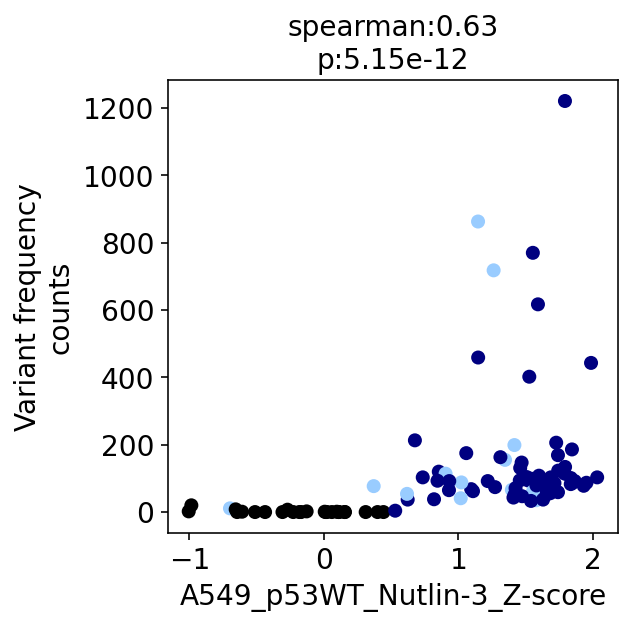

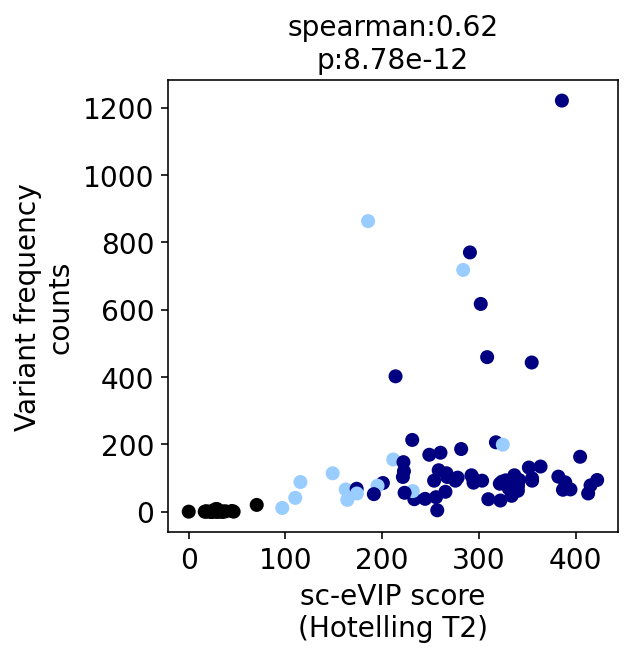

In [9]:
for f1 in ['A549_p53WT_Nutlin-3_Z-score','HotellingT2']:
    mutcount='IARC_Mutation_Counts'
    fun_scatter(anno.loc[overlapping,f1],
                anno.loc[overlapping,mutcount],
               color=anno.loc[overlapping,'Cluster'],
                xname=f1,yname='log counts',corrtype='spearman')
    plt.grid(False)
    plt.ylabel('Variant frequency\ncounts')
    if f1=='HotellingT2':
        plt.xlabel('sc-eVIP score\n(Hotelling T2)')
    
    plt.savefig(FIGS+'/'+PROTEIN+'.'+f1+'_vs_mutfreq.counts.pdf',bbox_inches = "tight") 
    plt.savefig(FIGS+'/'+PROTEIN+'.'+f1+'_vs_mutfreq.counts.png',bbox_inches = "tight")
    plt.show()

In [10]:
#restrict to variants with features. excludes synonymous variants
f='/ahg/regevdata/projects/bn10_cancer_variants/bn10_oana_2018-06-22/results/2018-06-22/results/2019-06-07/TP53/mutational_signatures/TP53_mutationalSignatures_Giacomelli.txt'
mutsig_init=pd.read_csv(f,sep='\t',skiprows=1)
mutsig_init=mutsig_init.iloc[:,:41]
mutsig_restricted=mutsig_init.dropna(axis='index')####### remove items without mutational signatures
mutsig_restricted.index=mutsig_restricted['Allele']

print(mutsig_restricted.head())
print(mutsig_restricted.shape)


       Allele AA_wt AA_variant  Position  A549_p53WT_Nutlin-3_Z-score  \
Allele                                                                  
R175H   R175H     R          H       175                     1.791388   
R248Q   R248Q     R          Q       248                     1.233480   
R273H   R273H     R          H       273                     1.145501   
R248W   R248W     R          W       248                     1.552718   
R273C   R273C     R          C       273                     1.261347   

        A549_p53NULL_Nutlin-3_Z-score  A549_p53NULL_Etoposide_Z-score  \
Allele                                                                  
R175H                        0.538396                       -0.744765   
R248Q                        0.217053                       -0.985385   
R273H                        1.077844                       -1.438387   
R248W                        0.613931                       -0.689231   
R273C                        0.314304             

       Count_pancan  effect size cluster_color
P359P           NaN     0.000000         black
T170T           NaN    16.528121         black
D21D            NaN    20.950658         black
A83V            NaN    30.995665         black
P153P           NaN    23.667910         black


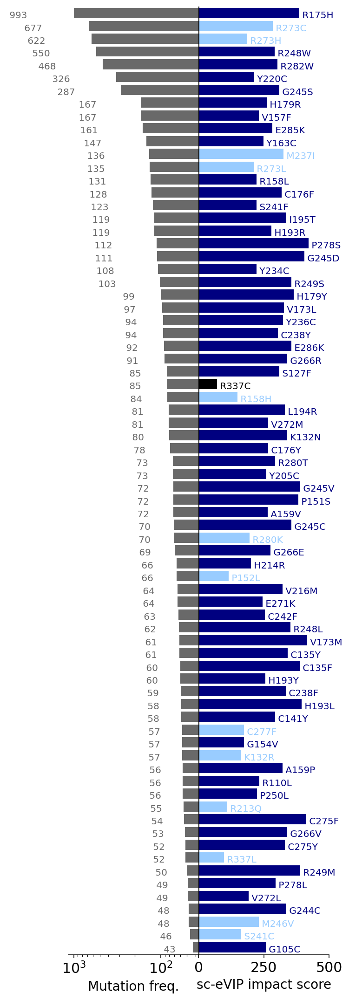

In [11]:
#effect size vs mut freq

#plot impact score vs mutation frequency

#- get the data
score='HotellingT2'
mutdata=pd.DataFrame({'Count_pancan':anno.loc[sorted_variants,'Count_pancan'],
                     'effect size':anno.loc[sorted_variants,score],
                     'cluster_color':anno.loc[sorted_variants,'Cluster']},
                    index=sorted_variants)
print(mutdata.head())
mutdata=mutdata.dropna(subset=['Count_pancan'])
mutdata=mutdata.sort_values(by=['Count_pancan','effect size'])
mutdata['Count_pancan']=pd.DataFrame(mutdata['Count_pancan'],dtype=float)
mutdata['color_mutant_freq']='lightgray'
mutdata.loc[mutdata['Count_pancan']>=20,'color_mutant_freq']='dimgray'

#- make the plot
multiply_impact_score=1

fig,plots=plt.subplots(1,2)
fig.set_size_inches(5,18)
fig.subplots_adjust(wspace=0, hspace=0)

plots[1].barh(mutdata.index,
           mutdata['effect size']*multiply_impact_score,
           color=mutdata['cluster_color'])

plots[0].barh(mutdata.index,
           mutdata['Count_pancan'],
          color=mutdata['color_mutant_freq'])
plots[0].set_xscale('log')
plots[0].invert_xaxis()

plots[1].axvline(x=0,color='black')
for i in range(2):
    plots[i].set_ylim(-0.6,mutdata.shape[0]-0.5)
    plots[i].spines['right'].set_visible(False)
    plots[i].spines['left'].set_visible(False)
    plots[i].spines['top'].set_visible(False)
    plots[i].set_yticks([])

#annotate the number of mutations and the variants
n=mutdata.shape[0]
for i in range(n):
    variant=list(mutdata.index)[i]
    effect_size=list(mutdata['effect size'])[i]
    effect_size_plot=multiply_impact_score*effect_size
    effect_size_color=list(mutdata['cluster_color'])[i]
    mutfreq=int(list(mutdata['Count_pancan'])[i])
    mutfreq_plot=mutfreq
    mutfreq_color=list(mutdata['color_mutant_freq'])[i]
    if mutfreq_color=='lightgray':
        mutfreq_color='gray'
    
    if len(str(mutfreq))==1:
        mut_position=mutfreq_plot*2.5
    if len(str(mutfreq))==2:
        mut_position=mutfreq_plot*3.5
    if len(str(mutfreq))==3:
        mut_position=mutfreq_plot*6
    if len(str(mutfreq))==4:
        mut_position=mutfreq_plot*10
    plots[0].text(mut_position-50,i-0.4,' '+str(int(mutfreq)),
                 color=mutfreq_color)
    
    variant_text=' '+variant
    if anno.loc[variant,'mutation_type']=='Multiple':
        variant_text=variant_text+' (multi)'
    plots[1].text(effect_size_plot,i-0.4,variant_text,
                 color=effect_size_color)
plots[1].set_xticks([0,250,500])
plots[1].set_xticklabels([0,int(250.0/multiply_impact_score),
                          int(500.0/multiply_impact_score)],fontsize=15)
plots[0].tick_params(axis='x', labelsize=15)
plots[0].set_xlabel('Mutation freq.')
plots[1].set_xlabel('sc-eVIP impact score')
plots[0].grid(False)
plots[1].grid(False)


plt.savefig(FIGS+'/'+PROTEIN+'.EffectSize_vs_mutfreq.pdf',bbox_inches = "tight") 
plt.savefig(FIGS+'/'+PROTEIN+'.EffectSize_vs_mutfreq.png',bbox_inches = "tight")
plt.show()

Data for the model
===

Keep only variants with mutational signatures annotated. That removed the synonymous variants.

In [11]:
#define data
data=pd.DataFrame(mutsig_restricted)
# need to add HotellingT2
data['HotellingT2']=anno.loc[data.index,'HotellingT2']

#check which of our variants are in the Giacomelli dataset
overlapping=set(mutsig_restricted.index).intersection(set(anno.index))
print('variants in Giacomelli',len(overlapping))
print(overlapping)
missed=set(anno.index).difference(set(mutsig_restricted.index))
print('variants not in Giacomelli',len(missed))
print(missed)

data['has_effsize']=False
data.loc[list(overlapping),'has_effsize']=True

print('Data',data.columns)

variants in Giacomelli 84
{'G245S', 'R280K', 'S366A', 'G266E', 'R248L', 'Y163C', 'S127F', 'R175H', 'P152L', 'V272L', 'C238Y', 'E339K', 'C135F', 'V272M', 'A83V', 'R337C', 'V173M', 'G360V', 'Q5R', 'K132N', 'R273C', 'H193L', 'P58R', 'S241F', 'R337L', 'R282W', 'R273L', 'C277F', 'P278S', 'Y236C', 'C238F', 'C275Y', 'P250L', 'E285K', 'R213Q', 'R249S', 'G244C', 'E271K', 'R249M', 'L194R', 'C135Y', 'E286K', 'R273H', 'V157F', 'H179R', 'C275F', 'M237I', 'P47S', 'R158H', 'Y234C', 'G245V', 'H193R', 'H193Y', 'H214R', 'P278L', 'V31I', 'R158L', 'P151S', 'R248W', 'R110L', 'G245C', 'Y205C', 'H179Y', 'C242F', 'G266R', 'Y220C', 'C176Y', 'A159V', 'G266V', 'A159P', 'V216M', 'K132R', 'T312S', 'G245D', 'C141Y', 'M246V', 'R280T', 'S241C', 'V173L', 'C176F', 'I195T', 'G154V', 'Y107H', 'G105C'}
variants not in Giacomelli 15
{'P359P', 'P153P', 'E2E', 'P36P', 'R158R', 'V216V', 'P47P', 'L344L', 'P222P', 'WT', 'T118T', 'P301P', 'T170T', 'P295P', 'D21D'}
Data Index(['Allele', 'AA_wt', 'AA_variant', 'Position',
       '

/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/pandas/core/indexing.py:1017: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  return getattr(section, self.name)[new_key]


In [12]:
#===================================================================================

signature_cols=['Signature_1',
       'Signature_5',
       'Signature_2',
       'Signature_4',
       'Signature_6',
       'Signature_7',
       'Signature_13',
       'Signature_24',]
impact_cols=['HotellingT2']
pheno_cols=['A549_p53WT_Nutlin-3_Z-score', 
       'A549_p53NULL_Nutlin-3_Z-score',
       'A549_p53NULL_Etoposide_Z-score']
yname='IARC_Mutation_Counts'

#record model performances here
performances=pd.DataFrame(columns=['condition','pearson','spearman','r2','fold'])

Recapitulate Giacomelli results
===

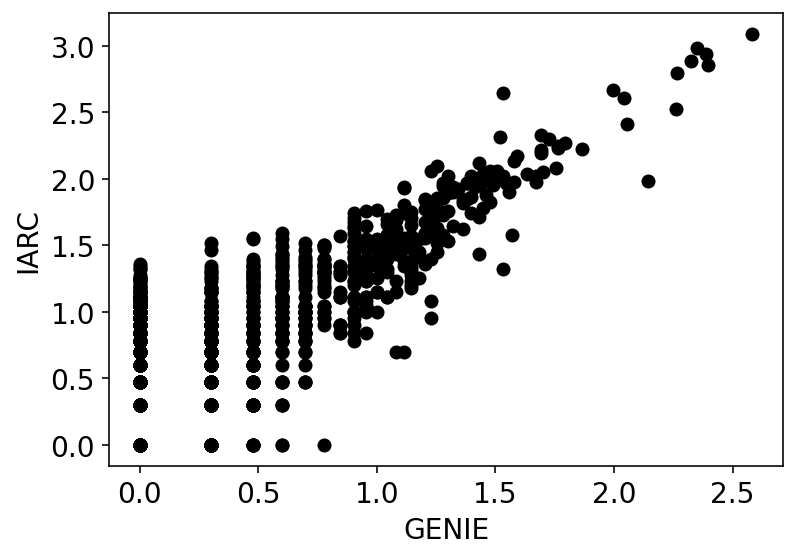

In [13]:
#check out concordance between GENIE and IARC
plt.scatter(np.log10(1+data['GENIE_Mutation_Counts']),
            np.log10(1+data['IARC_Mutation_Counts']),
            color='black')
plt.xlabel('GENIE')
plt.ylabel('IARC')
plt.grid(False)
plt.show()

In [14]:
def get_positions_train_valid(data_pos,rng):
    
    positions=list(set(data_pos))
    train_positions=rng.choice(positions,size=int(len(positions)/2),replace=False)
    
    train_col=[]
    for j in range(len(data_pos)):
        curr_pos=data_pos[j]
        if curr_pos in train_positions:
            train_col.append(True)
        else:
            train_col.append(False)
    return(train_col)

def get_train_valid_datasets(data_here,
                            features,
                            training_pos_col,valid_pos_col,
                         training_y_name,valid_y_name,
                            offset_col=None):
    
    #subset data
    d={}
    d['x_train']=data_here.loc[data_here[training_pos_col]==True,features]
    d['y_train']=data_here.loc[data_here[training_pos_col]==True,training_y_name]
    d['x_valid']=data_here.loc[data_here[valid_pos_col]==True,features]
    d['y_valid']=data_here.loc[data_here[valid_pos_col]==True,valid_y_name]
    if offset_col is not None:
        d['offset_train']=data_here.loc[data_here[training_pos_col]==True,offset_col]
        d['offset_valid']=data_here.loc[data_here[valid_pos_col]==True,offset_col]
    return(d)


def get_model(d):
    import statsmodels.api as sm
    
    #train the model
    if 'offset_train' in d.keys():
        glm_binom=sm.GLM(d['y_train'], d['x_train'],family=sm.families.Poisson(),
                        offset=d['offset_train'])
    else:
        glm_binom = sm.GLM(d['y_train'], d['x_train'],family=sm.families.Poisson())
    res=glm_binom.fit_regularized()
    #res=glm_binom.fit()
    return(res)

def get_pred_by_position(y_here,data_with_position):
    df=pd.DataFrame(y_here,index=y_here.index)
    df['posi']=data_with_position.loc[df.index,'Position']
    #collapse to average
    pos_scores=df.groupby('posi').mean()
    pos_scores['pos']=pos_scores.index
    pos_scores=pos_scores.sort_values(by='pos')
    return(pos_scores)

def model_performance_by_position(y_true_train,y_true_valid,y_train_pred,y_valid_pred,data_with_position,ax1,ax2):
    y_true_train_pos=get_pred_by_position(y_true_train,data_with_position)
    ax1.plot(y_true_train_pos['pos'],y_true_train_pos.iloc[:,0],color='gray')
    
    y_true_valid_pos=get_pred_by_position(y_true_valid,data_with_position)
    ax2.plot(y_true_valid_pos['pos'],y_true_valid_pos.iloc[:,0],color='black')
    
    y_train_pos=get_pred_by_position(y_train_pred,data_with_position)
    ax1.plot(y_train_pos['pos'],-y_train_pos.iloc[:,0],color='deepskyblue')
    
    y_valid_pos=get_pred_by_position(y_valid_pred,data_with_position)
    ax2.plot(y_valid_pos['pos'],-y_valid_pos.iloc[:,0],color='blue')
    
    ax1.grid(False)
    ax2.grid(False)
    
def model_performance(x,y,model_res,toprint,ax,mycolor,log_it=False):
    #should return the predictions
    y_pred=model_res.predict(x)
    y2=y
    y2_pred=y_pred
    
    pred_df=pd.DataFrame({'obs':y,
                         'pred':y_pred})
    if log_it:
        y2=np.log10(y+1)
        y2_pred=np.log10(y_pred+1)
    
    from scipy.stats import spearmanr,pearsonr
    from sklearn.metrics import r2_score
    p=pearsonr(y2,y2_pred)[0]
    p=str(int(100*p)/100)
    r2=r2_score(y2,y2_pred)
    r2=str(int(100*r2)/100)
    sp=spearmanr(y2,y2_pred)[0]
    sp=str(int(100*sp)/100)
    
    return(y_pred,p,sp,r2,pred_df)

def model_full(data_here,
               features,
                training_pos_col,valid_pos_col,
                training_y_name,valid_y_name,
                offset_col=None,
              toprint=''):
    
    import copy
    
    fig,plots=plt.subplots(1,5)
    fig.set_size_inches(25,3)
    
    
    d_here={}
    
    #setup dataset, training, test
    d_here['data']=get_train_valid_datasets(data_here,
                features,
                training_pos_col,valid_pos_col,
                training_y_name,valid_y_name,
                offset_col)
    
    #train the model
    d_here['model']=get_model(d_here['data'])
    
    #get the model performance, for the training and validation sets
    d_here['pred_train'],p_train,sp_train,r2_train,y_train_pred=model_performance(d_here['data']['x_train'],
                                     d_here['data']['y_train'],
                                     d_here['model'],
                                   'training',
                                    plots[0],'lightblue')
    
    d_here['pred_valid'],p_valid,sp_valid,r2_valid,y_valid_pred=model_performance(d_here['data']['x_valid'],
                                     d_here['data']['y_valid'],
                                     d_here['model'],
                                   toprint+'\ntrain: '+str(d_here['data']['x_train'].shape[0])+
                                            ', test: '+str(d_here['data']['x_valid'].shape[0])+'\nvalidation',
                                    plots[1],'blue')
    
    #make a prediction with the model on the entire dataset
    data_here_cp=copy.deepcopy(data_here)
    data_here_cp['all']=True
    totals={}
    totals['data']=get_train_valid_datasets(data_here_cp,
                features,
                'all','all',
                training_y_name,valid_y_name,
                offset_col)
    
    #######
    '''
    data_here_cp[toprint],p_total,sp_total,r2_total,y_total_pred=model_performance(totals['data']['x_valid'],
                                     totals['data']['y_valid'],
                                     d_here['model'],
                                   'all data',
                                    plots[2],'purple')
    '''
    
    model_performance_by_position(d_here['data']['y_train'],
                                  d_here['data']['y_valid'],
                                  y_train_pred,
                                  y_valid_pred,
                                  data_here,
                                  plots[3],plots[4])
    
    performance_here=pd.DataFrame({'condition':toprint,
                                  'pearson':p_valid,
                                  'spearman':sp_valid,
                                  'r2':r2_valid},index=[0])
    plt.show()
    
    to_return={}
    #to_return['dataset']=data_here_cp
    to_return['model']=d_here['model']
    to_return['obs_train']=d_here['data']['y_train']
    to_return['obs_valid']=d_here['data']['y_valid']
    to_return['pred_train']=d_here['pred_train']
    to_return['pred_valid']=d_here['pred_valid']
    to_return['obs_all']=totals['data']['y_valid']
    #to_return['pred_all']=data_here_cp[toprint]
    return(to_return,p_valid,sp_valid,r2_valid,performance_here)

def plot_performance(preds,titlename='',mini=-0.5,maxi=5):
    fig,ax=plt.subplots(1)
    fig.set_size_inches(2,2)
    
    for item in ['train','valid']:
        if item=='train':
            c='lightgray'
        if item=='valid':
            c='black'
        ax.scatter(np.log10(preds['pred_'+item]+1),
            np.log10(preds['obs_'+item].loc[preds['pred_'+item].index]+1),s=5,color=c,
                          alpha=0.5)

        ###ax.set_xlim(mini,maxi)
        ###ax.set_ylim(mini,maxi)        
        ###ax.set_xticks([])
        
        ax.set_yticks([0,maxi/2,maxi])
        ax.set_ylabel('observed counts\n(log10(counts+1))')
        ax.set_ylabel('')
        ax.grid(False)
        
    ax.set_xticks([0,maxi/2,maxi])
    ax.set_xlabel('predicted counts\n(log10(counts+1))')
    ax.set_title(titlename)
    ax.set_ylabel('observed counts\nlog10(counts+1)')
    return(ax)


phenoMut_traintestAllvariants ['Signature_5', 'Signature_4', 'A549_p53WT_Nutlin-3_Z-score', 'Signature_13', 'Signature_6', 'A549_p53NULL_Nutlin-3_Z-score', 'Signature_24', 'Signature_1', 'Signature_7', 'A549_p53NULL_Etoposide_Z-score', 'Signature_2']


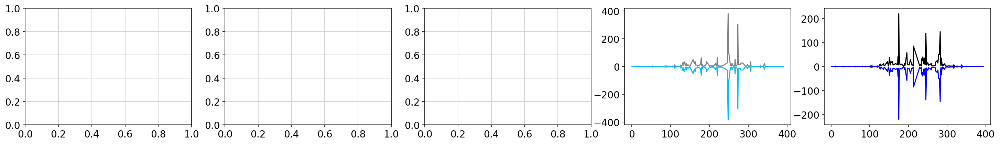

/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:37: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



In [15]:
#record model performances here
performances=pd.DataFrame(columns=['condition','fold','pearson','spearman','r2'])

for i in range(1):
    #define train, validation sets
    #==============================
    #randomize train/test - by position
    foldname='fold'+str(i)
    rng=np.random.RandomState(1234)
    data[foldname]=get_positions_train_valid(copy.deepcopy(data['Position']),rng)
    
    data[foldname+'not']=(data[foldname]==False)
    
    #train each model of interest
    #============================
    model2features={}
    model2features['phenoMut_traintestAllvariants']=list(set(pheno_cols).union(set(signature_cols)))

    model2train={}
    model2train['phenoMut_traintestAllvariants']=foldname

    model2valid={}
    model2valid['phenoMut_traintestAllvariants']=foldname+'not'

    for model_name in model2features.keys(): 
        
        features=model2features[model_name]
        print(model_name,features)
        performance_current=model_full(data,
                    features,
                    training_pos_col=model2train[model_name],
                    valid_pos_col=model2valid[model_name],
                    training_y_name=yname,
                    valid_y_name=yname,
                  toprint=model_name)[4]
        performance_current['fold']=foldname
        performances=pd.concat([performances,performance_current],axis=0)
        


In [16]:
#make 1 of each plot

def plot_performance(preds,titlename='',mini=-0.5,maxi=5):
    fig,ax=plt.subplots(1)
    fig.set_size_inches(2,2)
    
    for item in ['train','valid']:
        if item=='train':
            c='lightgray'
        if item=='valid':
            c='black'
        ax.scatter(np.log10(preds['pred_'+item]+1),
            np.log10(preds['obs_'+item].loc[preds['pred_'+item].index]+1),s=5,color=c,
                          alpha=0.5)

        ###ax.set_xlim(mini,maxi)
        ###ax.set_ylim(mini,maxi)        
        ###ax.set_xticks([])
        
        ax.set_yticks([0,maxi/2,maxi])
        ax.set_ylabel('observed counts\n(log10(counts+1))')
        ax.set_ylabel('')
        ax.grid(False)
        
    ax.set_xticks([0,maxi/2,maxi])
    ax.set_xlabel('predicted counts\n(log10(counts+1))')
    ax.set_title(titlename)
    ax.set_ylabel('observed counts\nlog10(counts+1)')
    return(ax)

def get_pred_by_position(y_here,data_with_position):
    df=pd.DataFrame(y_here,index=y_here.index)
    df['posi']=data_with_position.loc[df.index,'Position']
    #collapse to average
    pos_scores=df.groupby('posi').mean()
    pos_scores['pos']=pos_scores.index
    pos_scores=pos_scores.sort_values(by='pos')
    return(pos_scores)


    
def avg_by_position(named_scores,data_with_position):
    
    df=pd.DataFrame(named_scores,index=named_scores.index)
    df['position']=data_with_position.loc[df.index,'Position']
    #collapse to average
    pos_scores=df.groupby('position').mean()
    pos_scores['pos']=pos_scores.index
    pos_scores=pos_scores.sort_values(by='pos')
    return(pos_scores)
    
    


=============== iteration 0


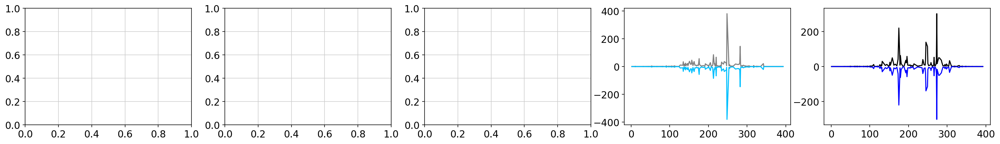

                                           condition pearson spearman     r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Te...    0.73     0.66  -0.24


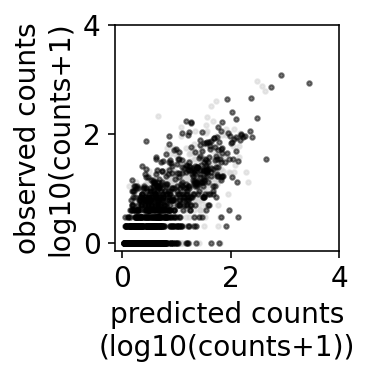

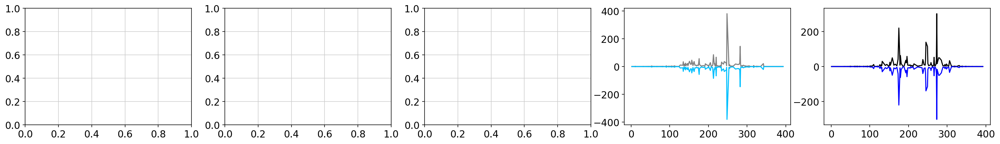

                                           condition pearson spearman    r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Te...    0.21     0.66  0.03


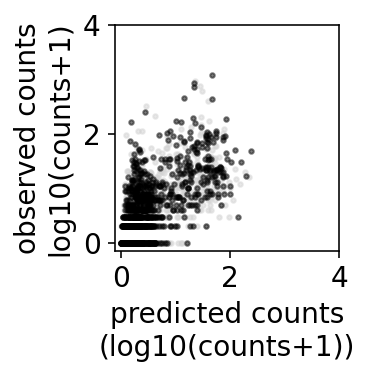

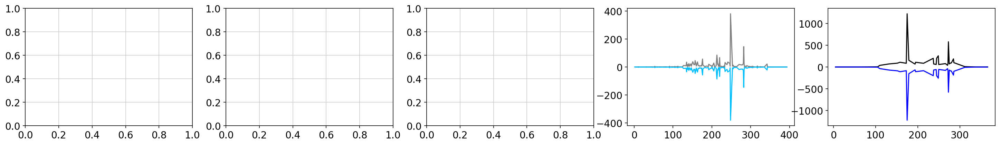

                                           condition pearson spearman     r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Te...    0.71     0.57  -0.63


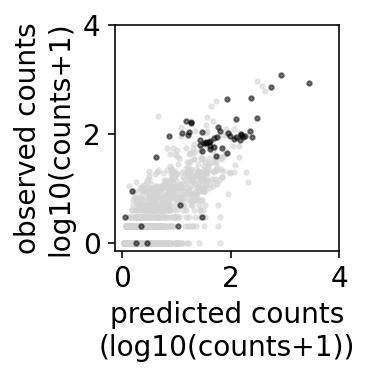

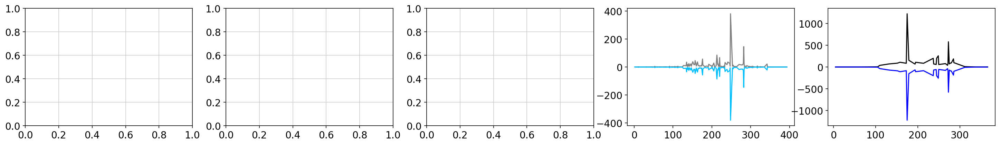

                                           condition pearson spearman     r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Te...    0.16     0.45  -0.25


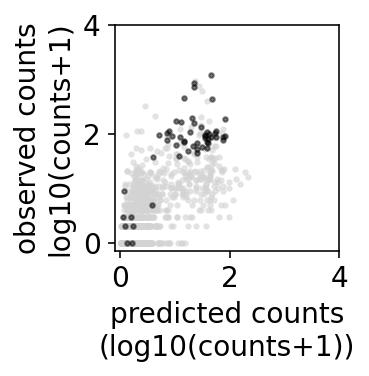

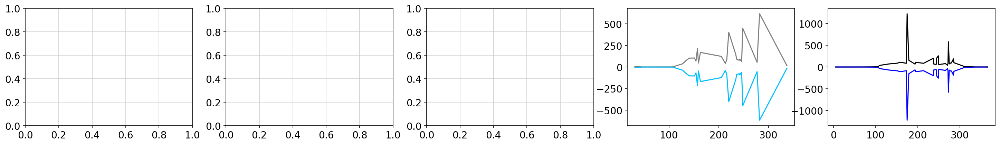

                                           condition pearson spearman     r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Te...    0.13     0.27  -16.1


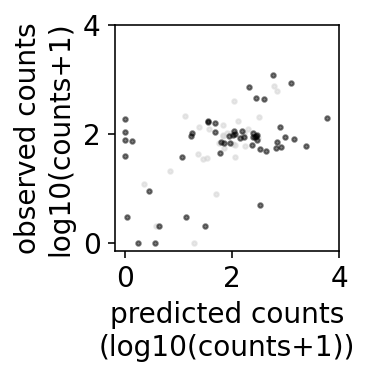

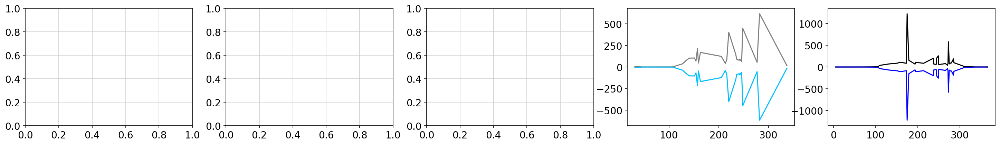

                                           condition pearson spearman     r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain S \n Te...    0.26     0.45  -0.09


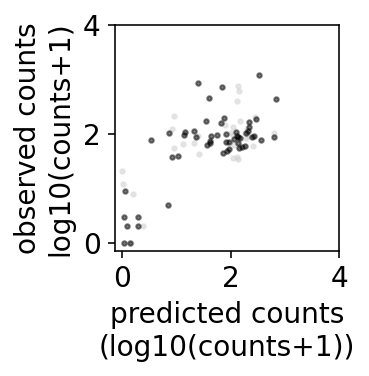

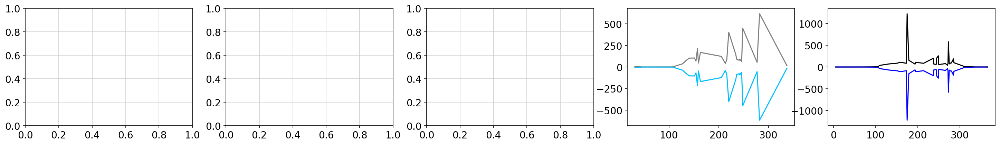

                                           condition pearson spearman      r2
0  Cell. Nutlin3 \n Mut. + \n sc-eVIP - \nTrain S...    0.11     0.28  -19.84


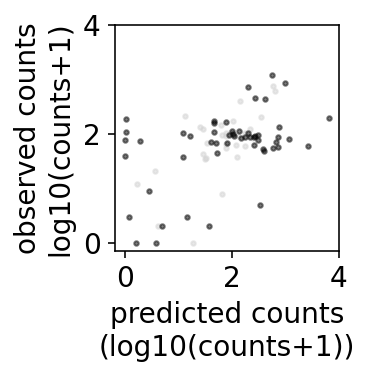

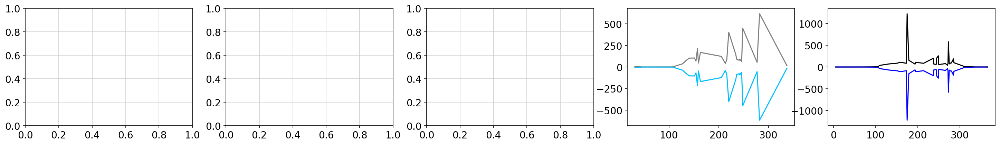

                                           condition pearson spearman     r2
0  Cell. Nutlin3 \n Mut. - \n sc-eVIP - \nTrain S...    0.17     0.41  -0.11


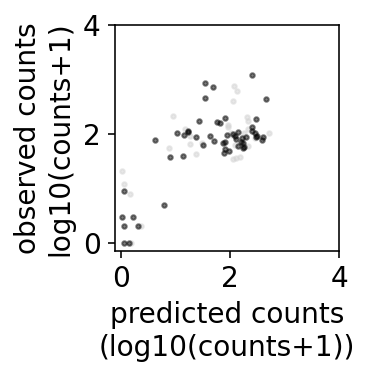

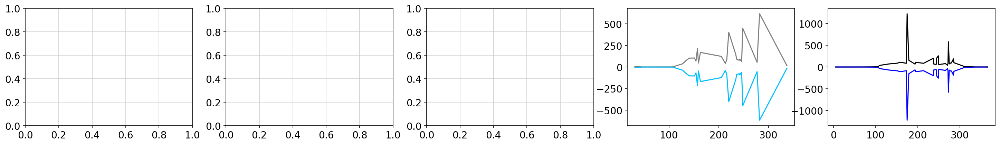

                                           condition pearson spearman      r2
0  Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Te...    0.09     0.36  -52.47


/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/statsmodels/genmod/families/family.py:460: RuntimeWarning: divide by zero encountered in log
  return var_weights / scale * (endog * np.log(mu) - mu -
/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/scipy/optimize/optimize.py:1985: RuntimeWarning: invalid value encountered in double_scalars
  tmp2 = (x - v) * (fx - fw)


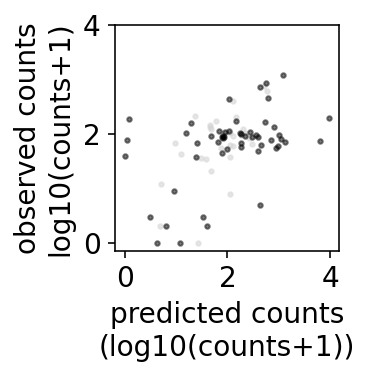

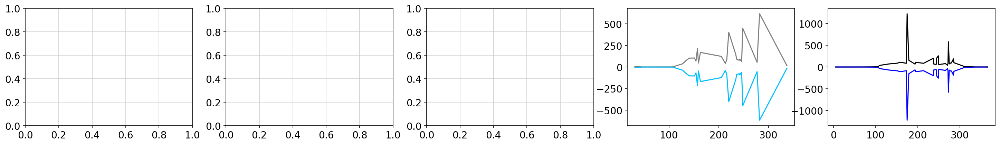

                                           condition pearson spearman     r2
0  Cell. - \n Mut. - \n sc-eVIP + \nTrain S \n Te...    0.11     0.37  -0.98


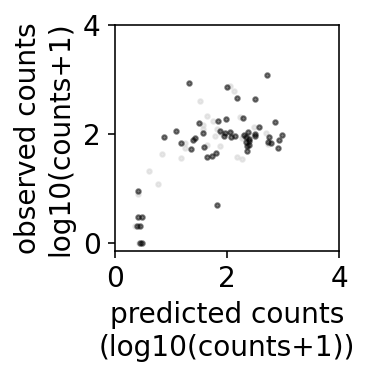

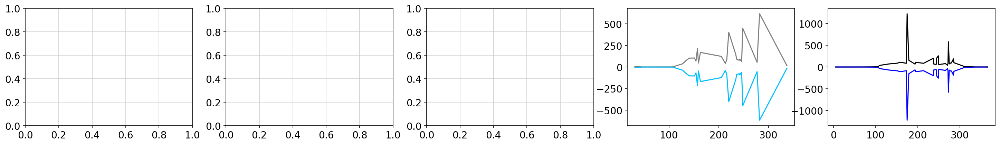

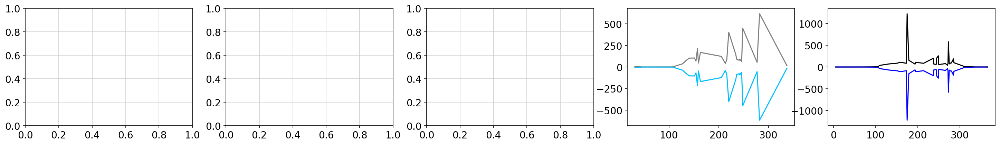

R248W    147
R282W     65
Y220C    402
V157F    103
C176F     94
Name: 0, dtype: int64
R175H     86
R273H    101
R273C     92
G245S    108
R249S      1
Name: 0, dtype: int64
R175H     3
R248Q    23
R273H     5
R248W     6
R273C     5
Name: 0, dtype: int64
=============== iteration 1


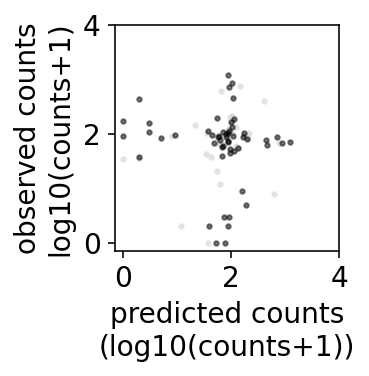

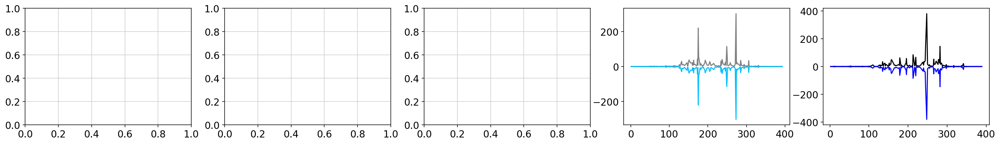

                                           condition pearson spearman   r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Te...    0.65     0.68  0.4


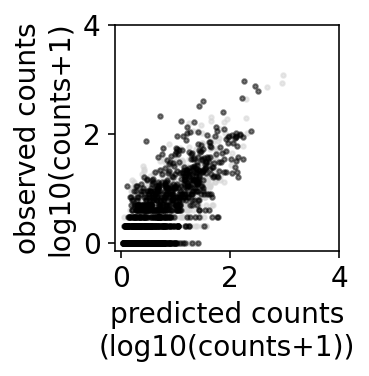

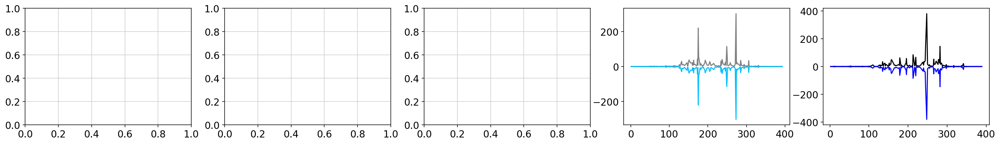

                                           condition pearson spearman   r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Te...     0.2     0.64  0.0


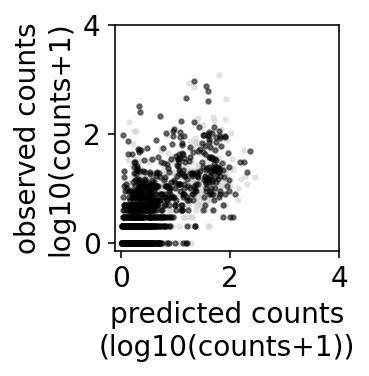

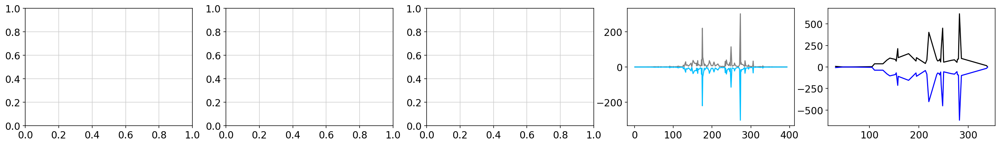

                                           condition pearson spearman    r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Te...    0.62     0.36  0.27


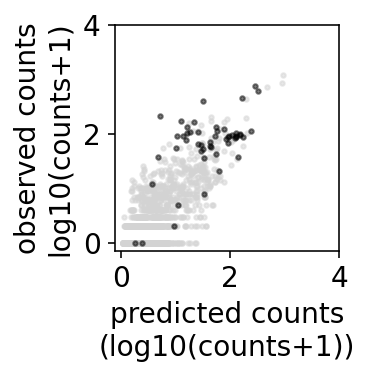

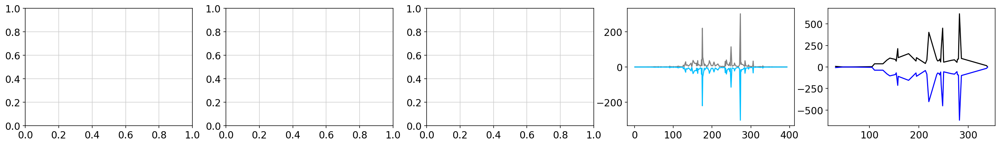

                                           condition pearson spearman     r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Te...    0.15     0.36  -0.36


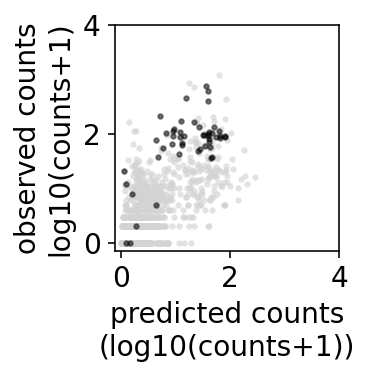

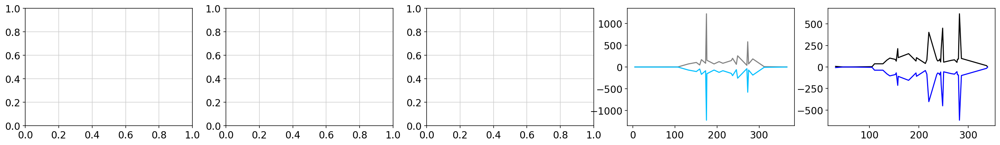

                                           condition pearson spearman    r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Te...     0.4     0.35  -0.9


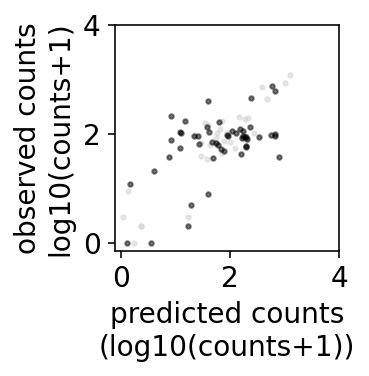

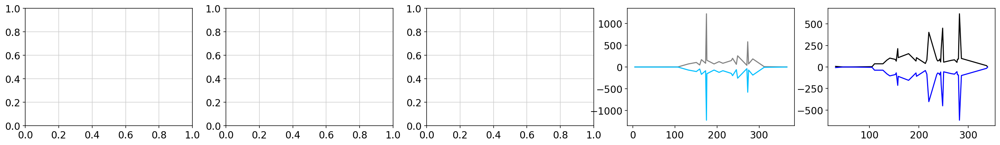

                                           condition pearson spearman     r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain S \n Te...    0.19     0.42  -0.26


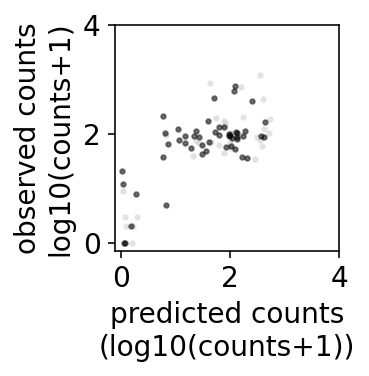

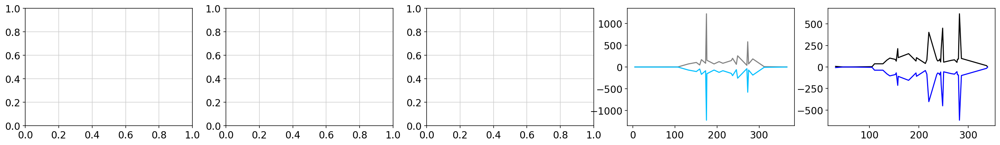

                                           condition pearson spearman    r2
0  Cell. Nutlin3 \n Mut. + \n sc-eVIP - \nTrain S...    0.71     0.37  0.47


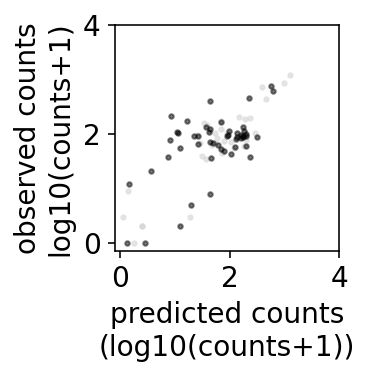

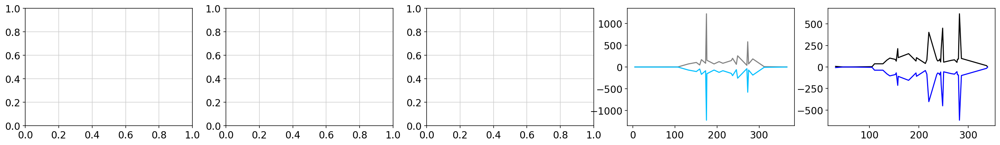

                                           condition pearson spearman     r2
0  Cell. Nutlin3 \n Mut. - \n sc-eVIP - \nTrain S...    0.09     0.35  -0.37


/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/statsmodels/genmod/families/family.py:460: RuntimeWarning: divide by zero encountered in log
  return var_weights / scale * (endog * np.log(mu) - mu -
/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/scipy/optimize/optimize.py:1985: RuntimeWarning: invalid value encountered in double_scalars
  tmp2 = (x - v) * (fx - fw)


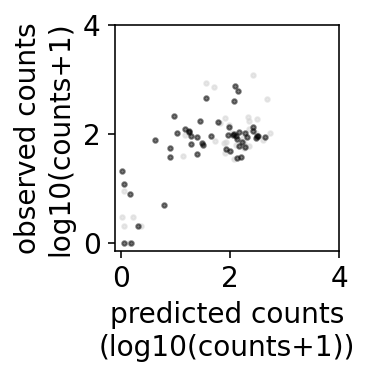

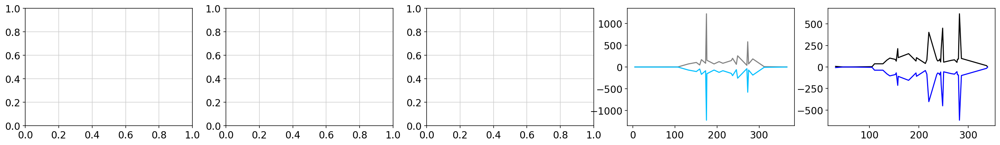

                                           condition pearson spearman  \
0  Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Te...   -0.04     0.35   

           r2  
0  -269230.92  


/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/statsmodels/genmod/families/family.py:460: RuntimeWarning: divide by zero encountered in log
  return var_weights / scale * (endog * np.log(mu) - mu -
/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/scipy/optimize/optimize.py:1985: RuntimeWarning: invalid value encountered in double_scalars
  tmp2 = (x - v) * (fx - fw)


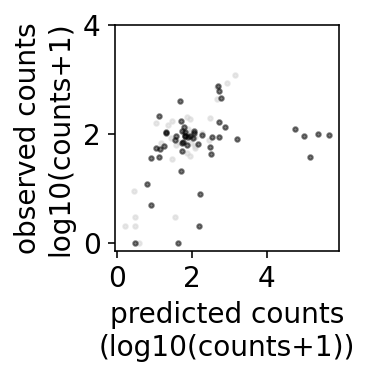

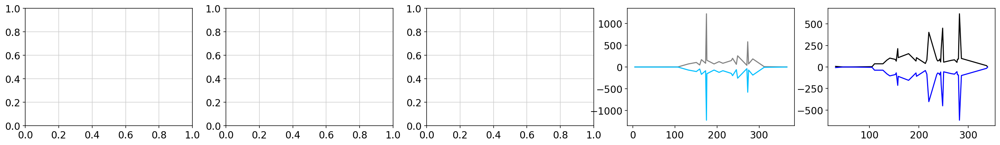

                                           condition pearson spearman     r2
0  Cell. - \n Mut. - \n sc-eVIP + \nTrain S \n Te...    0.04     0.42  -0.84


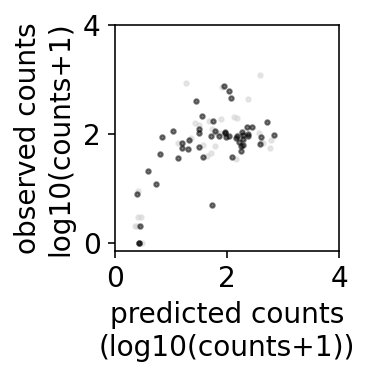

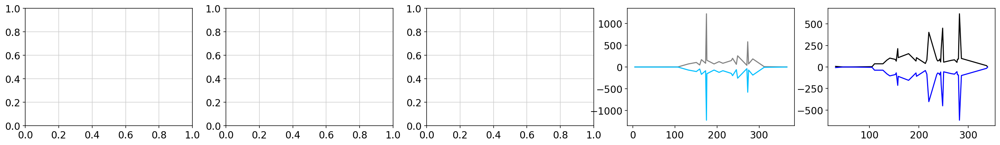

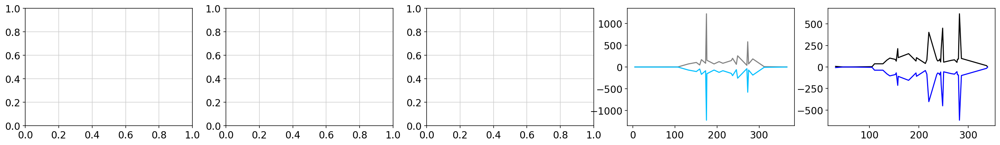

R175H     74
R273H    101
R273C    443
R249S     61
C176F     66
Name: 0, dtype: int64
R248W     69
R282W     94
G245S     37
Y220C      7
V157F    103
Name: 0, dtype: int64
R175H    0
R248Q    1
R273H    0
R248W    6
R273C    2
Name: 0, dtype: int64
=============== iteration 2


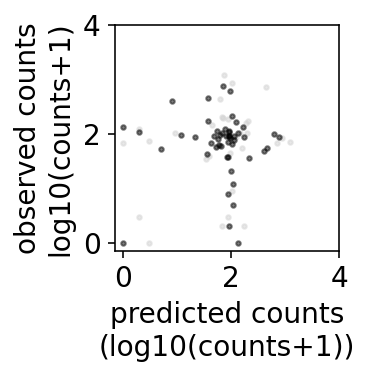

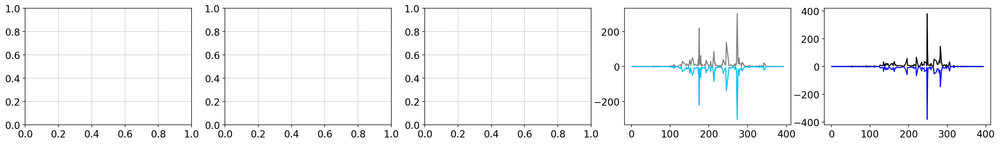

                                           condition pearson spearman    r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Te...    0.75     0.65  0.44


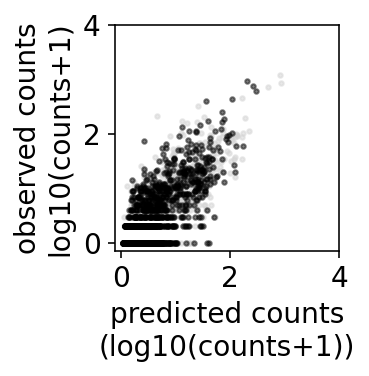

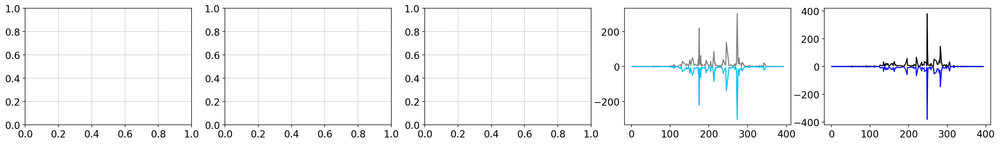

                                           condition pearson spearman     r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Te...     0.2     0.61  -0.01


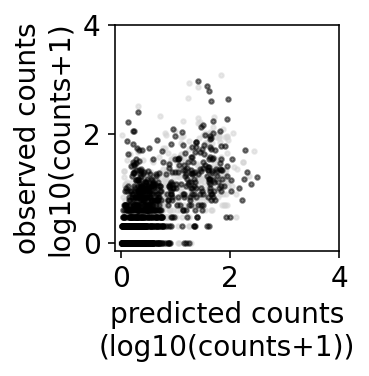

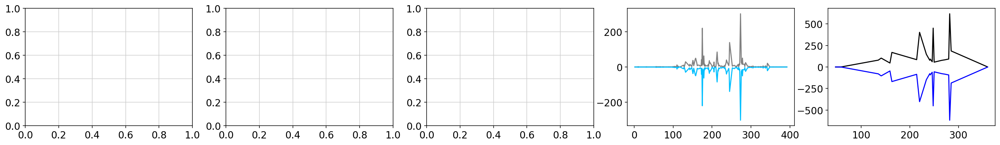

                                           condition pearson spearman    r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Te...    0.77     0.55  0.23


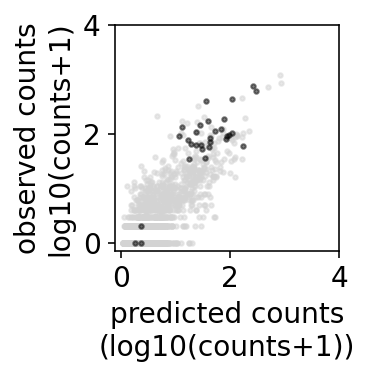

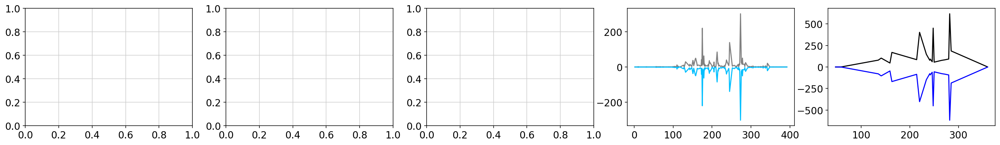

                                           condition pearson spearman     r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Te...    0.33     0.37  -0.31


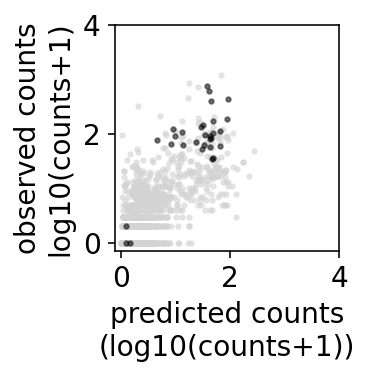

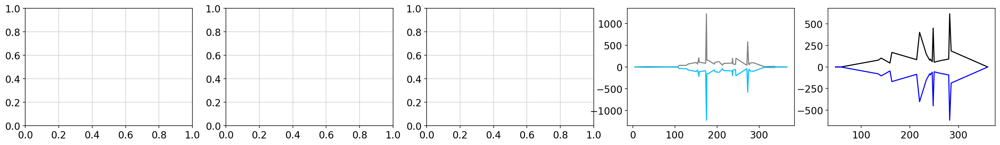

                                           condition pearson spearman    r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Te...    0.86     0.48  0.64


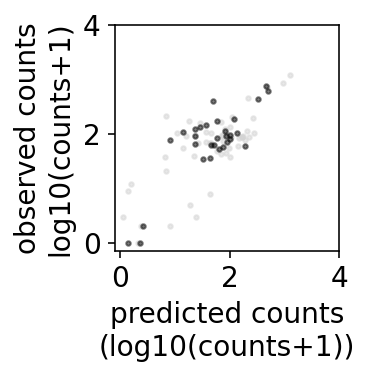

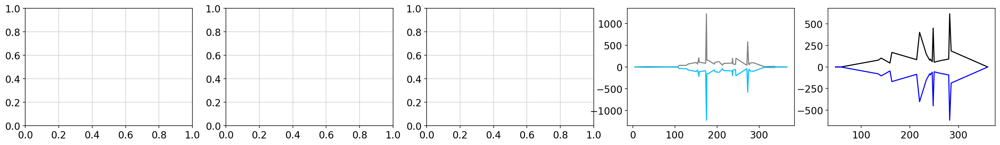

                                           condition pearson spearman     r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain S \n Te...    0.17     0.32  -0.47


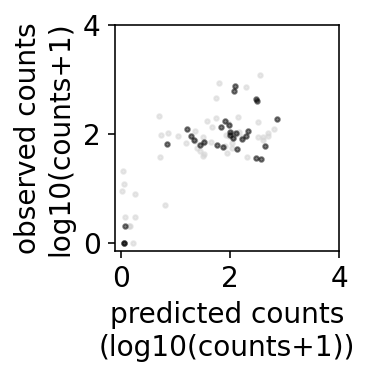

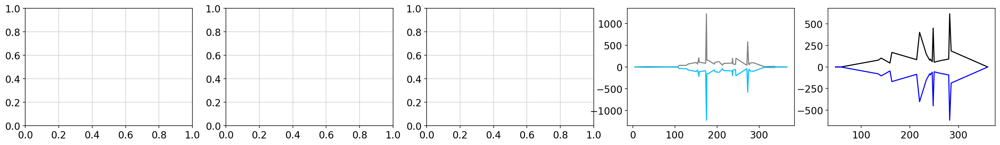

                                           condition pearson spearman    r2
0  Cell. Nutlin3 \n Mut. + \n sc-eVIP - \nTrain S...    0.87     0.48  0.66


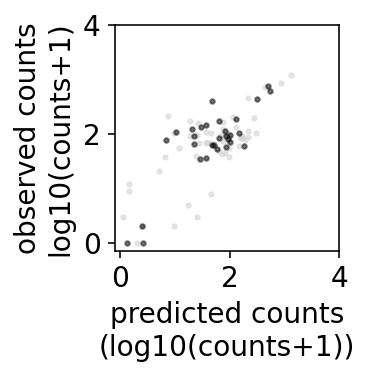

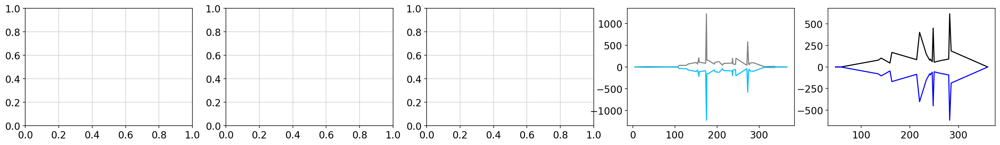

                                           condition pearson spearman    r2
0  Cell. Nutlin3 \n Mut. - \n sc-eVIP - \nTrain S...    0.35     0.42  0.05


/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/statsmodels/genmod/families/family.py:460: RuntimeWarning: divide by zero encountered in log
  return var_weights / scale * (endog * np.log(mu) - mu -
/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/scipy/optimize/optimize.py:1985: RuntimeWarning: invalid value encountered in double_scalars
  tmp2 = (x - v) * (fx - fw)


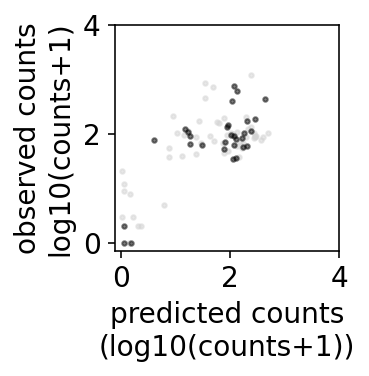

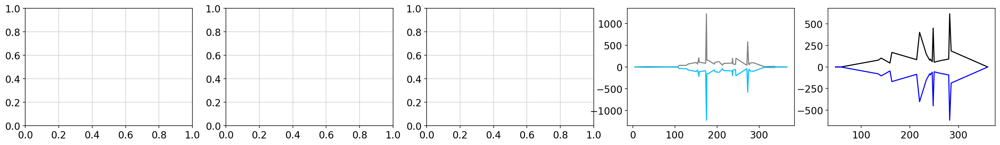

                                           condition pearson spearman    r2
0  Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Te...     0.8     0.51  0.38


/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/statsmodels/genmod/families/family.py:460: RuntimeWarning: divide by zero encountered in log
  return var_weights / scale * (endog * np.log(mu) - mu -
/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/scipy/optimize/optimize.py:1985: RuntimeWarning: invalid value encountered in double_scalars
  tmp2 = (x - v) * (fx - fw)


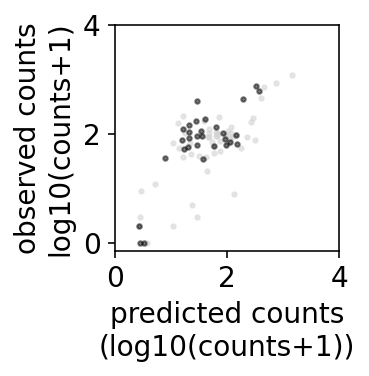

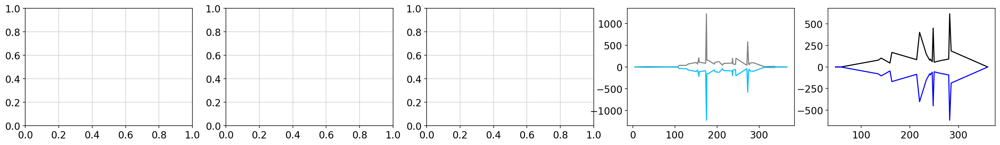

                                           condition pearson spearman     r2
0  Cell. - \n Mut. - \n sc-eVIP + \nTrain S \n Te...    0.07     0.38  -0.27


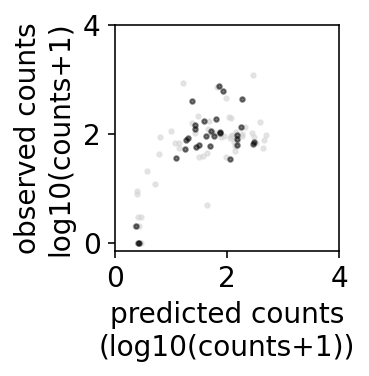

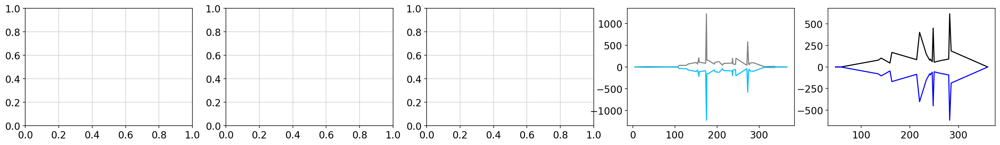

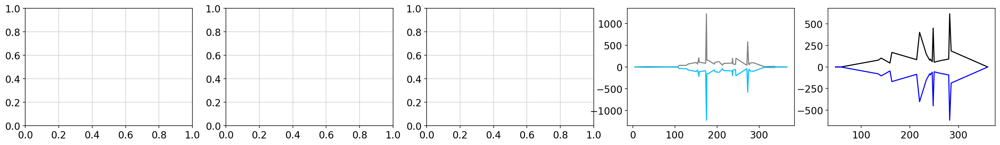

R175H     69
R273H     54
R273C    134
G245S     43
V157F      2
Name: 0, dtype: int64
R248W    147
R282W    103
R249S      0
Y220C    402
E285K     61
Name: 0, dtype: int64
R175H    0
R248Q    1
R273H    1
R248W    0
R273C    0
Name: 0, dtype: int64
=============== iteration 3


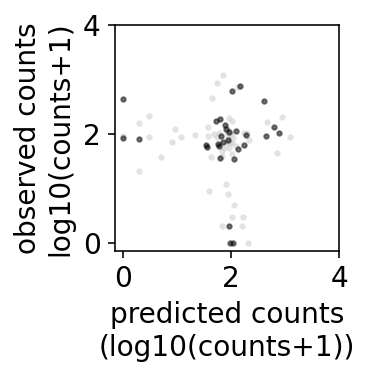

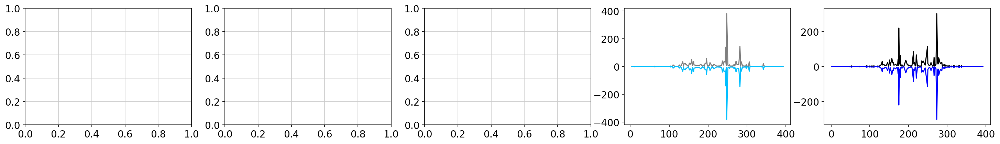

                                           condition pearson spearman    r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Te...    0.84     0.64  0.57


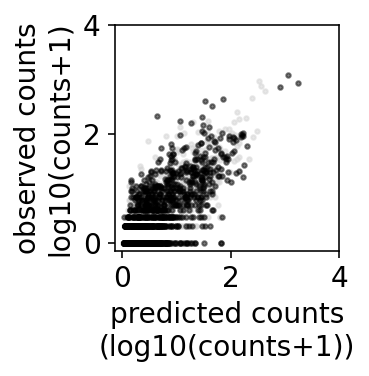

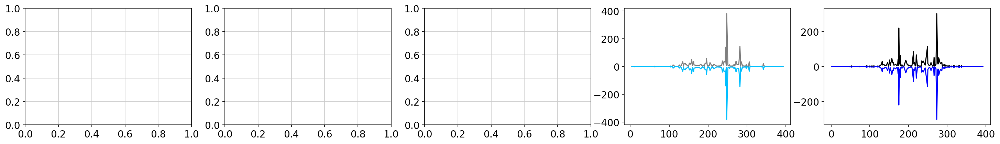

                                           condition pearson spearman    r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Te...    0.21     0.61  0.01


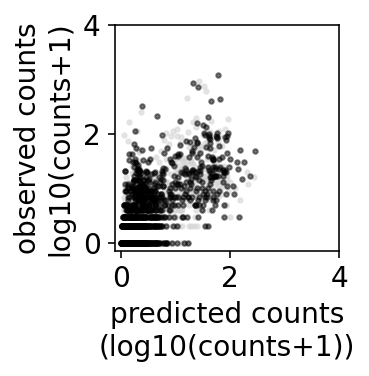

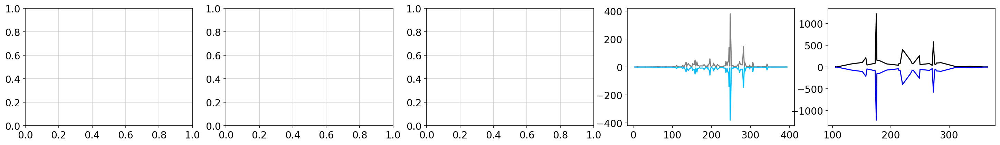

                                           condition pearson spearman    r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Te...    0.84     0.39  0.49


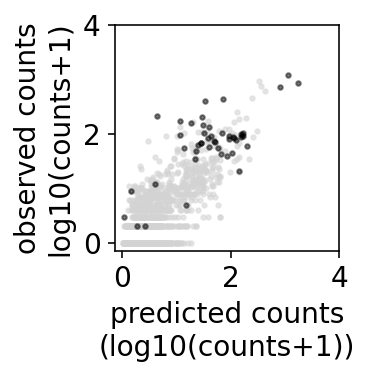

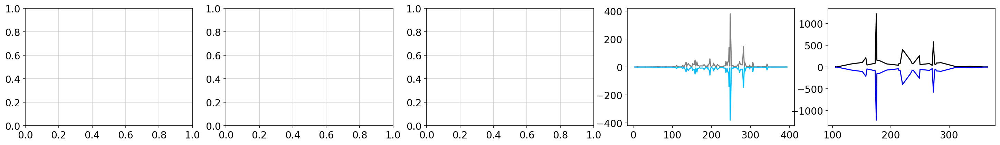

                                           condition pearson spearman     r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Te...    0.16     0.46  -0.22


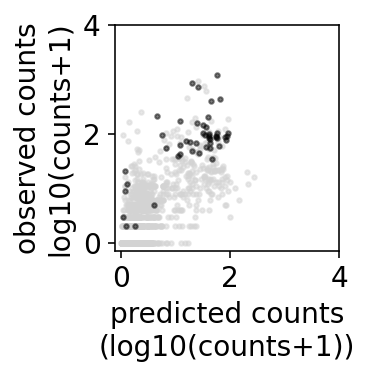

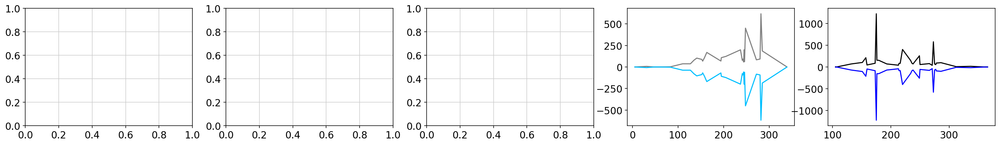

                                           condition pearson spearman    r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Te...    0.85     0.51  0.43


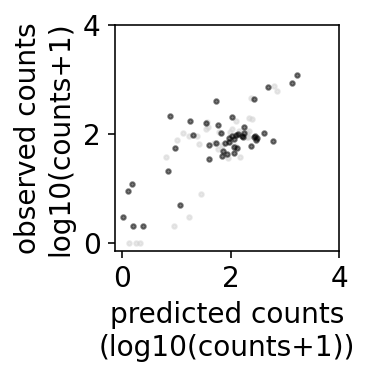

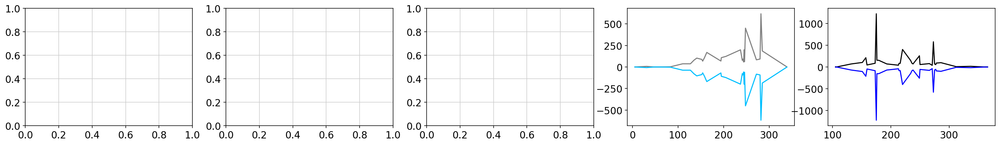

                                           condition pearson spearman     r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain S \n Te...    0.19     0.48  -0.17


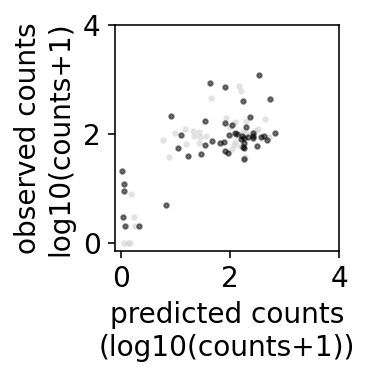

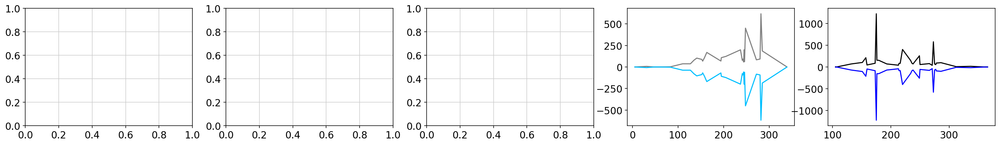

                                           condition pearson spearman    r2
0  Cell. Nutlin3 \n Mut. + \n sc-eVIP - \nTrain S...    0.85     0.54  0.52


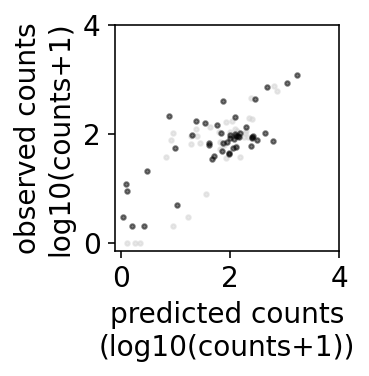

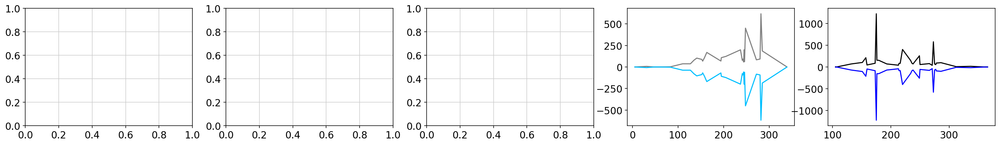

                                           condition pearson spearman     r2
0  Cell. Nutlin3 \n Mut. - \n sc-eVIP - \nTrain S...    0.14     0.46  -0.27


/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/statsmodels/genmod/families/family.py:460: RuntimeWarning: divide by zero encountered in log
  return var_weights / scale * (endog * np.log(mu) - mu -
/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/scipy/optimize/optimize.py:1985: RuntimeWarning: invalid value encountered in double_scalars
  tmp2 = (x - v) * (fx - fw)


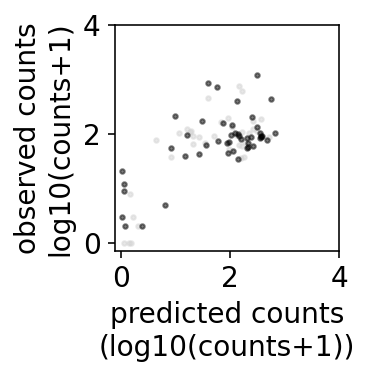

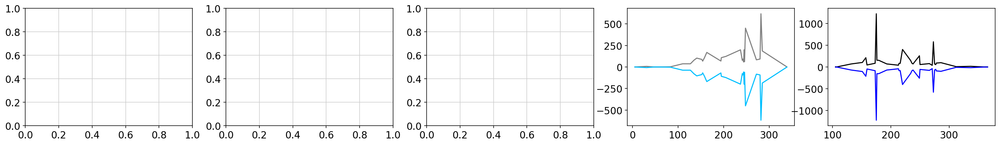

                                           condition pearson spearman    r2
0  Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Te...    0.79     0.43  0.38


/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/statsmodels/genmod/families/family.py:460: RuntimeWarning: divide by zero encountered in log
  return var_weights / scale * (endog * np.log(mu) - mu -
/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/scipy/optimize/optimize.py:1985: RuntimeWarning: invalid value encountered in double_scalars
  tmp2 = (x - v) * (fx - fw)


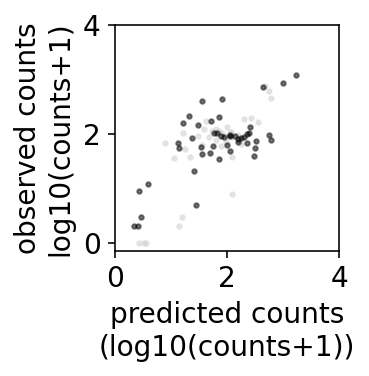

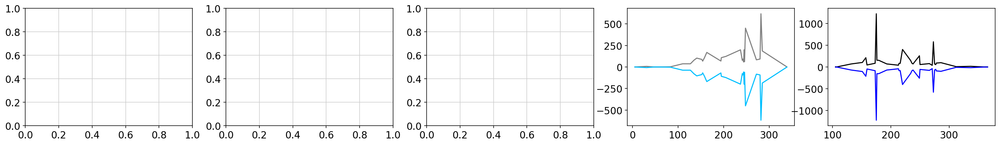

                                           condition pearson spearman     r2
0  Cell. - \n Mut. - \n sc-eVIP + \nTrain S \n Te...    0.09     0.35  -0.44


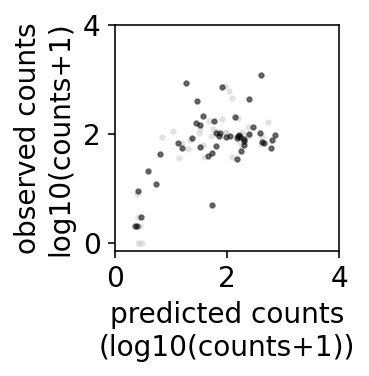

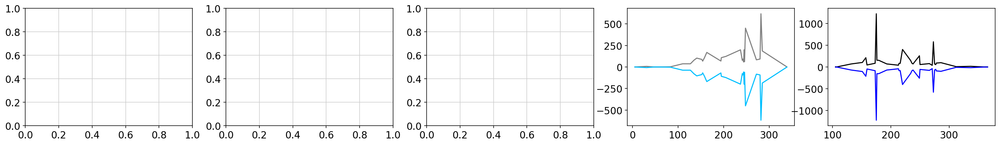

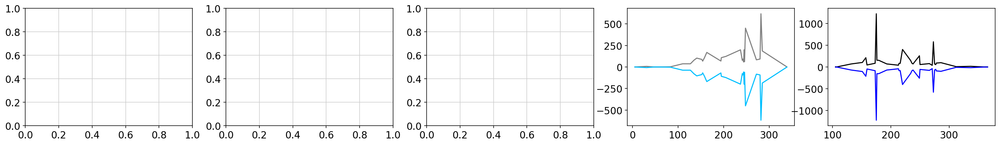

R248W     37
R282W    186
G245S     37
M237I     92
E285K     94
Name: 0, dtype: int64
R175H    147
R273H     41
R273C    443
R249S      2
Y220C    175
Name: 0, dtype: int64
R175H    1
R248Q    0
R273H    7
R248W    0
R273C    0
Name: 0, dtype: int64
=============== iteration 4


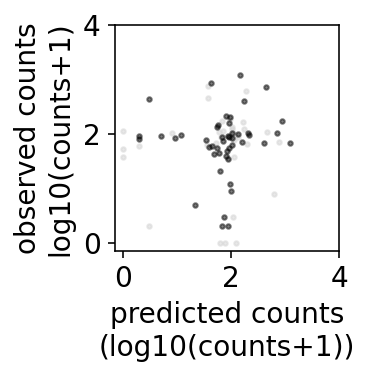

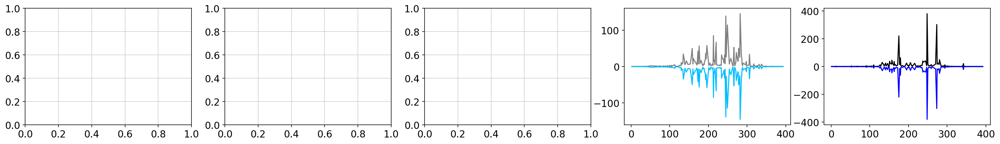

                                           condition pearson spearman    r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Te...    0.76     0.63  0.58


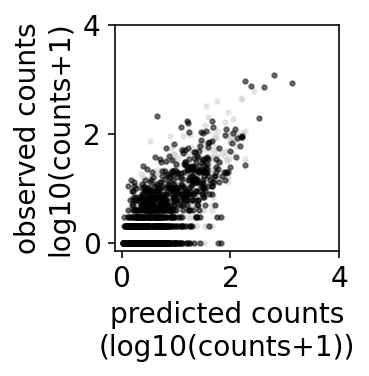

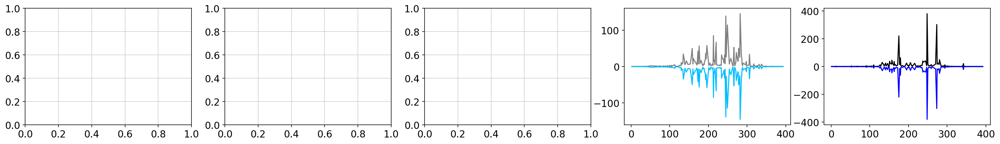

                                           condition pearson spearman    r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Te...    0.18     0.65  0.02


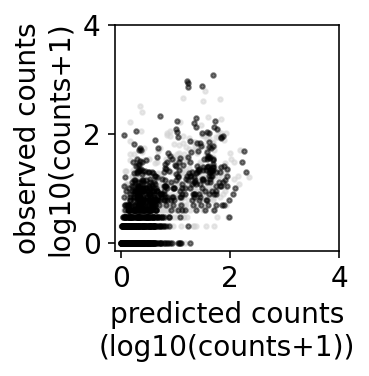

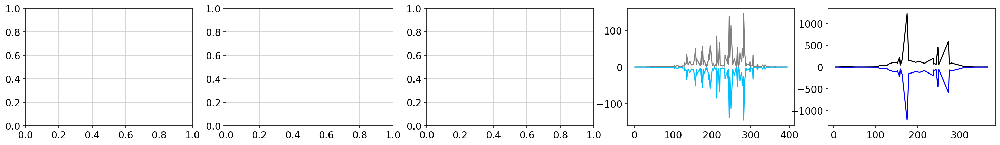

                                           condition pearson spearman    r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Te...    0.77     0.57  0.56


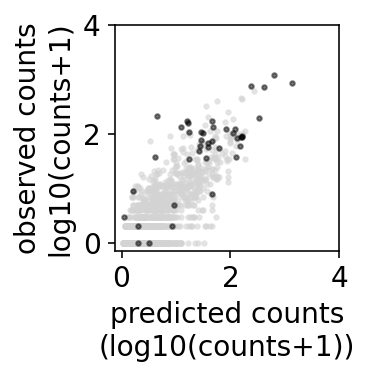

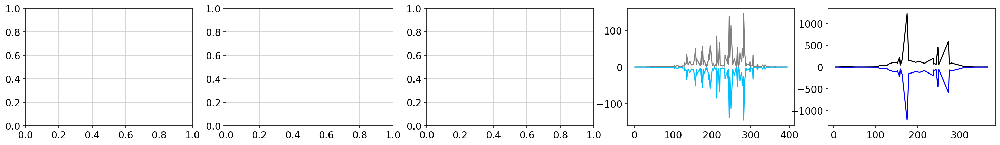

                                           condition pearson spearman     r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Te...    0.13     0.39  -0.24


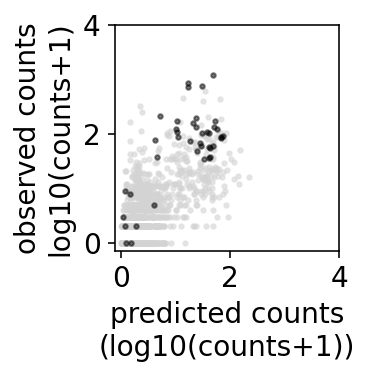

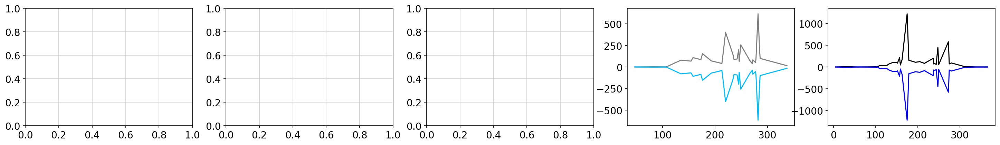

                                           condition pearson spearman      r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Te...    0.47      0.5  -15.89


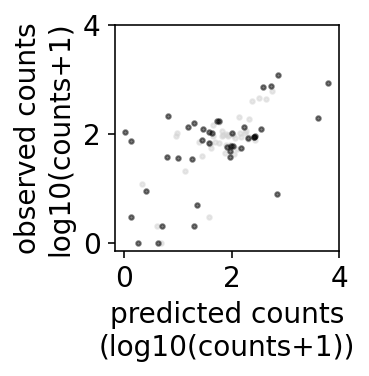

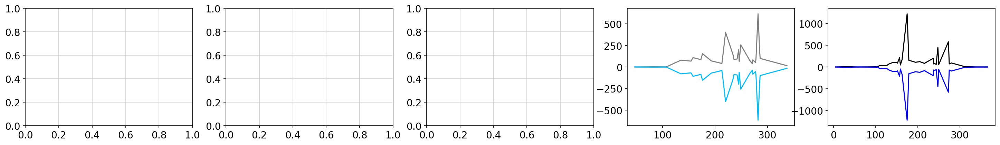

                                           condition pearson spearman     r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain S \n Te...    0.23     0.39  -0.03


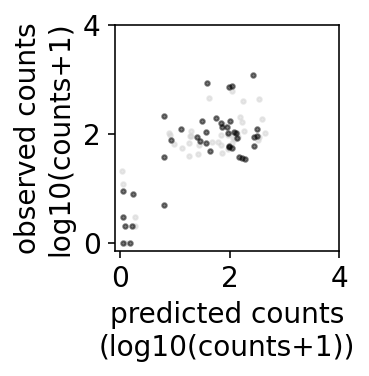

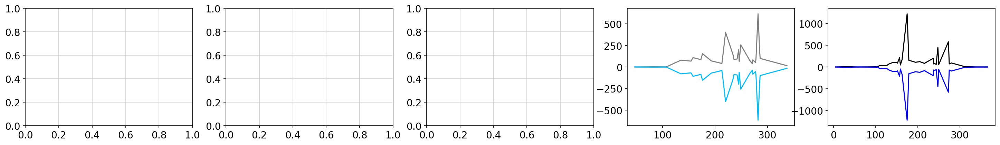

                                           condition pearson spearman      r2
0  Cell. Nutlin3 \n Mut. + \n sc-eVIP - \nTrain S...    0.45     0.49  -11.97


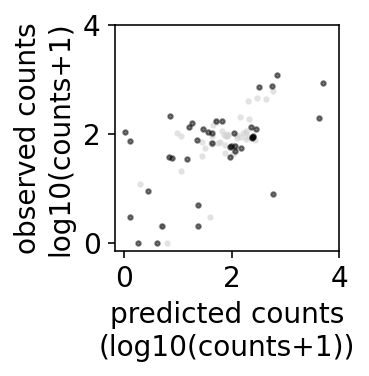

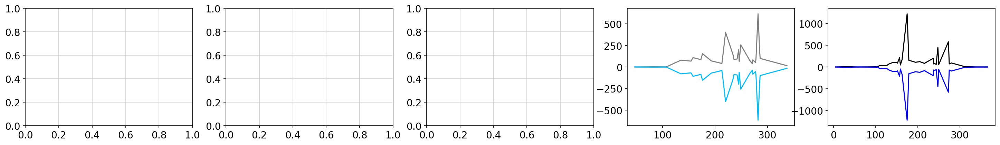

                                           condition pearson spearman     r2
0  Cell. Nutlin3 \n Mut. - \n sc-eVIP - \nTrain S...    0.15     0.41  -0.07


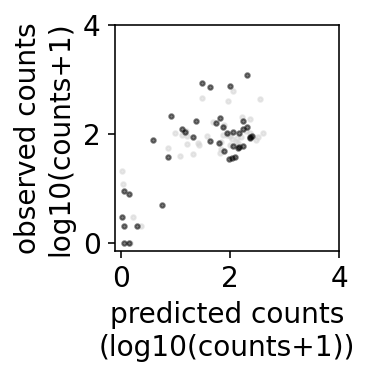

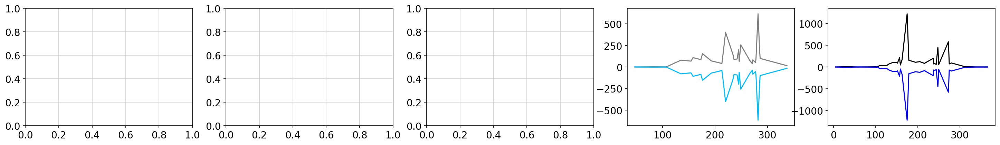

                                           condition pearson spearman      r2
0  Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Te...    0.43     0.52  -12.75


/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/statsmodels/genmod/families/family.py:460: RuntimeWarning: divide by zero encountered in log
  return var_weights / scale * (endog * np.log(mu) - mu -
/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/scipy/optimize/optimize.py:1985: RuntimeWarning: invalid value encountered in double_scalars
  tmp2 = (x - v) * (fx - fw)


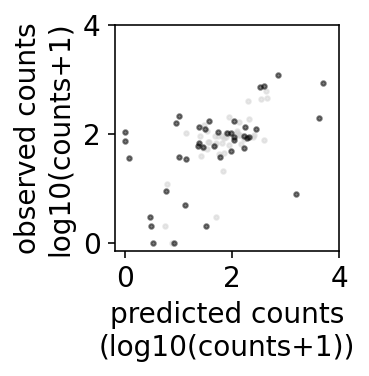

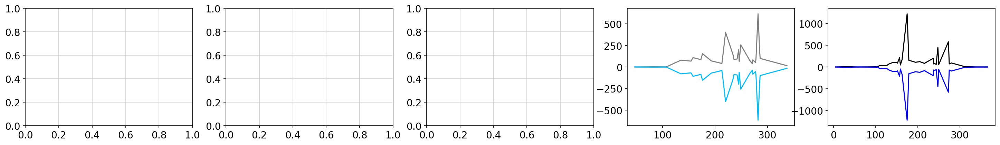

                                           condition pearson spearman     r2
0  Cell. - \n Mut. - \n sc-eVIP + \nTrain S \n Te...    0.22     0.42  -0.07


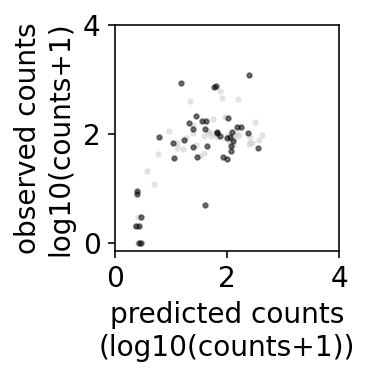

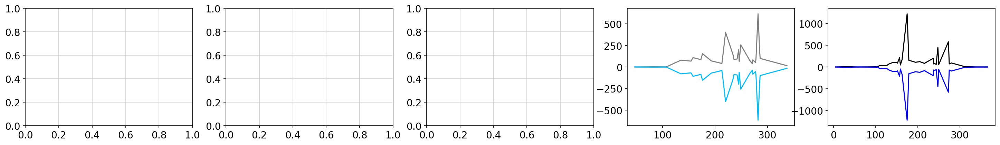

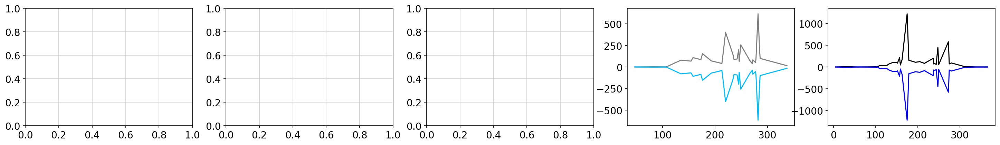

R282W     62
G245S    443
R249S     94
Y220C     52
C176F     61
Name: 0, dtype: int64
R175H    103
R273H      8
R248W    155
R273C    120
V157F    104
Name: 0, dtype: int64
R175H    1
R248Q    0
R273H    0
R248W    5
R273C    2
Name: 0, dtype: int64
=============== iteration 5


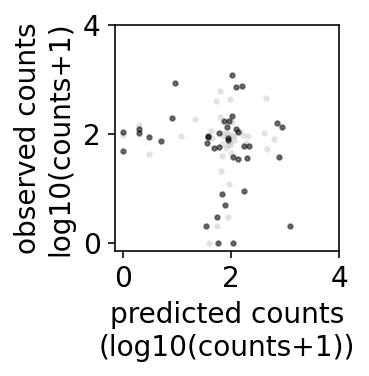

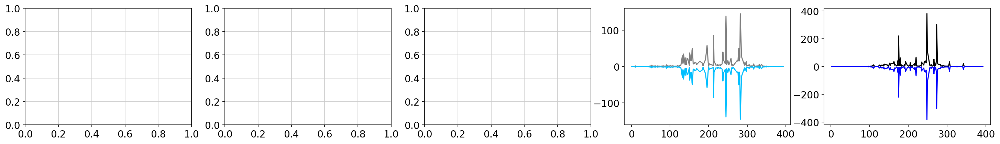

                                           condition pearson spearman    r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Te...    0.71     0.69  0.46


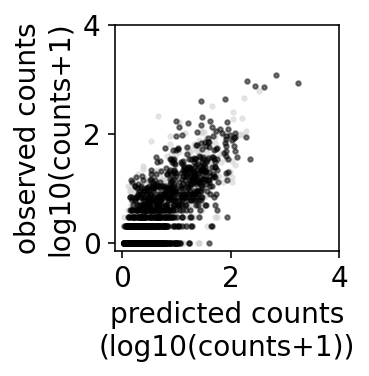

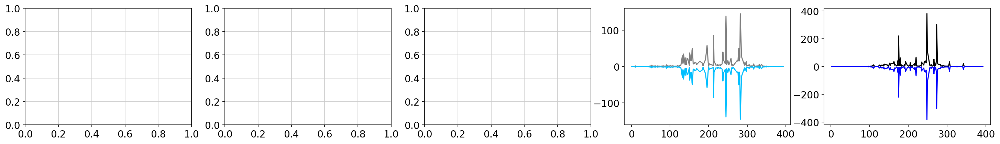

                                           condition pearson spearman    r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Te...    0.17     0.69  0.01


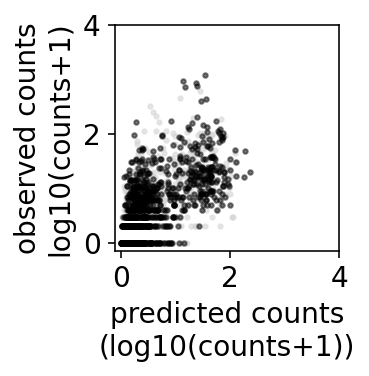

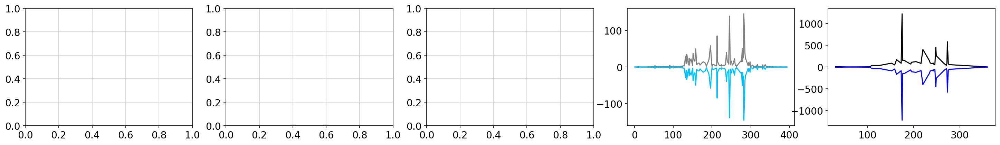

                                           condition pearson spearman    r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Te...    0.71     0.33  0.32


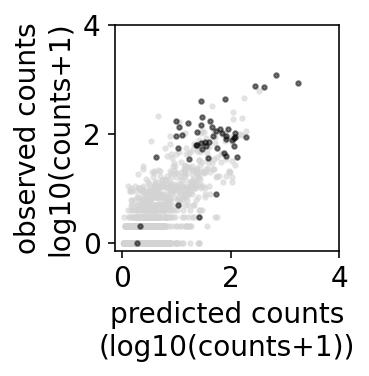

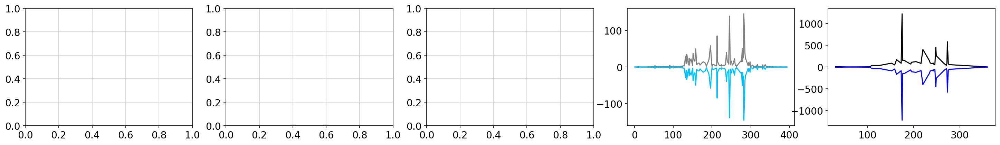

                                           condition pearson spearman    r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Te...     0.0     0.27  -0.3


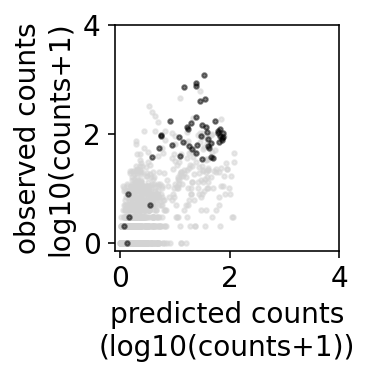

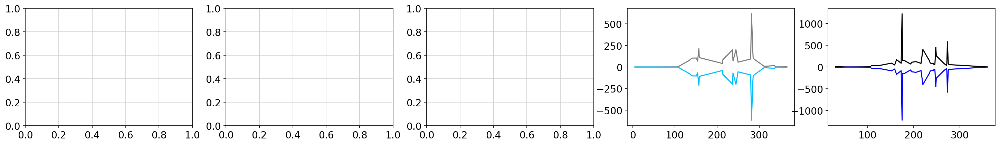

                                           condition pearson spearman    r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Te...     0.8     0.27  0.46


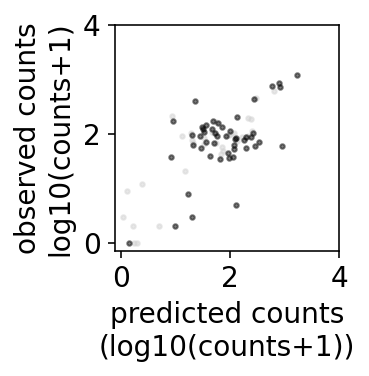

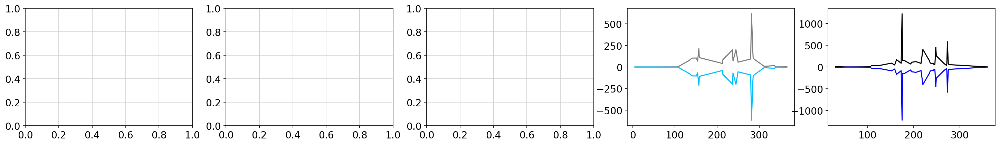

                                           condition pearson spearman     r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain S \n Te...    0.16     0.36  -0.09


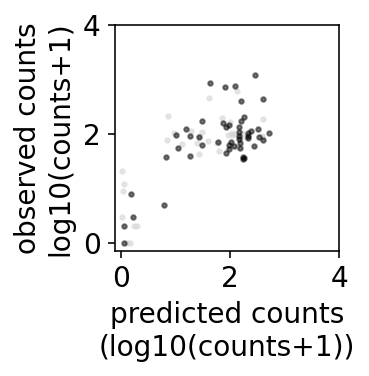

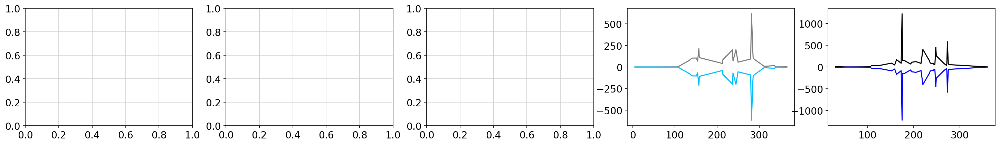

                                           condition pearson spearman    r2
0  Cell. Nutlin3 \n Mut. + \n sc-eVIP - \nTrain S...    0.73     0.31  0.33


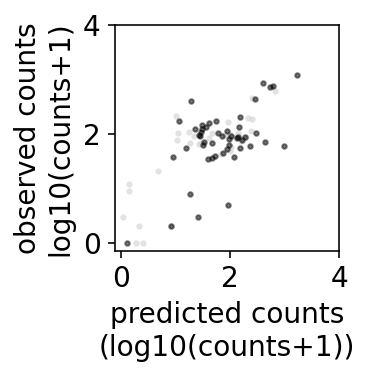

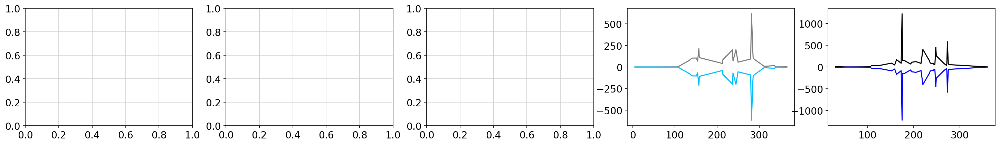

                                           condition pearson spearman     r2
0  Cell. Nutlin3 \n Mut. - \n sc-eVIP - \nTrain S...    0.12     0.38  -0.15


/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/statsmodels/genmod/families/family.py:460: RuntimeWarning: divide by zero encountered in log
  return var_weights / scale * (endog * np.log(mu) - mu -
/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/scipy/optimize/optimize.py:1985: RuntimeWarning: invalid value encountered in double_scalars
  tmp2 = (x - v) * (fx - fw)


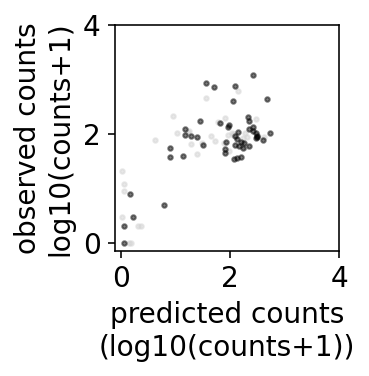

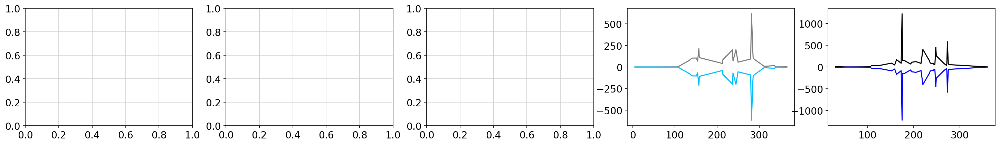

                                           condition pearson spearman    r2
0  Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Te...    0.84     0.28  0.57


/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/statsmodels/genmod/families/family.py:460: RuntimeWarning: divide by zero encountered in log
  return var_weights / scale * (endog * np.log(mu) - mu -
/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/scipy/optimize/optimize.py:1985: RuntimeWarning: invalid value encountered in double_scalars
  tmp2 = (x - v) * (fx - fw)


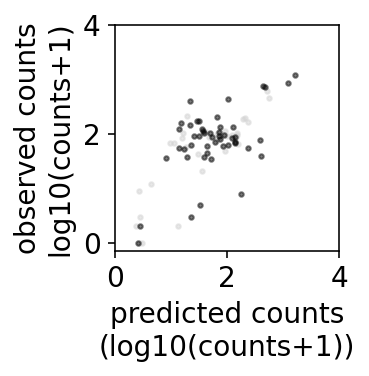

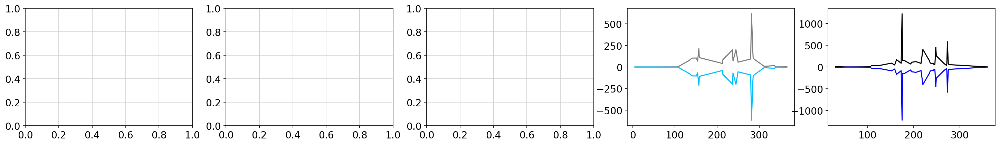

                                           condition pearson spearman     r2
0  Cell. - \n Mut. - \n sc-eVIP + \nTrain S \n Te...    0.11     0.25  -0.15


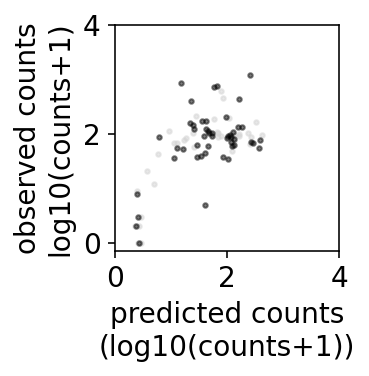

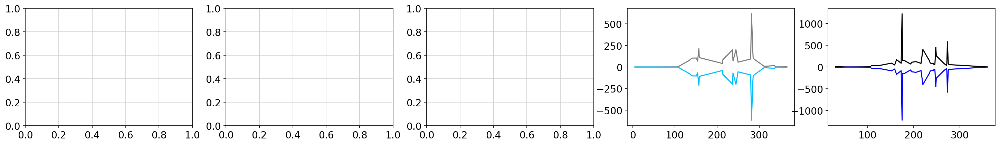

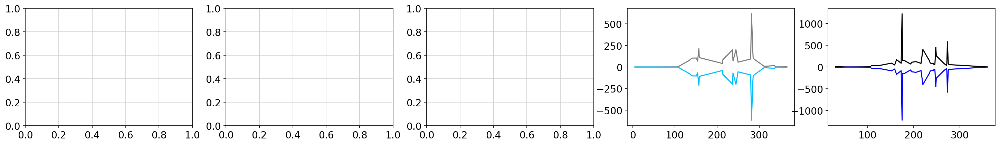

R282W      0
G245S     65
V157F    108
M237I    199
E285K    186
Name: 0, dtype: int64
R175H    770
R273H    120
R248W     92
R273C     35
R249S    443
Name: 0, dtype: int64
R175H      1
R248Q     20
R273H      4
R248W      5
R273C    206
Name: 0, dtype: int64
=============== iteration 6


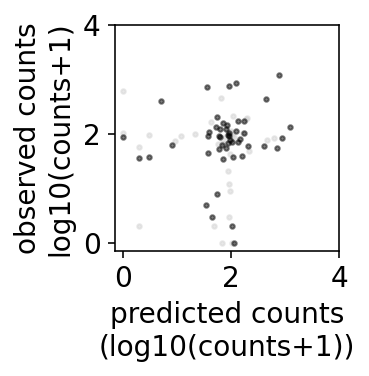

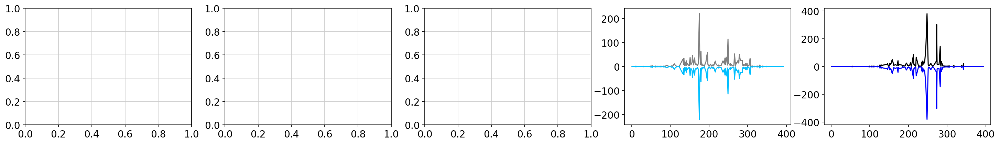

                                           condition pearson spearman    r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Te...    0.76     0.65  0.55


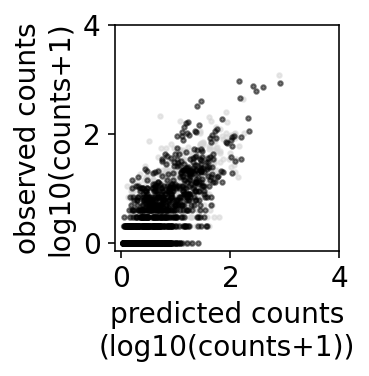

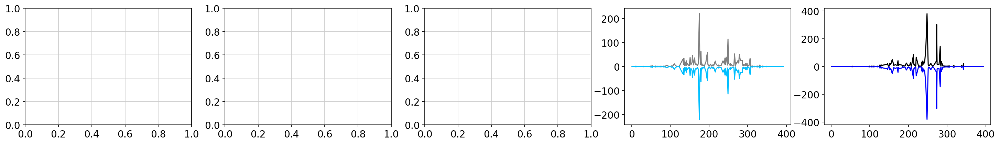

                                           condition pearson spearman    r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Te...    0.19     0.62  0.02


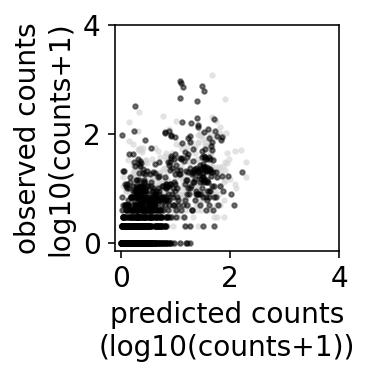

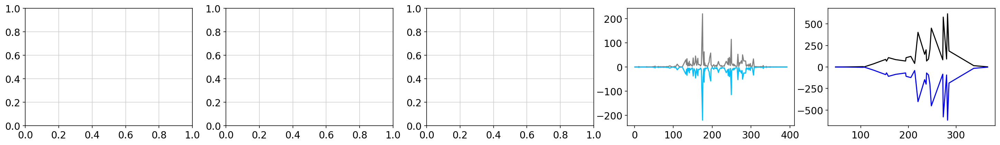

                                           condition pearson spearman    r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Te...     0.8     0.52  0.52


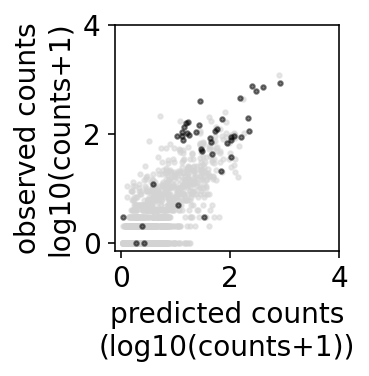

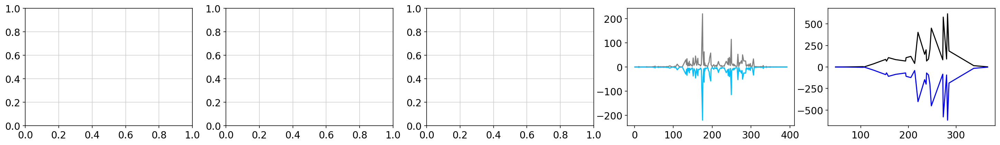

                                           condition pearson spearman     r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Te...    0.07     0.43  -0.42


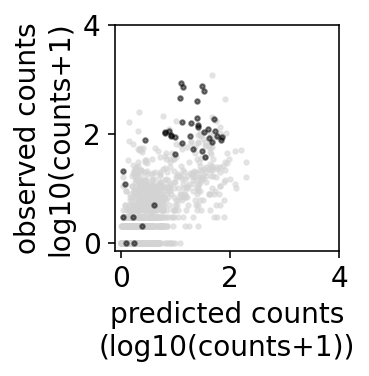

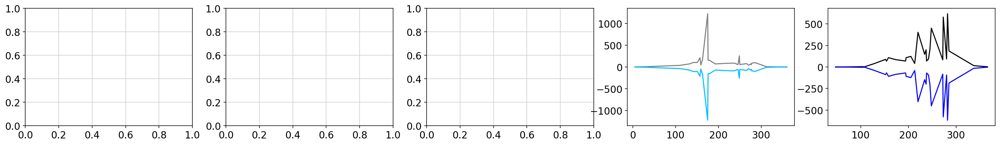

                                           condition pearson spearman    r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Te...    0.81     0.58  0.61


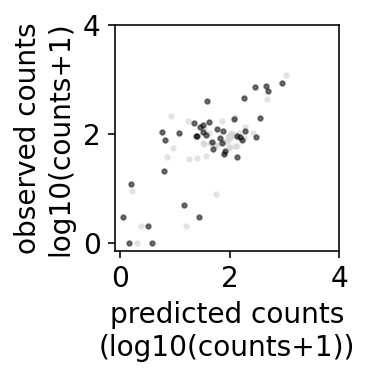

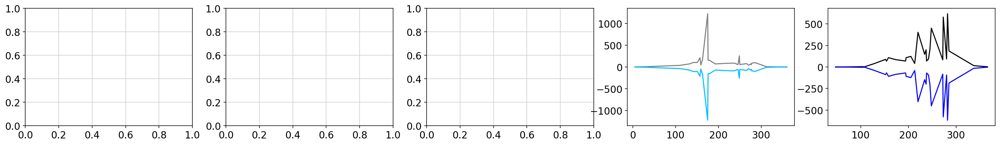

                                           condition pearson spearman     r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain S \n Te...    0.07     0.57  -0.33


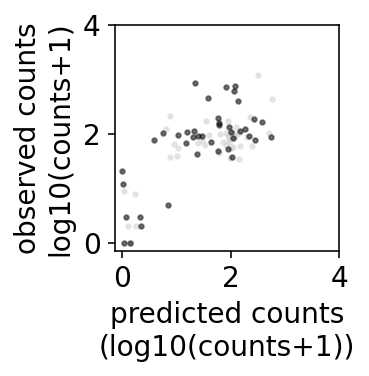

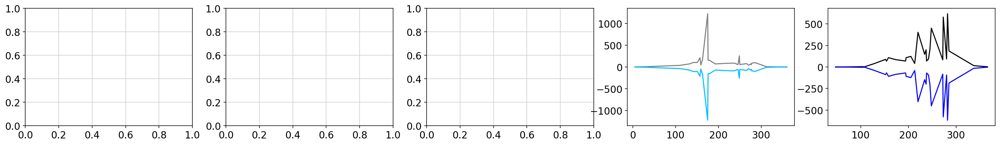

                                           condition pearson spearman    r2
0  Cell. Nutlin3 \n Mut. + \n sc-eVIP - \nTrain S...    0.77     0.63  0.54


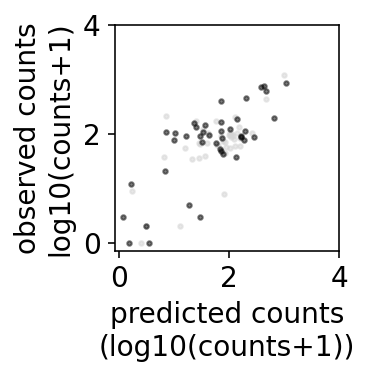

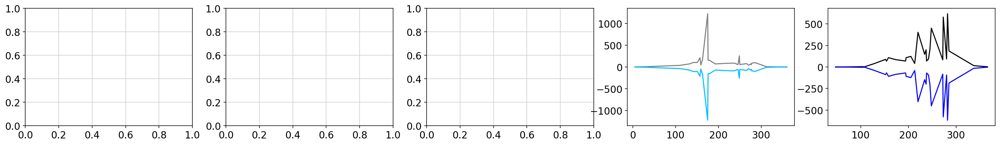

                                           condition pearson spearman     r2
0  Cell. Nutlin3 \n Mut. - \n sc-eVIP - \nTrain S...    0.04     0.46  -0.28


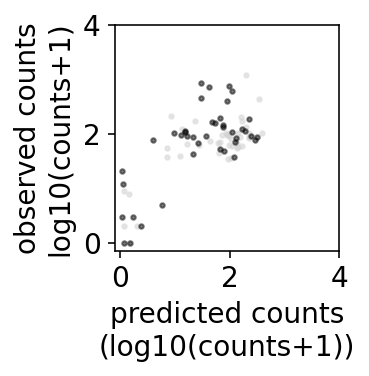

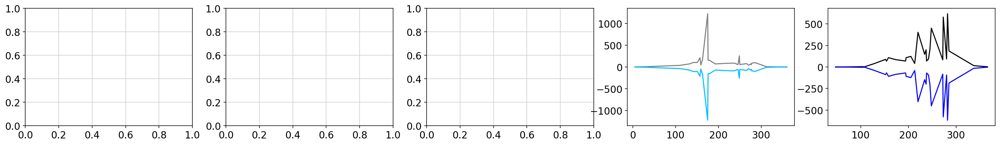

                                           condition pearson spearman    r2
0  Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Te...    0.45      0.6  0.06


/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/statsmodels/genmod/families/family.py:460: RuntimeWarning: divide by zero encountered in log
  return var_weights / scale * (endog * np.log(mu) - mu -
/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/scipy/optimize/optimize.py:1985: RuntimeWarning: invalid value encountered in double_scalars
  tmp2 = (x - v) * (fx - fw)


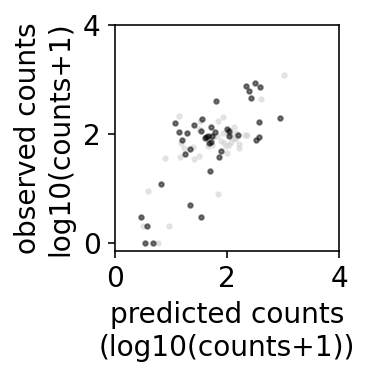

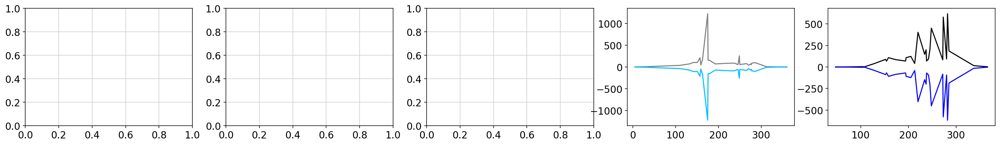

                                           condition pearson spearman     r2
0  Cell. - \n Mut. - \n sc-eVIP + \nTrain S \n Te...     0.0     0.45  -0.35


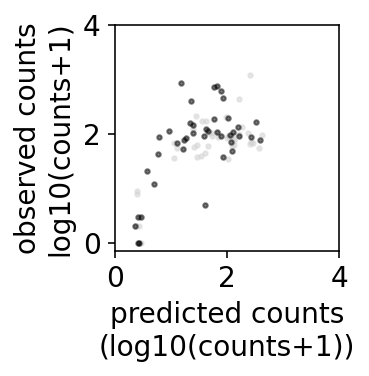

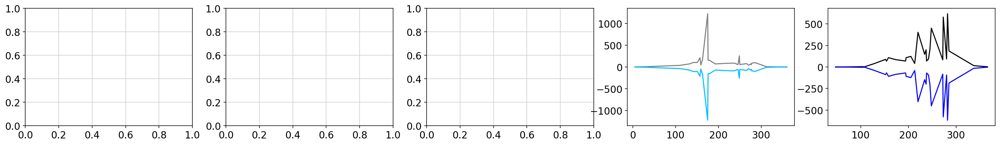

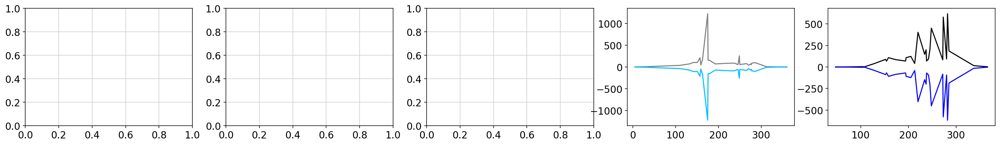

R175H    120
R249S     92
V157F     86
C176F     54
H179R     56
Name: 0, dtype: int64
R273H    163
R248W    147
R273C     78
R282W      2
G245S     52
Name: 0, dtype: int64
R175H     1
R248Q    16
R273H     0
R248W     6
R273C     0
Name: 0, dtype: int64
=============== iteration 7


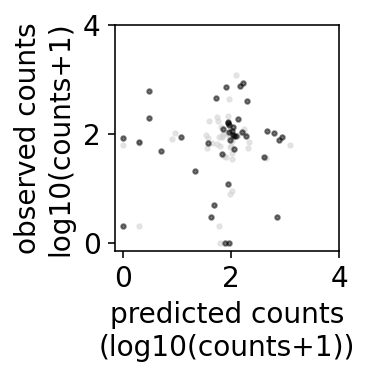

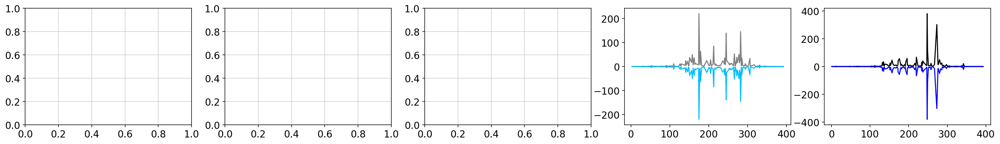

                                           condition pearson spearman    r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Te...    0.68     0.66  0.24


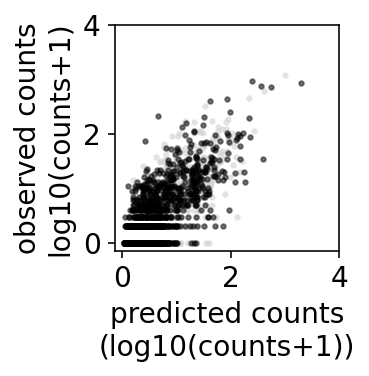

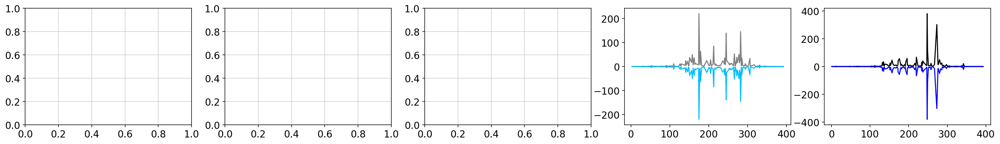

                                           condition pearson spearman    r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Te...     0.2      0.6  0.02


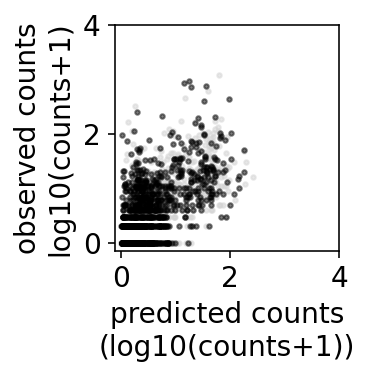

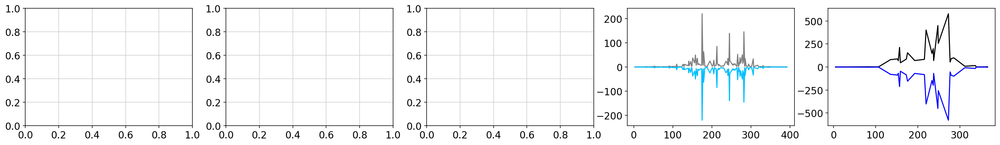

                                           condition pearson spearman     r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Te...    0.73     0.55  -0.06


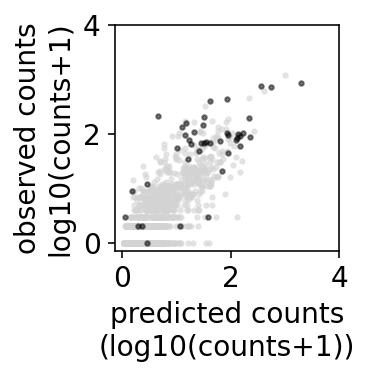

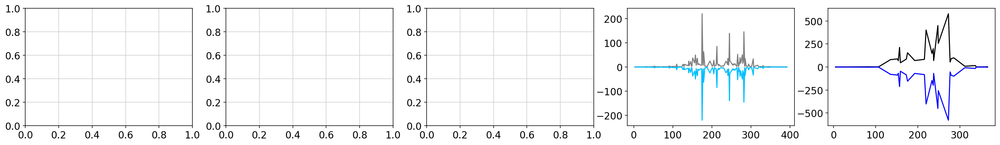

                                           condition pearson spearman    r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Te...    0.16     0.54  -0.3


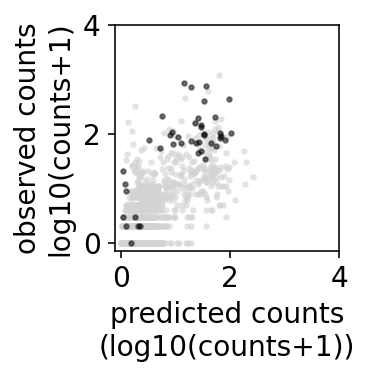

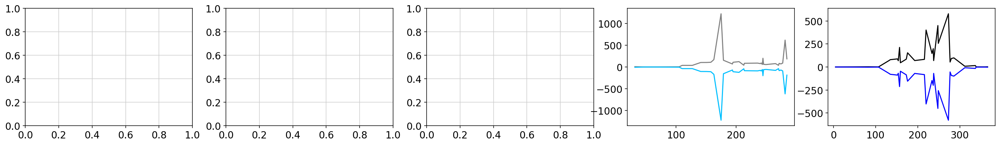

                                           condition pearson spearman    r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Te...    0.71     0.59  0.47


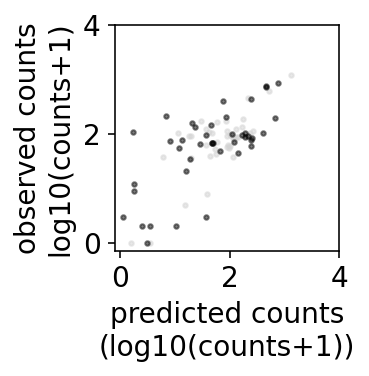

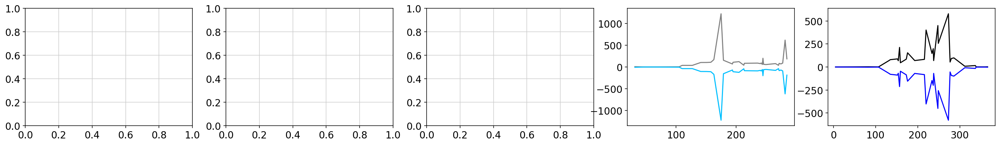

                                           condition pearson spearman     r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain S \n Te...    0.19     0.57  -0.25


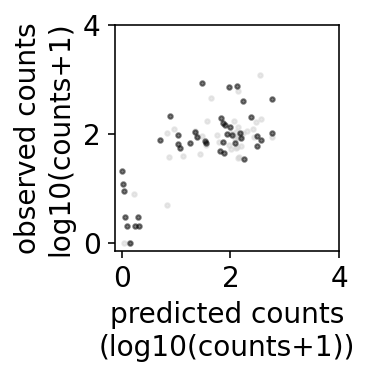

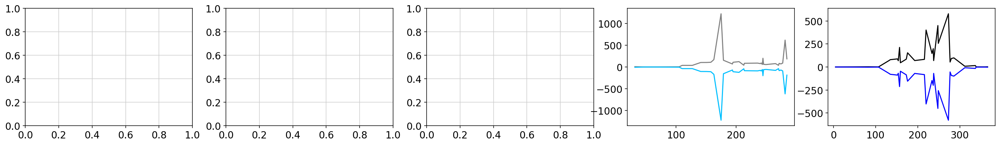

                                           condition pearson spearman   r2
0  Cell. Nutlin3 \n Mut. + \n sc-eVIP - \nTrain S...    0.72     0.61  0.5


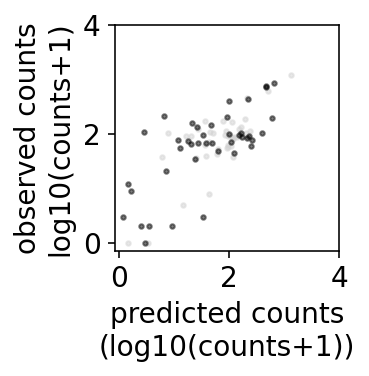

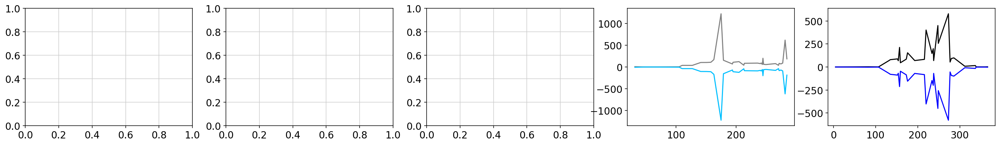

                                           condition pearson spearman     r2
0  Cell. Nutlin3 \n Mut. - \n sc-eVIP - \nTrain S...    0.12     0.54  -0.27


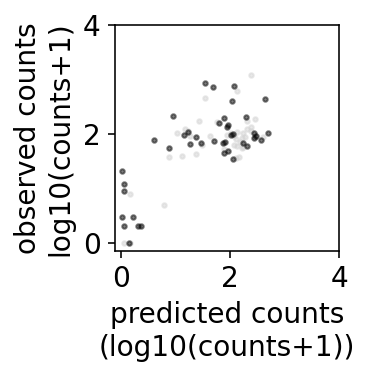

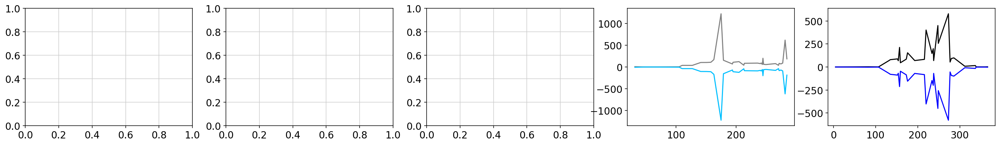

                                           condition pearson spearman     r2
0  Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Te...    0.46     0.51  -0.12


/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/statsmodels/genmod/families/family.py:460: RuntimeWarning: divide by zero encountered in log
  return var_weights / scale * (endog * np.log(mu) - mu -
/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/scipy/optimize/optimize.py:1985: RuntimeWarning: invalid value encountered in double_scalars
  tmp2 = (x - v) * (fx - fw)


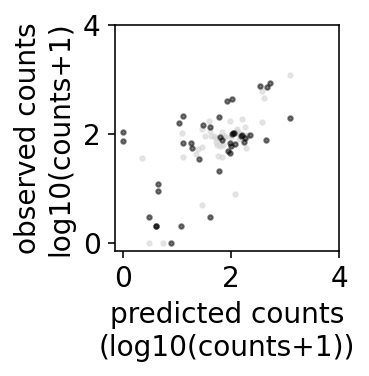

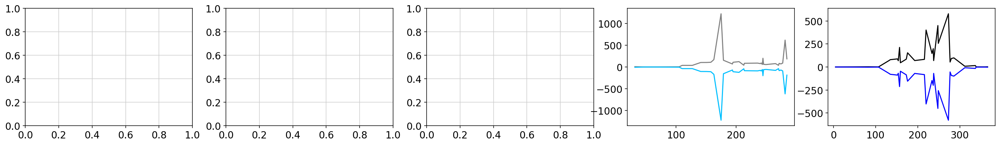

                                           condition pearson spearman     r2
0  Cell. - \n Mut. - \n sc-eVIP + \nTrain S \n Te...   -0.02     0.46  -0.38


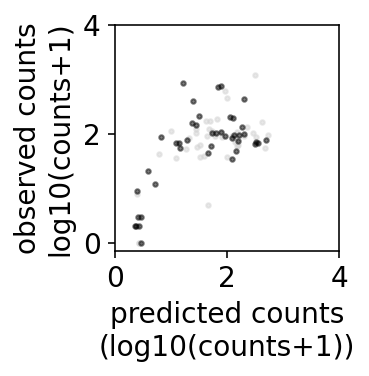

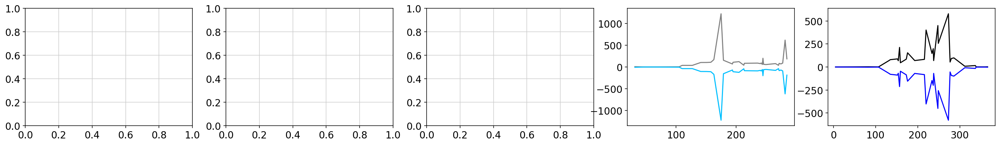

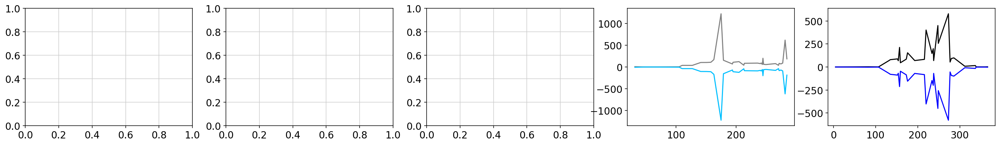

R175H     41
R282W    617
G245S    104
E285K     54
H179R    103
Name: 0, dtype: int64
R273H     43
R248W    147
R273C    206
R249S     88
Y220C     71
Name: 0, dtype: int64
R175H     0
R248Q    11
R273H     1
R248W     0
R273C     6
Name: 0, dtype: int64
=============== iteration 8


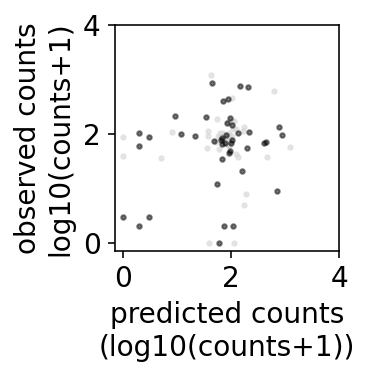

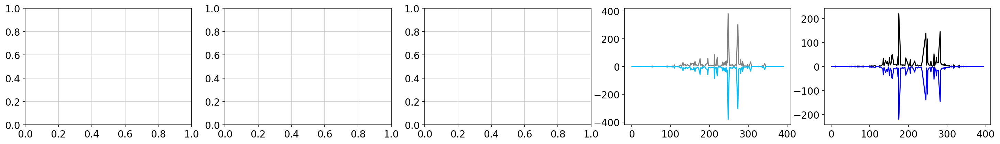

                                           condition pearson spearman    r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Te...    0.87     0.63  0.72


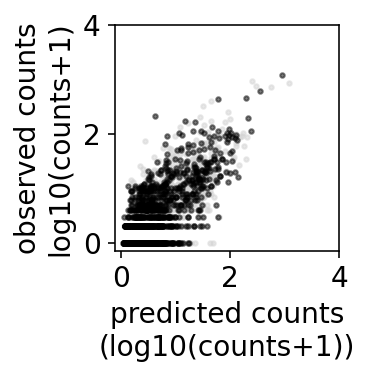

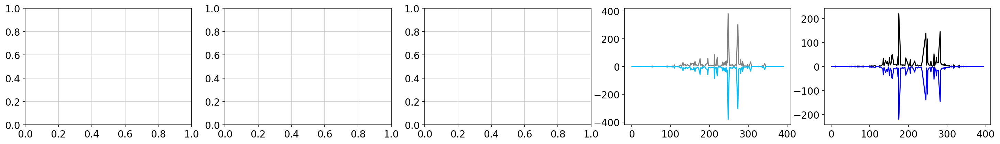

                                           condition pearson spearman     r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Te...    0.18      0.6  -0.04


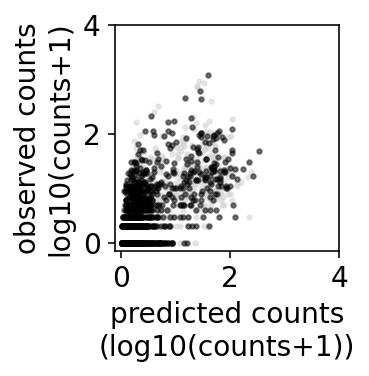

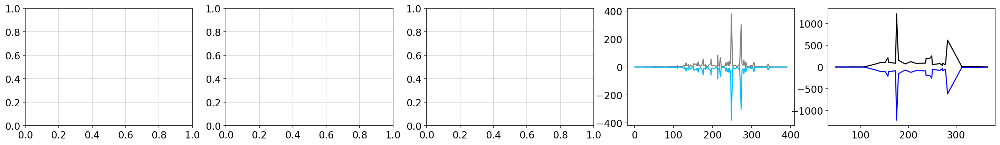

                                           condition pearson spearman    r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Te...    0.88      0.5  0.68


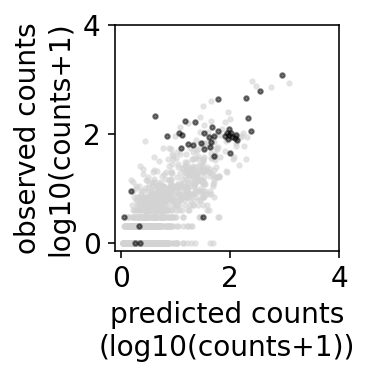

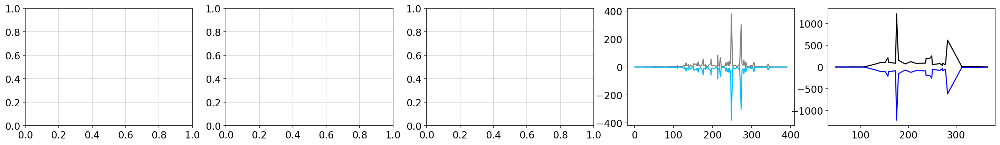

                                           condition pearson spearman     r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Te...     0.1     0.35  -0.29


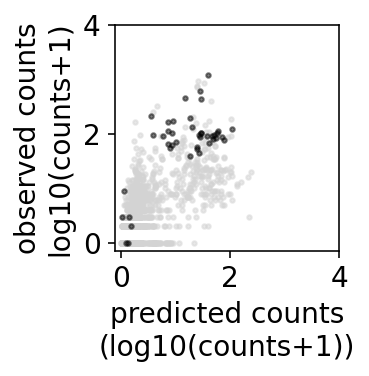

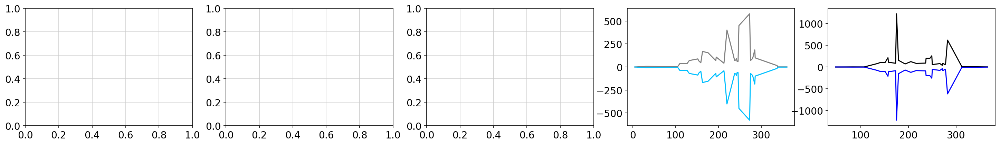

                                           condition pearson spearman    r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Te...    0.82     0.55  0.66


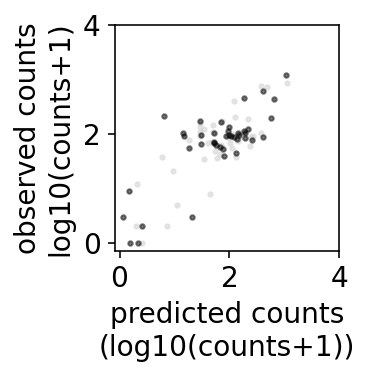

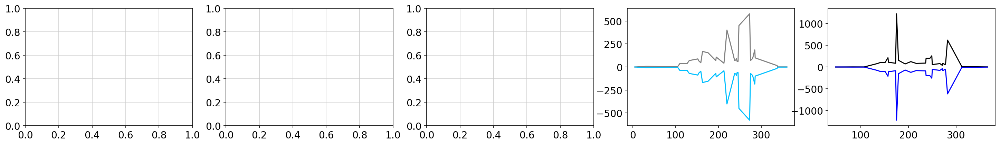

                                           condition pearson spearman     r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain S \n Te...    0.19      0.4  -0.11


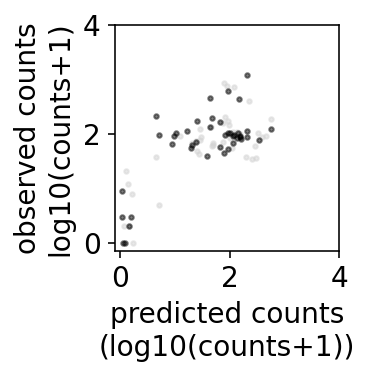

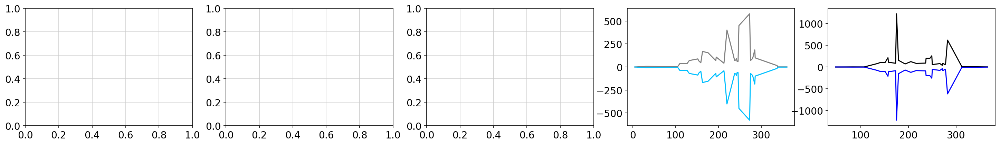

                                           condition pearson spearman    r2
0  Cell. Nutlin3 \n Mut. + \n sc-eVIP - \nTrain S...    0.87     0.58  0.67


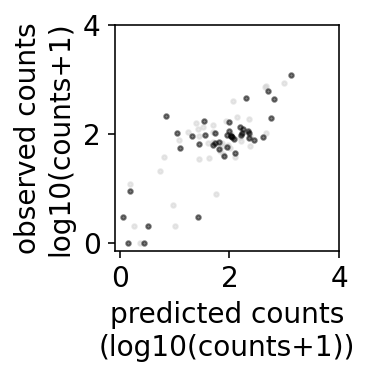

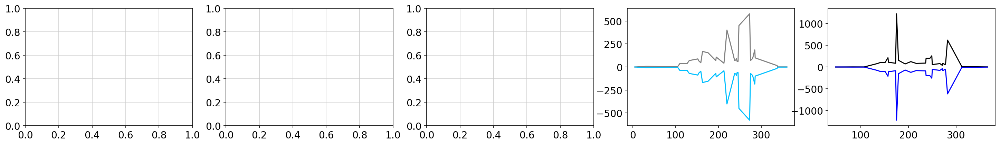

                                           condition pearson spearman     r2
0  Cell. Nutlin3 \n Mut. - \n sc-eVIP - \nTrain S...    0.26     0.44  -0.06


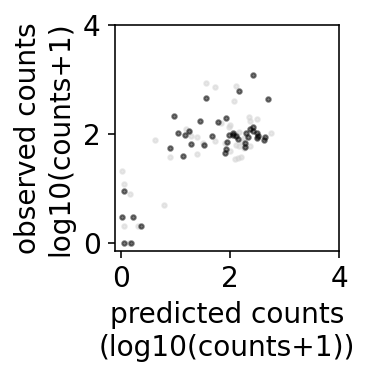

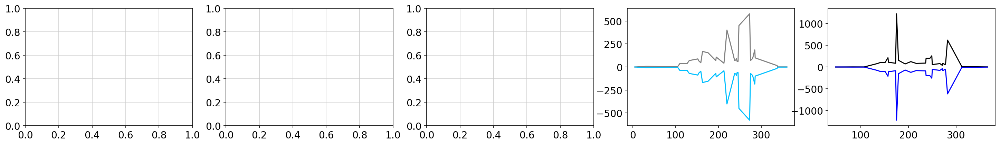

                                           condition pearson spearman     r2
0  Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Te...     0.8     0.57  -1.48


/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/statsmodels/genmod/families/family.py:460: RuntimeWarning: divide by zero encountered in log
  return var_weights / scale * (endog * np.log(mu) - mu -
/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/scipy/optimize/optimize.py:1985: RuntimeWarning: invalid value encountered in double_scalars
  tmp2 = (x - v) * (fx - fw)


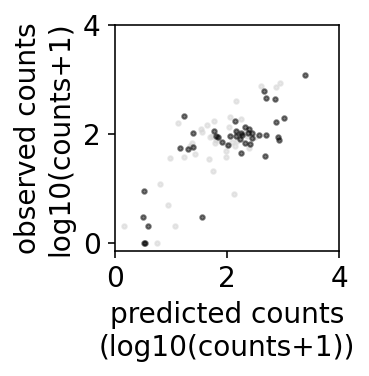

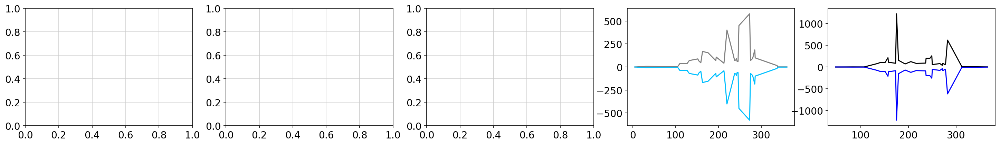

                                           condition pearson spearman     r2
0  Cell. - \n Mut. - \n sc-eVIP + \nTrain S \n Te...    0.19     0.41  -0.94


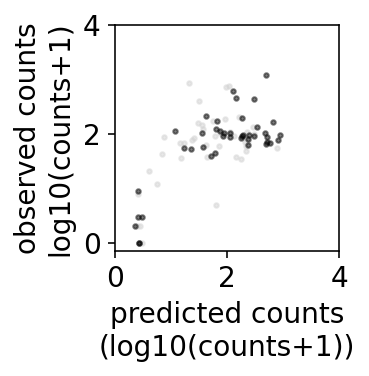

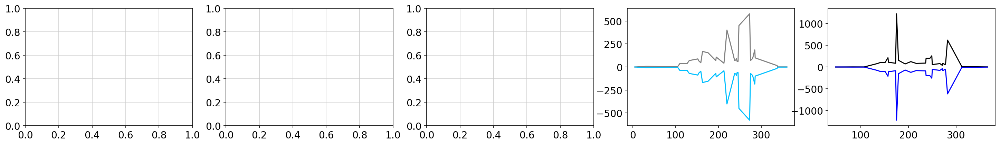

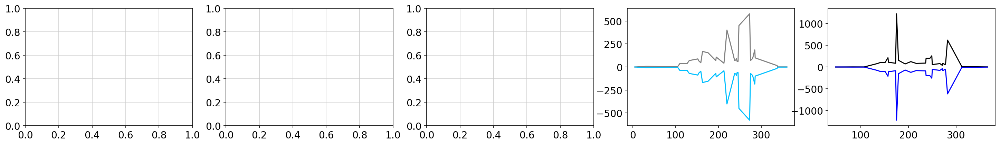

R273H     92
R248W    120
R273C    863
Y220C    718
C176F     66
Name: 0, dtype: int64
R175H      0
R282W      2
G245S    134
R249S     83
V157F     38
Name: 0, dtype: int64
R175H    0
R248Q    5
R273H    4
R248W    0
R273C    0
Name: 0, dtype: int64
=============== iteration 9


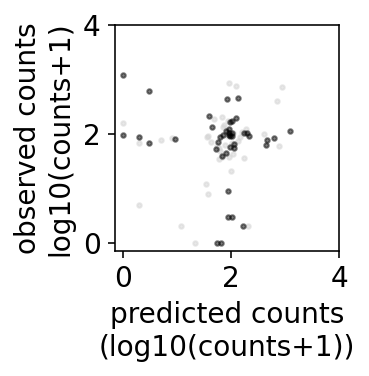

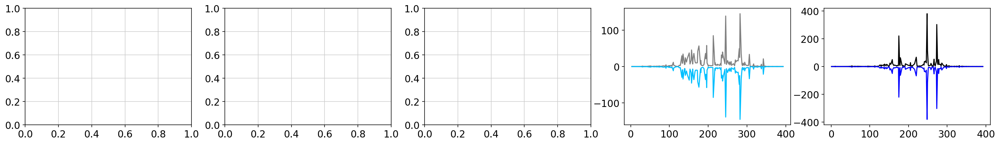

                                           condition pearson spearman    r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Te...    0.77     0.66  0.59


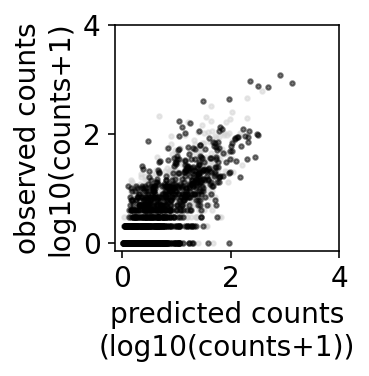

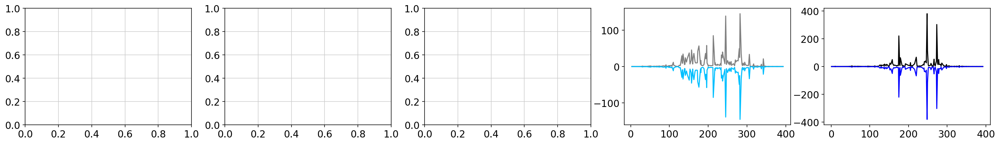

                                           condition pearson spearman    r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Te...    0.17     0.66  0.01


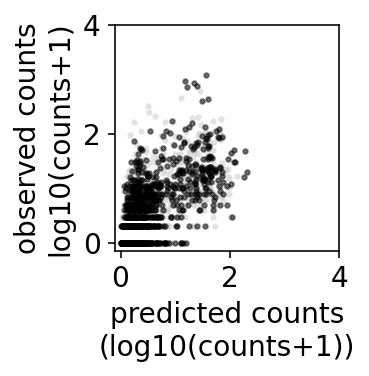

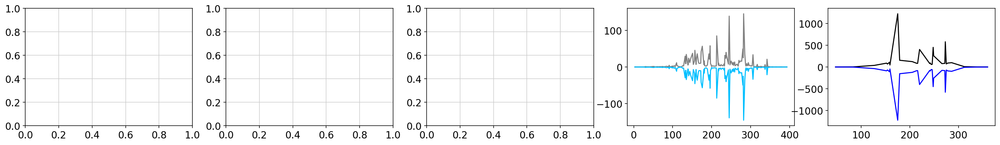

                                           condition pearson spearman    r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Te...    0.77     0.47  0.55


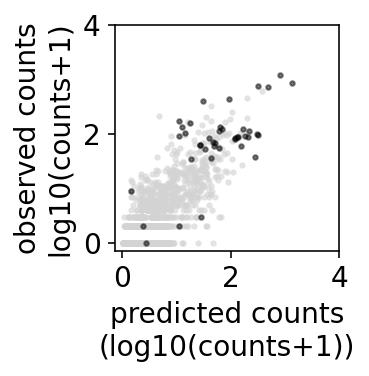

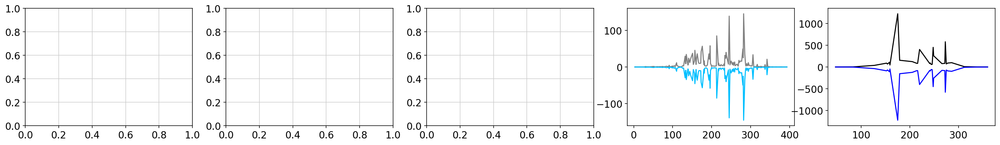

                                           condition pearson spearman     r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Te...    0.05     0.21  -0.31


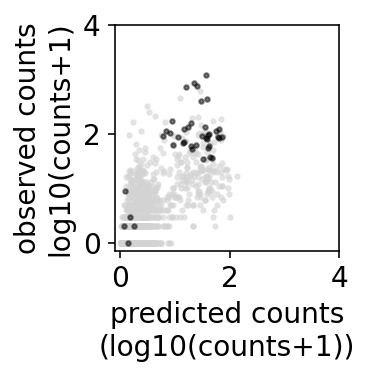

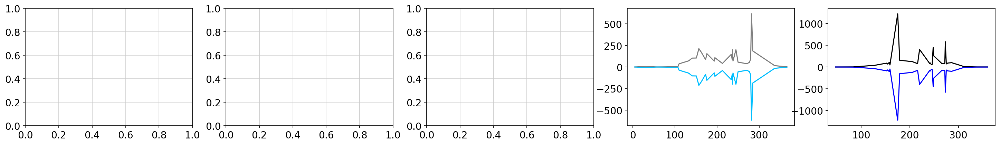

                                           condition pearson spearman    r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Te...    0.83     0.35  0.62


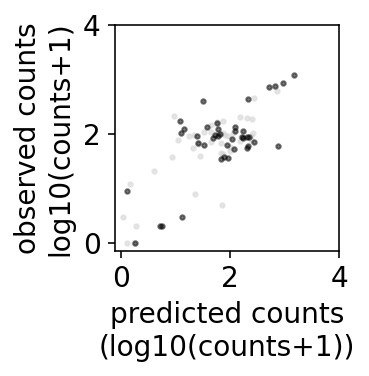

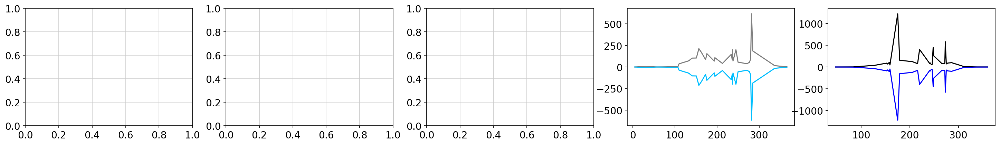

                                           condition pearson spearman     r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain S \n Te...    0.25     0.26  -0.02


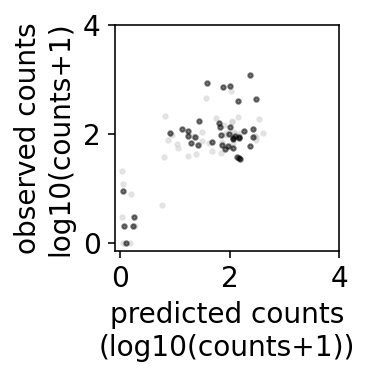

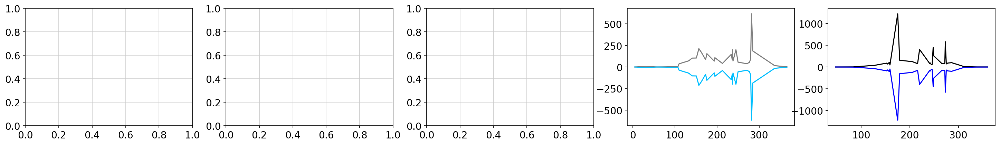

                                           condition pearson spearman    r2
0  Cell. Nutlin3 \n Mut. + \n sc-eVIP - \nTrain S...    0.82     0.36  0.61


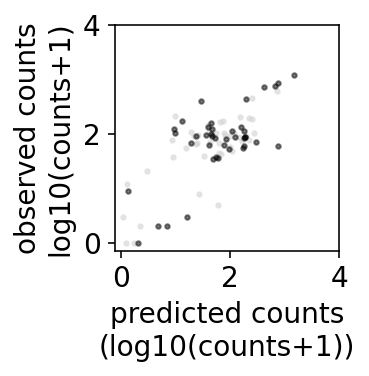

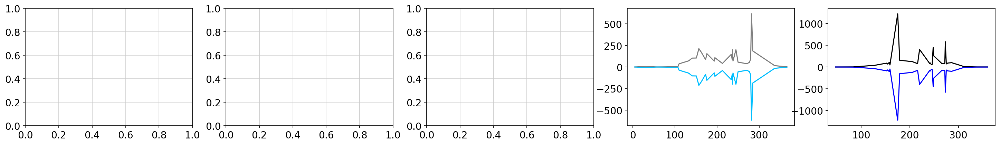

                                           condition pearson spearman     r2
0  Cell. Nutlin3 \n Mut. - \n sc-eVIP - \nTrain S...     0.2     0.25  -0.08


/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/statsmodels/genmod/families/family.py:460: RuntimeWarning: divide by zero encountered in log
  return var_weights / scale * (endog * np.log(mu) - mu -
/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/scipy/optimize/optimize.py:1985: RuntimeWarning: invalid value encountered in double_scalars
  tmp2 = (x - v) * (fx - fw)


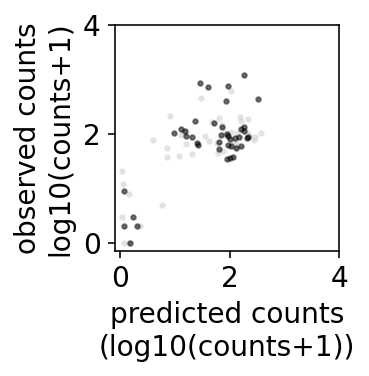

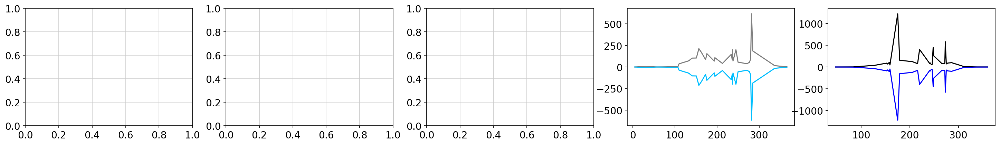

                                           condition pearson spearman     r2
0  Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Te...    0.16     0.45  -4.93


/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/statsmodels/genmod/families/family.py:460: RuntimeWarning: divide by zero encountered in log
  return var_weights / scale * (endog * np.log(mu) - mu -
/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/scipy/optimize/optimize.py:1985: RuntimeWarning: invalid value encountered in double_scalars
  tmp2 = (x - v) * (fx - fw)


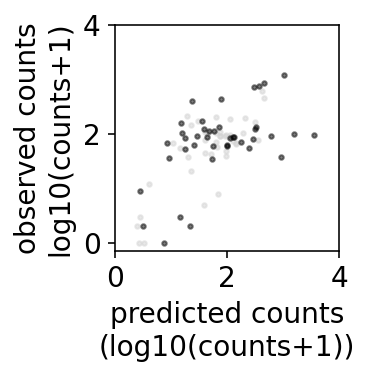

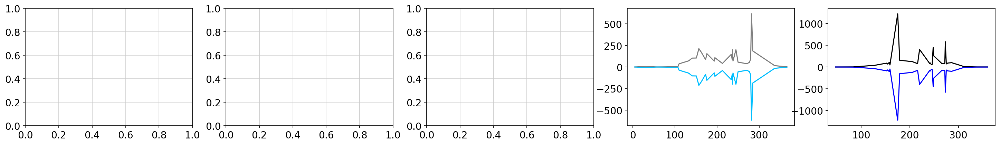

                                           condition pearson spearman     r2
0  Cell. - \n Mut. - \n sc-eVIP + \nTrain S \n Te...    0.13     0.31  -0.15


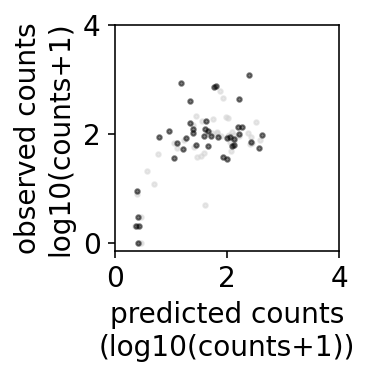

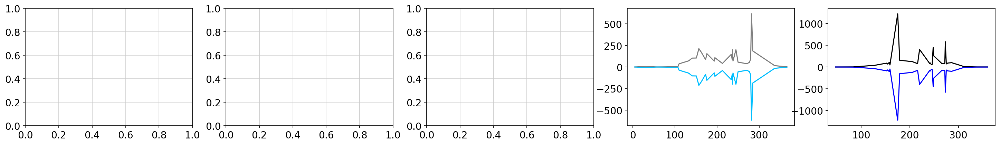

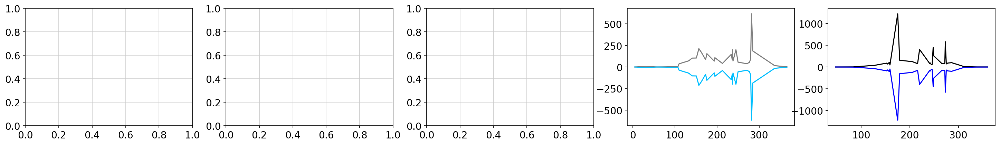

R282W    163
G245S     37
V157F     66
C176F     93
M237I      7
Name: 0, dtype: int64
R175H     103
R273H    1221
R248W      33
R273C     863
R249S      94
Name: 0, dtype: int64
R175H     2
R248Q    15
R273H     0
R248W    14
R273C     1
Name: 0, dtype: int64


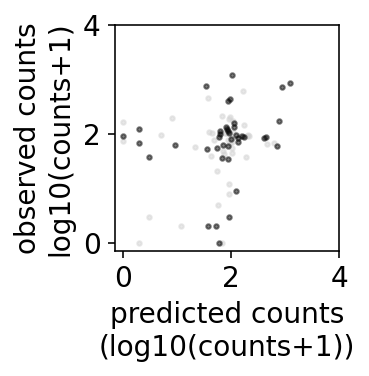

In [17]:
signature_cols=['Signature_1',
       'Signature_5',
       'Signature_2',
       'Signature_4',
       'Signature_6',
       'Signature_7',
       'Signature_13',
       'Signature_24',]
impact_cols=['HotellingT2']
pheno_cols=['A549_p53WT_Nutlin-3_Z-score', 
       'A549_p53NULL_Nutlin-3_Z-score',
       'A549_p53NULL_Etoposide_Z-score']
yname='IARC_Mutation_Counts'

#record model performances here
performances=pd.DataFrame(columns=['condition','pearson','spearman','r2','fold'])
results={}


for i in range(10):
    print('=============== iteration',i)
    #define train, validation sets
    #==============================
    #randomize train/test - by position
    foldname='fold'+str(i)
    rng=np.random.RandomState(i)
    data[foldname]=get_positions_train_valid(copy.deepcopy(data['Position']),rng)
    
    data[foldname+'not']=(data[foldname]==False)
    
    data['train'+foldname]=np.multiply(data['has_effsize'],data[foldname])
    data['valid'+foldname]=np.multiply(data['has_effsize'],data[foldname+'not'])
    
    #train each model of interest
    #============================
    model2features={}
    model2features['Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test L']=list(set(pheno_cols).union(set(signature_cols)))
    model2features['Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Test L']=pheno_cols
    
    model2features['Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test S']=list(set(pheno_cols).union(set(signature_cols)))
    model2features['Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Test S']=list(set(pheno_cols).union(set([])))
    
    model2features['Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Test S']=list(set(pheno_cols).union(set(signature_cols)))
    model2features['Cell. + \n Mut. - \n sc-eVIP - \nTrain S \n Test S']=list(set(pheno_cols).union(set([])))
     
    model2features['Cell. Nutlin3 \n Mut. + \n sc-eVIP - \nTrain S \n Test S']=list(set(['A549_p53WT_Nutlin-3_Z-score']).union(set(signature_cols)))
    model2features['Cell. Nutlin3 \n Mut. - \n sc-eVIP - \nTrain S \n Test S']=['A549_p53WT_Nutlin-3_Z-score']
    
    model2features['Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Test S']=list(set(impact_cols).union(set(signature_cols)))
    model2features['Cell. - \n Mut. - \n sc-eVIP + \nTrain S \n Test S']=impact_cols
    
    
    
    model2train={}
    model2train['Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test L']=foldname
    model2train['Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Test L']=foldname
    
    model2train['Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test S']=foldname
    model2train['Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Test S']=foldname
    
    model2train['Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Test S']='train'+foldname
    model2train['Cell. + \n Mut. - \n sc-eVIP - \nTrain S \n Test S']='train'+foldname
     
    model2train['Cell. Nutlin3 \n Mut. + \n sc-eVIP - \nTrain S \n Test S']='train'+foldname
    model2train['Cell. Nutlin3 \n Mut. - \n sc-eVIP - \nTrain S \n Test S']='train'+foldname
    
    model2train['Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Test S']='train'+foldname
    model2train['Cell. - \n Mut. - \n sc-eVIP + \nTrain S \n Test S']='train'+foldname
    
       
    model2valid={}

    model2valid['Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test L']=foldname+'not'
    model2valid['Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Test L']=foldname+'not'
    
    model2valid['Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test S']='valid'+foldname
    model2valid['Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Test S']='valid'+foldname
    
    model2valid['Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Test S']='valid'+foldname
    model2valid['Cell. + \n Mut. - \n sc-eVIP - \nTrain S \n Test S']='valid'+foldname
     
    model2valid['Cell. Nutlin3 \n Mut. + \n sc-eVIP - \nTrain S \n Test S']='valid'+foldname
    model2valid['Cell. Nutlin3 \n Mut. - \n sc-eVIP - \nTrain S \n Test S']='valid'+foldname
    
    model2valid['Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Test S']='valid'+foldname
    model2valid['Cell. - \n Mut. - \n sc-eVIP + \nTrain S \n Test S']='valid'+foldname

       
    model2num={}
    model2num['Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test L']=1
    model2num['Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Test L']=2
    
    model2num['Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test S']=3
    model2num['Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Test S']=4
    
    model2num['Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Test S']=5
    model2num['Cell. + \n Mut. - \n sc-eVIP - \nTrain S \n Test S']=6
     
    model2num['Cell. Nutlin3 \n Mut. + \n sc-eVIP - \nTrain S \n Test S']=7
    model2num['Cell. Nutlin3 \n Mut. - \n sc-eVIP - \nTrain S \n Test S']=8
    
    model2num['Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Test S']=9
    model2num['Cell. - \n Mut. - \n sc-eVIP + \nTrain S \n Test S']=10
    
    
    results[i]={}
    
    model_names=list(model2features.keys())
    for idx in range(len(model_names)): #['impact_train100variants']:#
        model_name=model_names[idx]
        
        features=model2features[model_name]
        performance_current_full=model_full(data,
                    features,
                    training_pos_col=model2train[model_name],
                    valid_pos_col=model2valid[model_name],
                    training_y_name=yname,
                    valid_y_name=yname,
                                            
                  toprint=model_name)
        print(performance_current_full[4])
        plot_performance(performance_current_full[0],'',-0.5,4)
        
        import copy
        results[i][model_name]=copy.deepcopy(performance_current_full)
        
        performance_current=performance_current_full[4]
        performance_current['fold']=foldname
        performances=pd.concat([performances,performance_current],axis=0)
        
        
        
    import copy
    import random
    model_name='Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Test S'
    features=model2features[model_name]
    out=model_full(data,
                    features,
                    training_pos_col=model2train[model_name],
                    valid_pos_col=model2valid[model_name],
                    training_y_name=yname,
                    valid_y_name=yname,
                  toprint=model_name)
    out=model_full(data,
                features,
                training_pos_col=model2train[model_name],
                valid_pos_col=model2valid[model_name],
                training_y_name=yname,
                valid_y_name=yname,
              toprint=model_name)


    
    for item in ['train','valid','all']:
        idx=list(out[0]['obs_'+item].index)
        stuff=copy.deepcopy(list(out[0]['obs_'+item]))
        #shuffle
        stuff=rng.choice(stuff,size=len(stuff),replace=False)
        out[0]['pred_'+item]=pd.DataFrame(stuff,index=idx)[0]
        print(out[0]['pred_'+item].head())
    results[i]['shuffled']=copy.deepcopy(out)
    y_pred=np.array(out[0]['pred_valid']).flatten()
    y=out[0]['obs_valid']
    
    plot_performance(out[0],'',-0.5,4)
    
    
    from scipy.stats import spearmanr,pearsonr
    from sklearn.metrics import r2_score
    p=pearsonr(y,y_pred)[0]
    p=str(int(100*p)/100)
    r2=r2_score(y,y_pred)
    r2=str(int(100*r2)/100)
    sp=spearmanr(y,y_pred)[0]
    sp=str(int(100*sp)/100)
    performances_shuffled=pd.DataFrame({'condition':['shuffled'],
                                       'pearson':p,
                                       'spearman':sp,
                                       'r2':r2,
                                       'fold':[foldname]})
    performances=pd.concat([performances,performances_shuffled],axis=0)

In [18]:
performances['spearman']=pd.DataFrame(performances['spearman'],dtype=float)
performances['pearson']=pd.DataFrame(performances['pearson'],dtype=float)
performances['r2']=pd.DataFrame(performances['r2'],dtype=float)
grouped_performances=performances.groupby('condition').median()
grouped_performances['condition']=list(grouped_performances.index)
grouped_performances.index=range(grouped_performances.shape[0])
pd.set_option('display.max_colwidth', 100)
print(grouped_performances)

    pearson  spearman     r2  \
0     0.755     0.655  0.505   
1     0.770     0.510  0.405   
2     0.805     0.490  0.465   
3     0.195     0.630  0.010   
4     0.140     0.380 -0.300   
5     0.190     0.410 -0.140   
6     0.455     0.480 -0.800   
7     0.100     0.395 -0.365   
8     0.750     0.485  0.510   
9     0.145     0.415 -0.130   
10   -0.060     0.105 -1.125   

                                                   condition  
0         Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test L  
1         Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test S  
2         Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Test S  
3         Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Test L  
4         Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Test S  
5         Cell. + \n Mut. - \n sc-eVIP - \nTrain S \n Test S  
6         Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Test S  
7         Cell. - \n Mut. - \n sc-eVIP + \nTrain S \n Test S  
8   Cell. Nutlin3 \n Mut. + \n sc-eVIP - \nTrain

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Cell. - 
 Mut. - 
 sc-eVIP + 
Train S 
 Test S v.s. Cell. - 
 Mut. + 
 sc-eVIP + 
Train S 
 Test S: t-test independent samples with Bonferroni correction, P_val=1.000e+00 stat=1.000e+00
Cell. - 
 Mut. + 
 sc-eVIP + 
Train S 
 Test S v.s. Cell. + 
 Mut. - 
 sc-eVIP - 
Train S 
 Test S: t-test independent samples with Bonferroni correction, P_val=1.000e+00 stat=-1.000e+00
Cell. - 
 Mut. + 
 sc-eVIP + 
Train S 
 Test S v.s. Cell. + 
 Mut. + 
 sc-eVIP - 
Train S 
 Test S: t-test independent samples with Bonferroni correction, P_val=1.000e+00 stat=-1.000e+00
Cell. - 
 Mut. + 
 sc-eVIP + 
Train S 
 Test S v.s. Cell. + 
 Mut. - 
 sc-eVIP - 
Train L 
 Test S: t-test independent samples with Bonferroni correction, P_val=1.000e+00 stat=-1.000e+00
Cell. - 
 Mut. + 
 sc-eVIP + 
Train S 
 Test S v.s. Cell. + 
 Mut. + 
 sc-eVIP - 
Train L

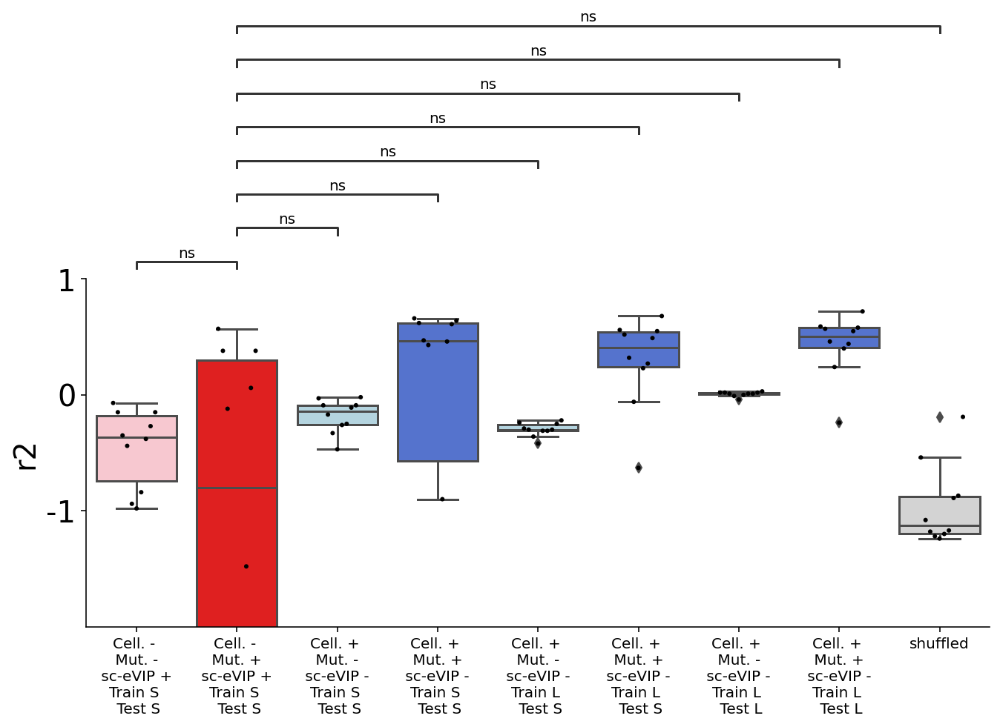

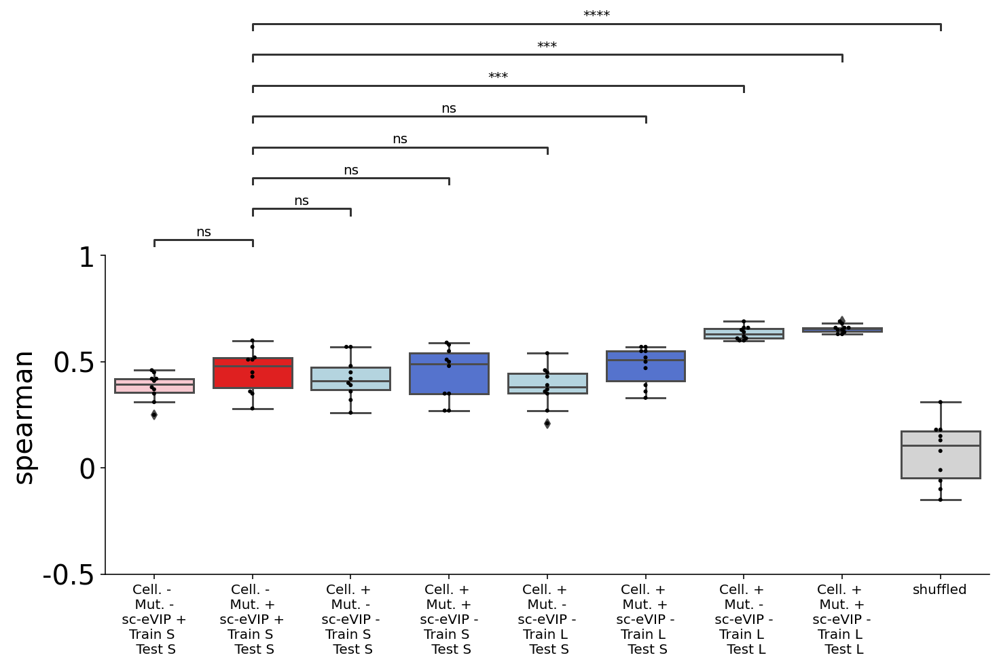

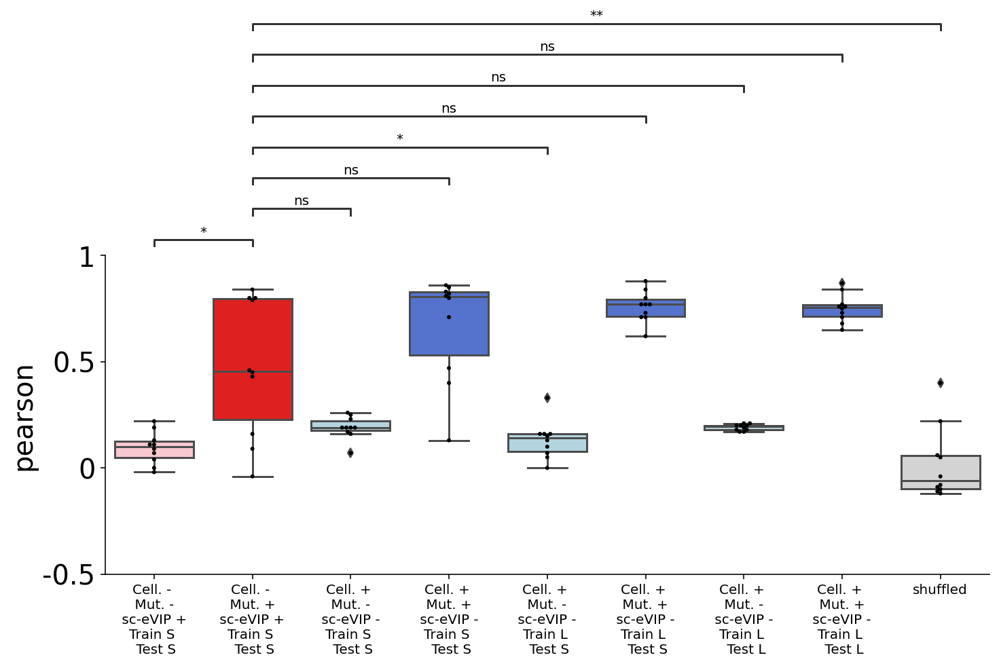

In [20]:
color_dict={}
for m in model_names:
    if 'Mut. +' in m:
        if 'sc-eVIP -' in m:
            co='royalblue'
        if 'sc-eVIP +' in m:
            co='red'
    elif 'Mut. -' in m:
        if 'sc-eVIP -' in m:
            co='lightblue'
        if 'sc-eVIP +' in m:
            co='pink'
    else:
        co='lightgray'
    color_dict[m]=co
    
color_dict['shuffled']='lightgray'

myorder=['shuffled',
         'Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test L', 
         'Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Test L',
         
         'Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test S',  
         'Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Test S', 
         
         'Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Test S',  
         'Cell. + \n Mut. - \n sc-eVIP - \nTrain S \n Test S',  
         
         'Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Test S',  
         'Cell. - \n Mut. - \n sc-eVIP + \nTrain S \n Test S']
myorder=myorder[::-1]

pairs=[]
comparison='Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Test S'
for x in myorder:
    if x==comparison:
        continue
    pairs.append((x,comparison))
    
    
from statannot import add_stat_annotation
for item in ['r2','spearman','pearson']:
    g = sns.catplot(x="condition", y=item,kind='box',data=performances,palette=color_dict,
                   order=myorder,aspect=2)##aspect=1.3)#4)
                    #order=myorder)#,palette=color_dict)
    sns.swarmplot(x="condition", y=item, color="k", size=3, data=performances, ax=g.ax,order=myorder)
                  #order=myorder);
        
    ax1 = g.axes[0,0]
    ax1.grid(False)
    
    
    if item=='r2':
        g.ax.set_ylim(-2,1)
        g.ax.set_yticks([-1,0,1])
        g.ax.set_yticklabels([-1,0,1],fontsize=20)
        
    else:
        g.ax.set_ylim(-0.5,1)
        g.ax.set_yticks([-0.5,0,0.5,1])
        g.ax.set_yticklabels([-0.5,0,0.5,1],fontsize=20)
    #g.ax.set_xticks([])
    g.ax.set_xlabel('')
    g.ax.set_ylabel(item,fontsize=20)
    g.ax.set_xticklabels(myorder,fontsize=10)
    
    
    test_results = add_stat_annotation(ax1,
                                       x="condition", y=item,data=performances,order=myorder,
                                   box_pairs=pairs,
                                   test='t-test_ind', text_format='star',
                                   loc='outside', verbose=2)
    
    plt.savefig(FIGS+'/'+PROTEIN+'.LinModels_full.'+item+'.notLog.pdf',bbox_inches = "tight") 
    plt.savefig(FIGS+'/'+PROTEIN+'.LinModels_full.'+item+'.notLog.png',bbox_inches = "tight")


r2                                                     Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test L  \
Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Test S                                        3.998795e-01   
Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Test S                                        3.384995e-01   
Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test S                                        4.368651e-01   
Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test L                                        1.000000e+00   
shuffled                                                                                  2.816922e-07   

                                                    Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Test S  \
Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Test S                                            0.399880   
Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Test S                                            0.399880   
Cell. + \n Mut. + \n sc-eVIP - \nTrain L \

pearson                                                     Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test L  \
Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Test S                                        3.038270e-02   
Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Test S                                        4.167425e-01   
Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test S                                        9.145216e-01   
Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test L                                        1.000000e+00   
shuffled                                                                                  1.168130e-09   

                                                    Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Test S  \
Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Test S                                        9.406598e-03   
Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Test S                                        1.394883e-05   
Cell. + \n Mut. + \n sc-eVIP - \nTrai

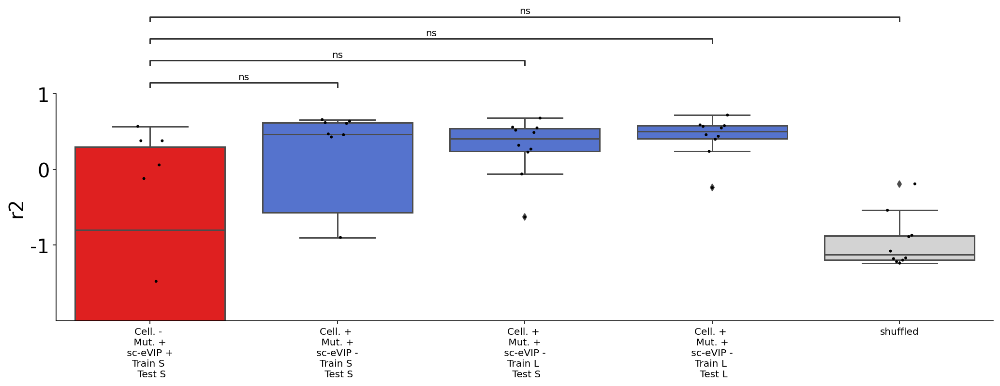

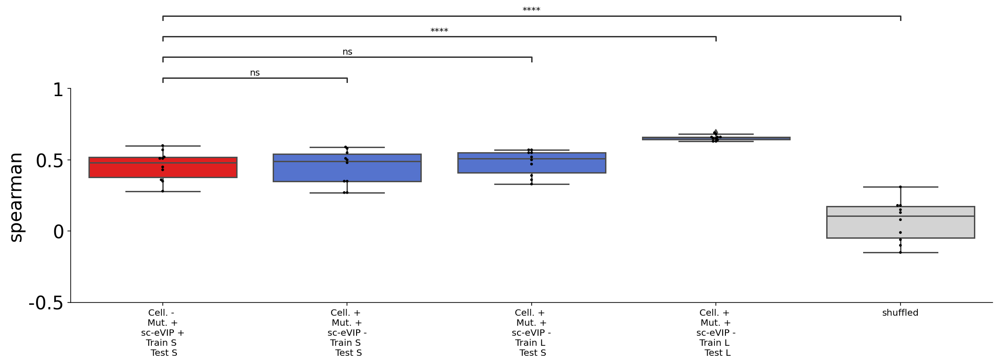

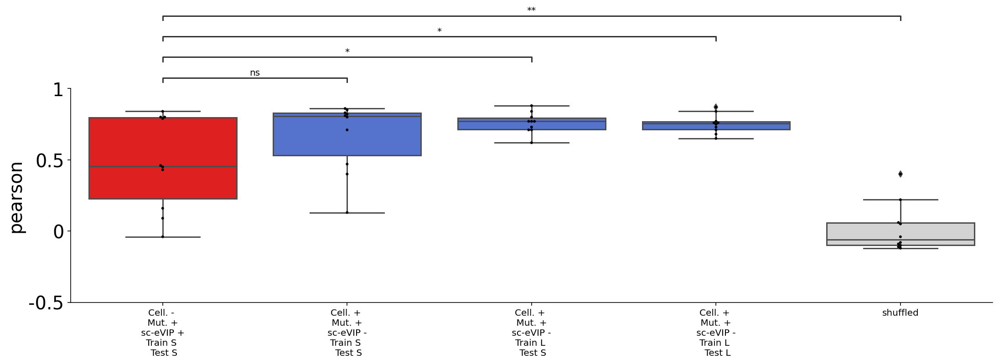

In [35]:
color_dict={}
for m in model_names:
    if 'Mut. +' in m:
        if 'sc-eVIP -' in m:
            co='royalblue'
        if 'sc-eVIP +' in m:
            co='red'
    elif 'Mut. -' in m:
        if 'sc-eVIP -' in m:
            co='lightblue'
        if 'sc-eVIP +' in m:
            co='pink'
    else:
        co='lightgray'
    color_dict[m]=co
    
color_dict['shuffled']='lightgray'

myorder=['shuffled',
         'Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test L', 
         
         'Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test S',  
         
         'Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Test S',    
         
         'Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Test S']
myorder=myorder[::-1]

pairs=[]
comparison='Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Test S'
for x in myorder:
    if x==comparison:
        continue
    pairs.append((x,comparison))
    
def pairwise_ttests(df,condition,value):

    pval_m=pd.DataFrame(0.0,index=conditions,columns=conditions)

    for m1 in conditions:
        m1_values=df.loc[df[condition]==m1,value]
        for m2 in conditions:
            m2_values=df.loc[df[condition]==m2,value]

            from scipy.stats import ttest_ind
            res=ttest_ind(m1_values,m2_values,nan_policy='omit')

            pval_m.loc[m1,m2]=res[1]
            pval_m.loc[m2,m1]=pval_m.loc[m1,m2]
            
    #correct for multiple testing
    from statsmodels.stats.multitest import multipletests
    pvals=np.array(pval_m).flatten()
    new_pvals=multipletests(pvals,method='fdr_bh')[1]
    pval_m2=pd.DataFrame(new_pvals.reshape(pval_m.shape),index=pval_m.index,columns=pval_m.columns)
    return(pval_m2)

    
    
from statannot import add_stat_annotation
for item in ['r2','spearman','pearson']:
    
    df=pd.DataFrame({'condition':performances['condition'],
                'value':performances[item]})

    condition='condition'
    value='value'
    conditions=set(df[condition])
    pval_m=pairwise_ttests(df,'condition','value')
    print(item,pval_m.loc[myorder,:])
    pvals_anno=[]
    for pair_idx in range(len(pairs)):
        #pvals_anno.append('{:0.2e}'.format(pval_m.loc[pairs[pair_idx][0],pairs[pair_idx][1]]))
        pvals_anno.append(pval_m.loc[pairs[pair_idx][0],pairs[pair_idx][1]])
        
    
    g = sns.catplot(x="condition", y=item,kind='box',data=performances,palette=color_dict,
                   order=myorder,aspect=3)##aspect=1.3)#4)
                    #order=myorder)#,palette=color_dict)
    sns.swarmplot(x="condition", y=item, color="k", size=3, data=performances, ax=g.ax,order=myorder)
                  #order=myorder);
        
    ax1 = g.axes[0,0]
    ax1.grid(False)
    
    
    if item=='r2':
        g.ax.set_ylim(-2,1)
        g.ax.set_yticks([-1,0,1])
        g.ax.set_yticklabels([-1,0,1],fontsize=20)
        
    else:
        g.ax.set_ylim(-0.5,1)
        g.ax.set_yticks([-0.5,0,0.5,1])
        g.ax.set_yticklabels([-0.5,0,0.5,1],fontsize=20)
    #g.ax.set_xticks([])
    g.ax.set_xlabel('')
    g.ax.set_ylabel(item,fontsize=20)
    g.ax.set_xticklabels(myorder,fontsize=10)
    
    
    test_results = add_stat_annotation(ax1,
                                       x="condition", y=item,data=performances,order=myorder,
                                   box_pairs=pairs,
                                       pvalues=pvals_anno,
                                       perform_stat_test=False,
                                       #text_annot_custom=pvals_anno,
                                   text_format='star',
                                   loc='outside', verbose=2)
    plt.savefig(FIGS+'/'+PROTEIN+'.LinModels_subset.'+item+'.notLog.pdf',bbox_inches = "tight") 
    plt.savefig(FIGS+'/'+PROTEIN+'.LinModels_subset.'+item+'.notLog.png',bbox_inches = "tight")

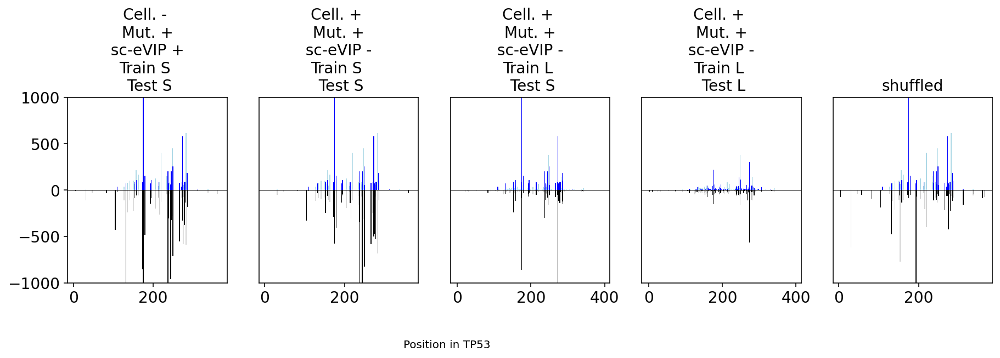

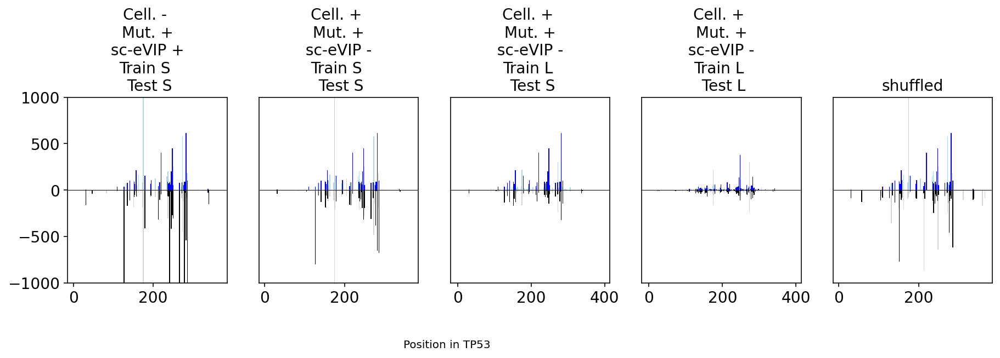

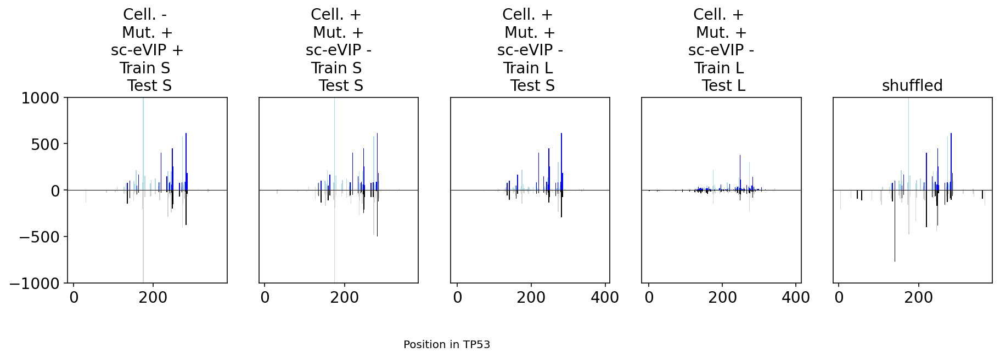

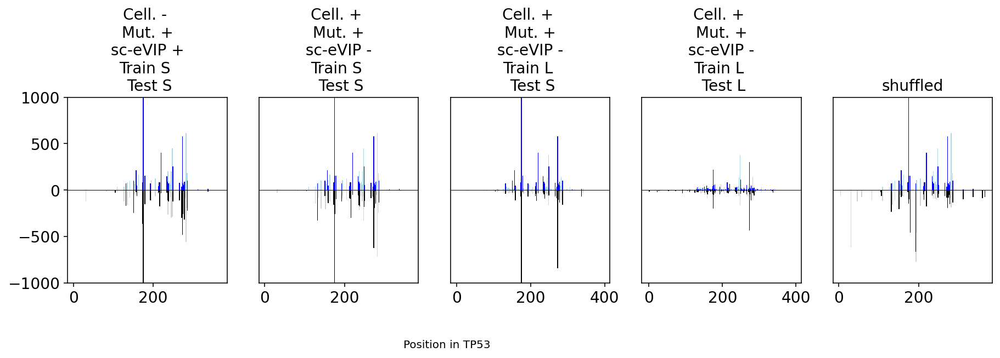

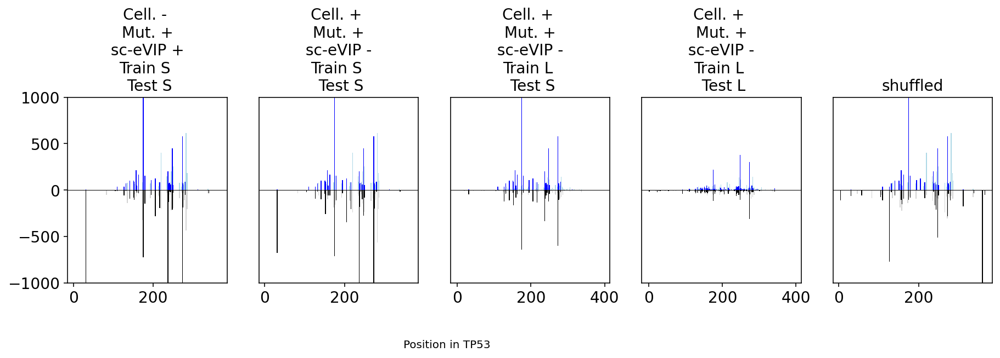

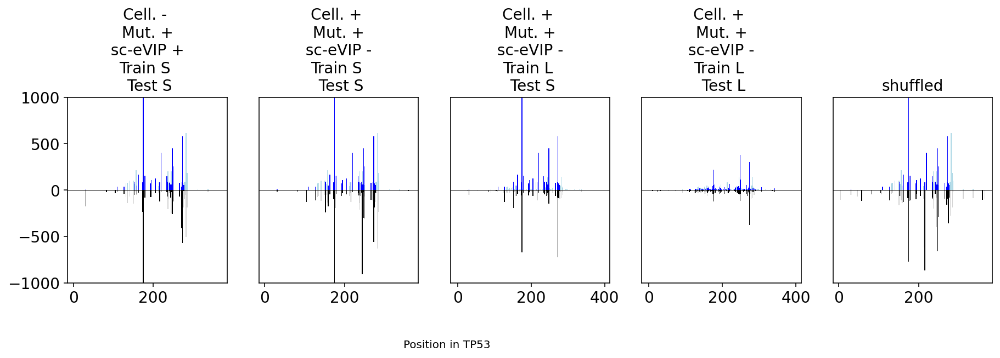

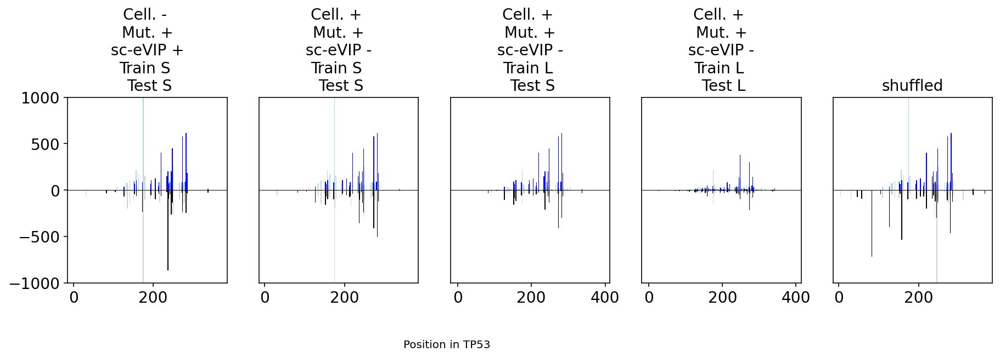

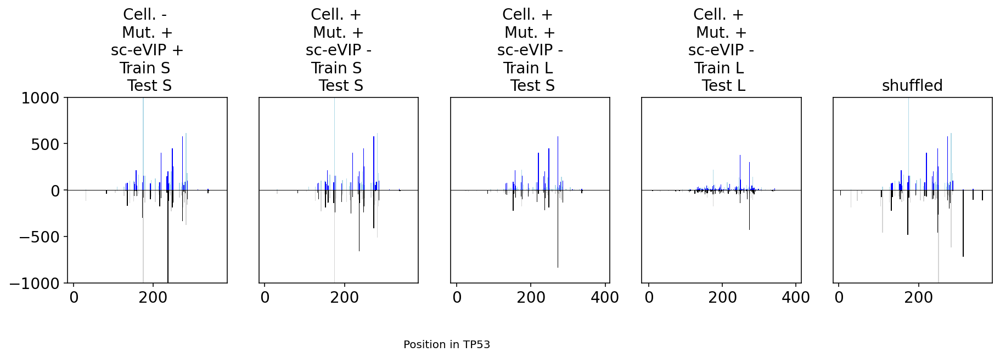

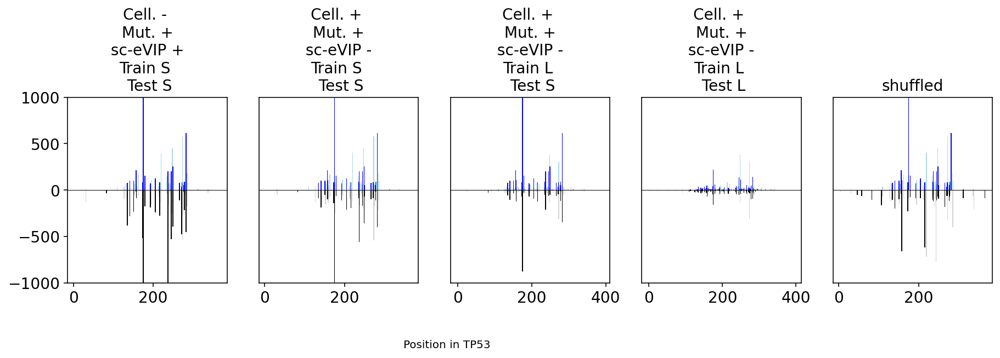

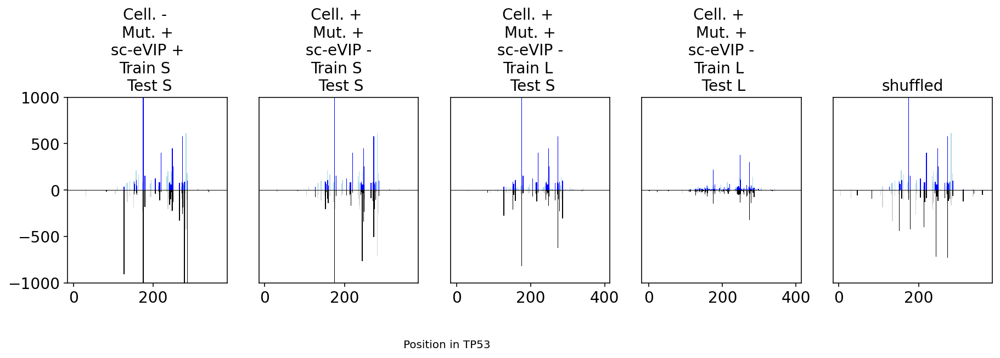

In [23]:
def plot_pos_pred(pred_train,obs_train,pred_valid,obs_valid,data_with_position,ax):
    
    pred_train_pos=avg_by_position(pred_train,data_with_position)
    obs_train_pos=avg_by_position(obs_train,data_with_position)
    pred_valid_pos=avg_by_position(pred_valid,data_with_position)
    obs_valid_pos=avg_by_position(obs_valid,data_with_position)
    
    lw=2
    ax.bar(pred_train_pos.loc[:,'pos'],
           -pred_train_pos.iloc[:,0],color='lightgray',width=lw)
    ax.bar(obs_train_pos.loc[:,'pos'],
           obs_train_pos.iloc[:,0],color='lightblue',width=lw)
    ax.bar(pred_valid_pos.loc[:,'pos'],
           -pred_valid_pos.iloc[:,0],color='black',width=lw)
    ax.bar(obs_valid_pos.loc[:,'pos'],
           obs_valid_pos.iloc[:,0],color='blue',width=lw)
    ax.grid(False)
    ax.axhline(y=0,color='black',linewidth=0.5)


for i in range(10):
    fig_pos,plots_pos=plt.subplots(1,len(myorder))
    x=3
    fig_pos.set_size_inches(len(myorder)*x,x)
    
    for idx in range(len(myorder)):
        model_name=myorder[idx]
        plot_pos_pred(results[i][model_name][0]['pred_train'],
                      results[i][model_name][0]['obs_train'],
                    results[i][model_name][0]['pred_valid'],
                      results[i][model_name][0]['obs_valid'],
                  data,
                    plots_pos[idx])
        if idx!=0:
            plots_pos[idx].set_yticks([])
        plots_pos[idx].set_title(model_name)
        plots_pos[idx].set_ylim(-1000,1000)
    fig_pos.text(0.5, -0.15, 'Position in TP53', ha='center')
    plt.savefig(FIGS+'/'+PROTEIN+'.LinModels_subset.pos'+str(i)+'.notLog.pdf',bbox_inches = "tight") 
    plt.savefig(FIGS+'/'+PROTEIN+'.LinModels_subset.pos'+str(i)+'.notLog.png',bbox_inches = "tight")
    
    

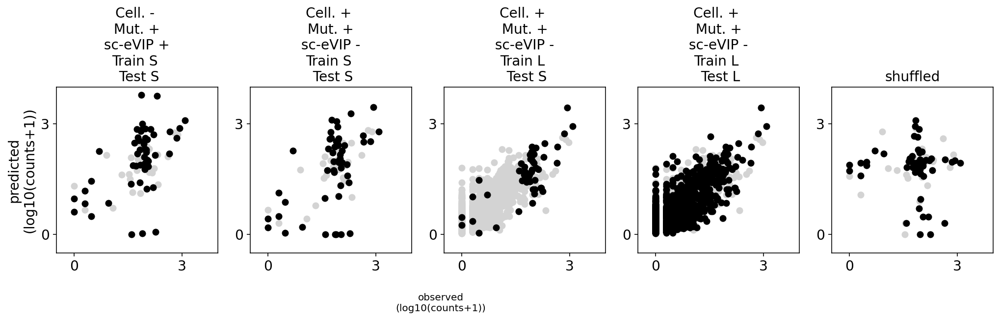

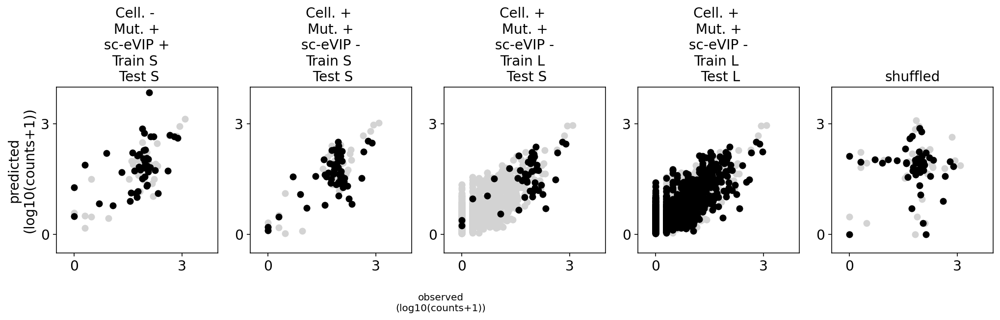

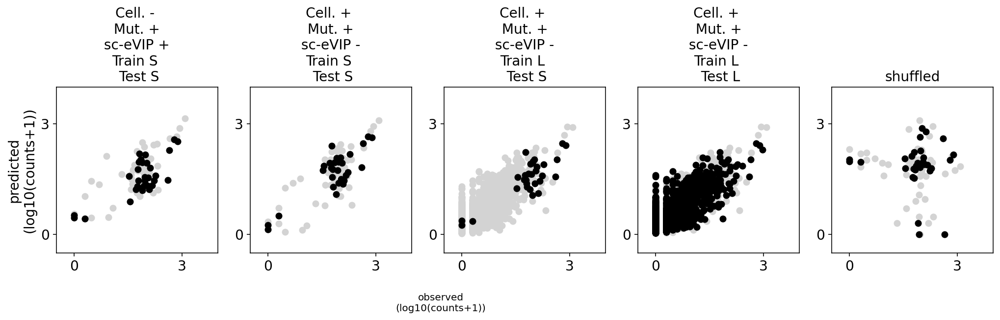

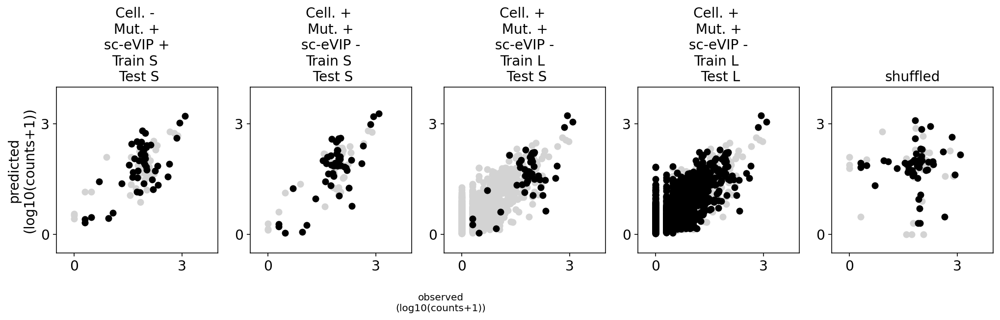

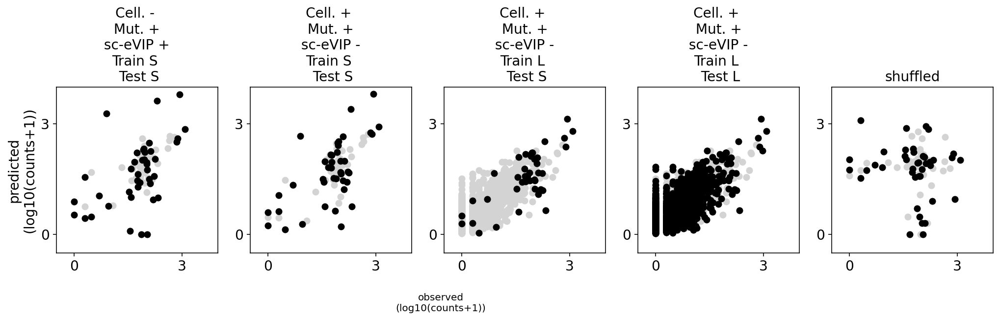

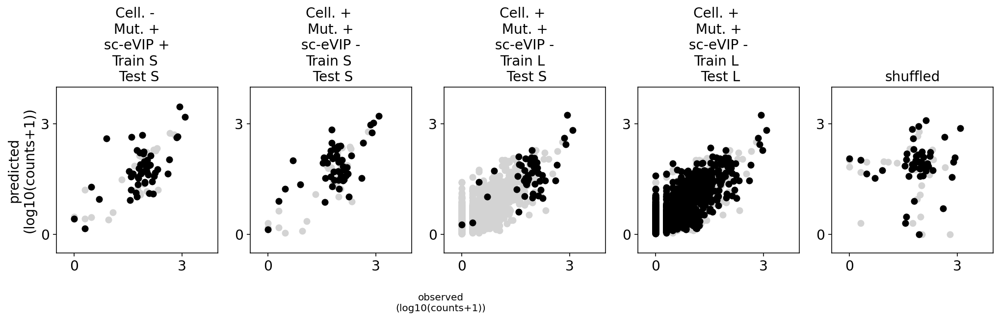

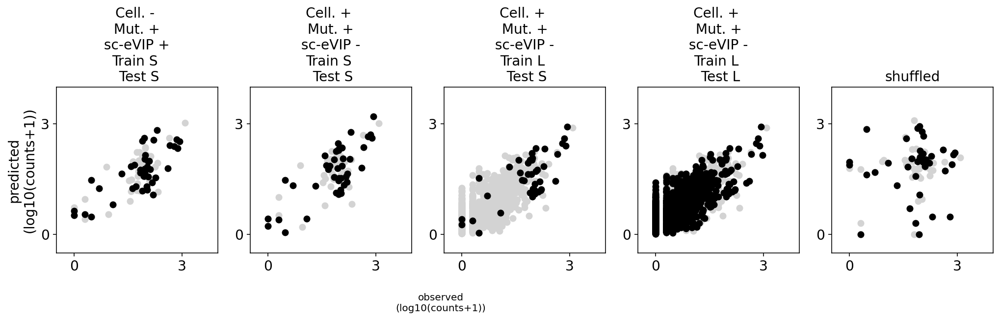

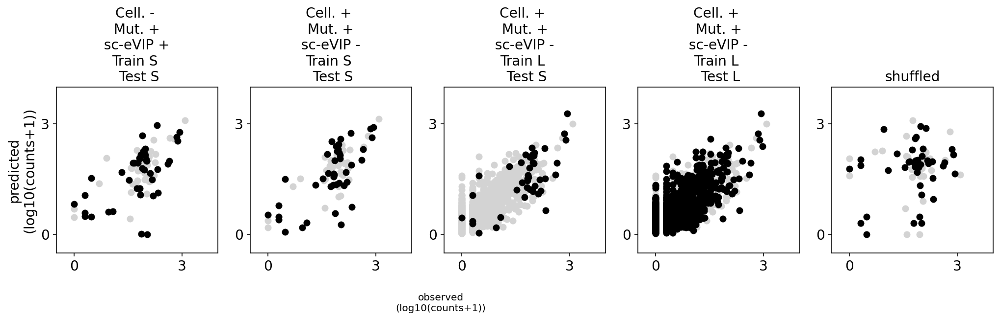

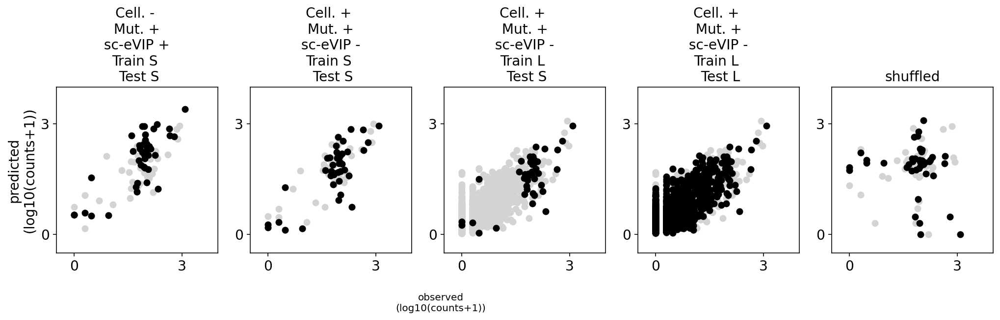

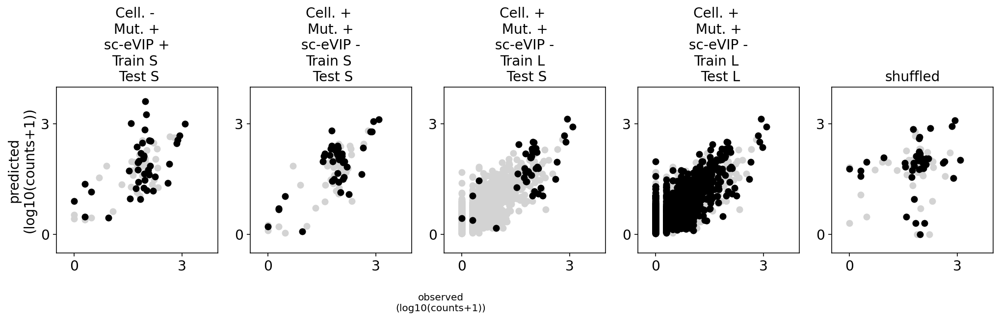

In [59]:
def scatter_pred_obs(pred_train,obs_train,pred_valid,obs_valid,ax,log_it=False):
    
    if not log_it:
        ax.scatter(obs_train,pred_train,color='lightgray')
        ax.scatter(obs_valid,pred_valid,color='black')
    if log_it:
        
        ax.scatter(np.log10(obs_train+1),np.log10(pred_train+1),color='lightgray')
        ax.scatter(np.log10(obs_valid+1),np.log10(pred_valid+1),color='black')

    

for i in range(10):
    fig_scatter,plots_scatter=plt.subplots(1,len(myorder))
    x=3
    fig_scatter.set_size_inches(len(myorder)*x+2,x)
    
    for idx in range(len(myorder)):
        model_name=myorder[idx]
        scatter_pred_obs(results[i][model_name][0]['pred_train'],
                      results[i][model_name][0]['obs_train'],
                    results[i][model_name][0]['pred_valid'],
                      results[i][model_name][0]['obs_valid'],
                    plots_scatter[idx],log_it=True)
        if idx!=0:
            plots_scatter[idx].set_yticks([])
        plots_scatter[idx].set_title(model_name)
        plots_scatter[idx].grid(False)
        if idx==0:
            plots_scatter[idx].set_ylabel('predicted\n(log10(counts+1))')
        
        plots_scatter[idx].set_ylim(-0.5,4)
        plots_scatter[idx].set_xlim(-0.5,4)
        plots_scatter[idx].set_xticks([0,3])
        plots_scatter[idx].set_yticks([0,3])
    fig_scatter.text(0.5, -0.15, 'observed\n(log10(counts+1))', ha='center')
        
    plt.savefig(FIGS+'/'+PROTEIN+'.LinModels_subset.scatter'+str(i)+'.pdf',bbox_inches = "tight") 
    plt.savefig(FIGS+'/'+PROTEIN+'.LinModels_subset.scatter'+str(i)+'.png',bbox_inches = "tight")
        

In [22]:
performances['spearman']=pd.DataFrame(performances['spearman'],dtype=float)
performances['pearson']=pd.DataFrame(performances['pearson'],dtype=float)
performances['r2']=pd.DataFrame(performances['r2'],dtype=float)
grouped_performances=performances.groupby('condition').median()
grouped_performances['condition']=list(grouped_performances.index)
grouped_performances.index=range(grouped_performances.shape[0])
pd.set_option('display.max_colwidth', 100)
print(grouped_performances)

    pearson  spearman     r2  \
0     0.715     0.460  0.315   
1     0.710     0.510  0.325   
2     0.740     0.655  0.455   
3     0.710     0.410  0.210   
4     0.680     0.380 -0.435   
5     0.665     0.630  0.420   
6     0.595     0.480  0.160   
7     0.635     0.395  0.160   
8     0.700     0.490  0.340   
9     0.705     0.415  0.215   
10    0.005     0.265 -0.985   

                                                                                 condition  
0         Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var   
1           Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: 50 var   
2             Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: Half   
3         Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var   
4           Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: 50 var   
5             Func. assays: + | Mut. sig.: - | Impact sco

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Func. assays: - | Mut. sig.: + | Impact score: + 
Train: 50 var | Test: 50 var  v.s. Func. assays: - | Mut. sig.: - | Impact score: + 
Train: 50 var | Test: 50 var : t-test independent samples with Bonferroni correction, P_val=1.000e+00 stat=-1.091e+00
Func. assays: Nutlin3 | Mut. sig.: - | Impact score: - 
Train: 50 var | Test: 50 var  v.s. Func. assays: - | Mut. sig.: + | Impact score: + 
Train: 50 var | Test: 50 var : t-test independent samples with Bonferroni correction, P_val=1.000e+00 stat=1.134e+00
Func. assays: Nutlin3 | Mut. sig.: + | Impact score: - 
Train: 50 var | Test: 50 var  v.s. Func. assays: - | Mut. sig.: + | Impact score: + 
Train: 50 var | Test: 50 var : t-test independent samples with Bonferroni correction, P_val=1.000e+00 stat=1.164e+00
Func. assays: + | Mut. sig.: - | Impact score: - 
Train: 50 var | T

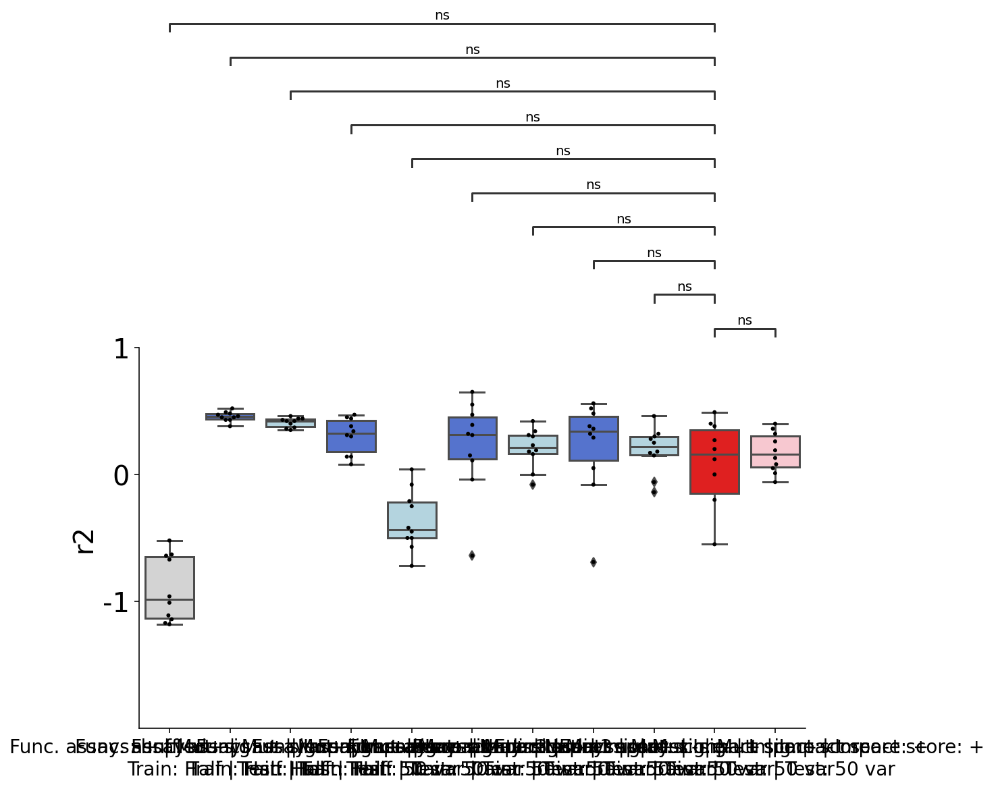

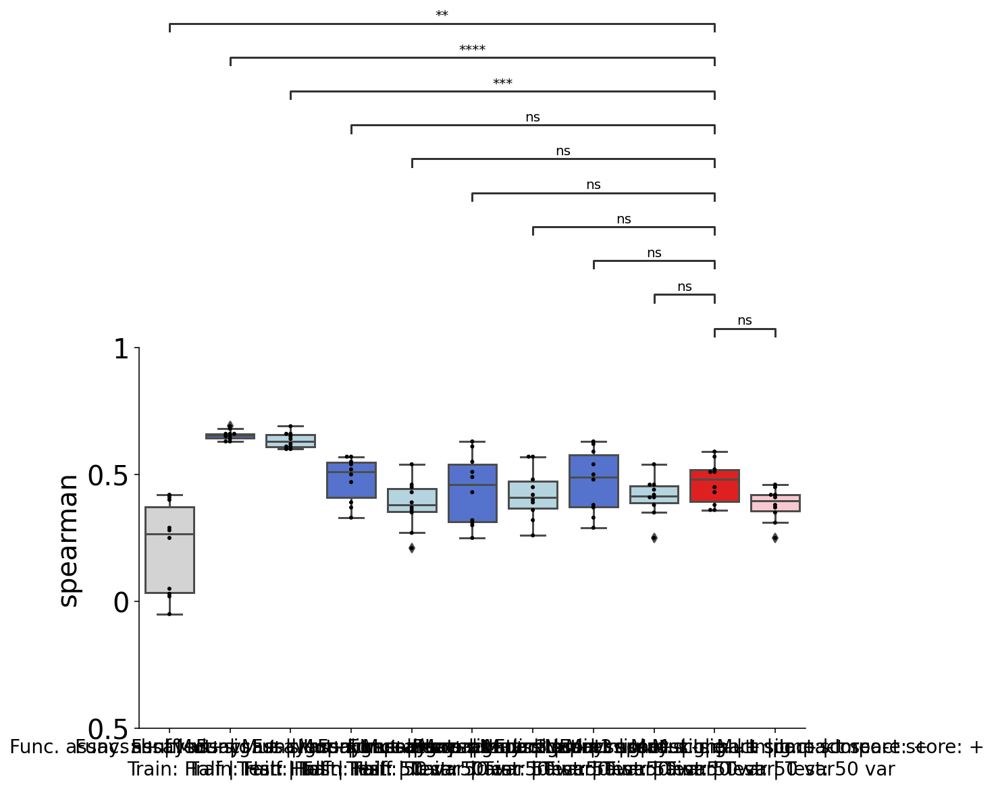

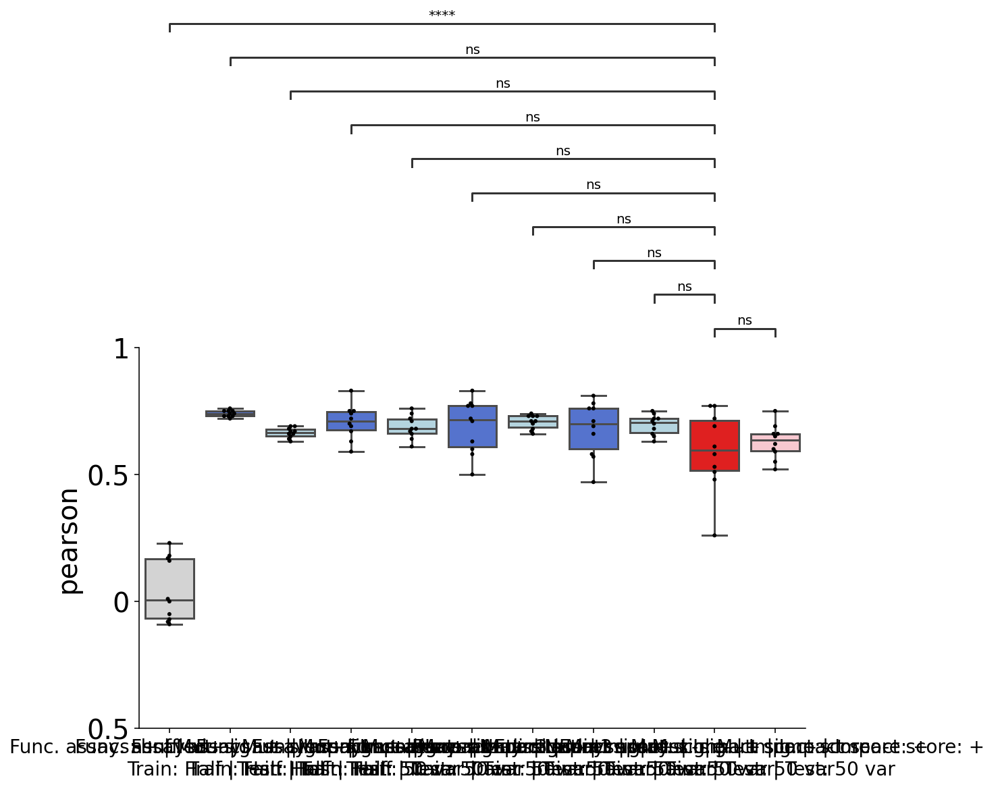

In [23]:
color_dict={'Func. assays: - | Mut. sig.: - | Impact score: + \nTrain: 50 var | Test: 50 var ':'pink',
    'Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var ':'red',
    'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ':'royalblue',
    'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: 50 var ':'royalblue',
            'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: 50 var ':'lightblue',
            'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: 50 var ':'lightblue',
    'Func. assays: Nutlin3 | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ':'lightblue',
            'Func. assays: Nutlin3 | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ':'royalblue',
    'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: Half ':'royalblue',
    'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: Half ':'lightblue',
            'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ':'lightblue',
           'shuffled':'lightgray'}

myorder=['shuffled','Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: Half ',
         'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: Half ',
         
         'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: 50 var ',
         'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: 50 var ',
         
         'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ',
         'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ',
         
         'Func. assays: Nutlin3 | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ',
         'Func. assays: Nutlin3 | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ',
         
         'Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var ',
         'Func. assays: - | Mut. sig.: - | Impact score: + \nTrain: 50 var | Test: 50 var ']
#myorder=myorder[::-1]

pairs=[]
comparison='Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var '
for x in color_dict:
    if x==comparison:
        continue
    pairs.append((x,comparison))
    
    
from statannot import add_stat_annotation
for item in ['r2','spearman','pearson']:
    g = sns.catplot(x="condition", y=item,kind='box',data=performances,palette=color_dict,
                   order=myorder,aspect=2)##aspect=1.3)#4)
                    #order=myorder)#,palette=color_dict)
    sns.swarmplot(x="condition", y=item, color="k", size=3, data=performances, ax=g.ax,order=myorder)
                  #order=myorder);
        
    ax1 = g.axes[0,0]
    ax1.grid(False)
    
    
    if item=='r2':
        g.ax.set_ylim(-2,1)
        g.ax.set_yticks([-1,0,1])
        g.ax.set_yticklabels([-1,0,1],fontsize=20)
        
    else:
        g.ax.set_ylim(-0.5,1)
        g.ax.set_yticks([-0.5,0,0.5,1])
        g.ax.set_yticklabels([0.5,0,0.5,1],fontsize=20)
    #g.ax.set_xticks([])
    g.ax.set_xlabel('')
    g.ax.set_ylabel(item,fontsize=20)
    
    
    test_results = add_stat_annotation(ax1,
                                       x="condition", y=item,data=performances,order=myorder,
                                   box_pairs=pairs,
                                   test='t-test_ind', text_format='star',
                                   loc='outside', verbose=2)
    


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Func. assays: - | Mut. sig.: + | Impact score: + 
Train: 50 var | Test: 50 var  v.s. Func. assays: + | Mut. sig.: + | Impact score: - 
Train: 50 var | Test: 50 var : t-test independent samples with Bonferroni correction, P_val=1.000e+00 stat=-1.187e+00
Func. assays: - | Mut. sig.: + | Impact score: + 
Train: 50 var | Test: 50 var  v.s. Func. assays: + | Mut. sig.: + | Impact score: - 
Train: Half | Test: 50 var : t-test independent samples with Bonferroni correction, P_val=6.596e-01 stat=-1.448e+00
Func. assays: - | Mut. sig.: + | Impact score: + 
Train: 50 var | Test: 50 var  v.s. Func. assays: + | Mut. sig.: + | Impact score: - 
Train: Half | Test: Half : t-test independent samples with Bonferroni correction, P_val=3.120e-01 stat=-1.869e+00
Func. assays: - | Mut. sig.: + | Impact score: + 
Train: 50 var | Test: 50 var  v.

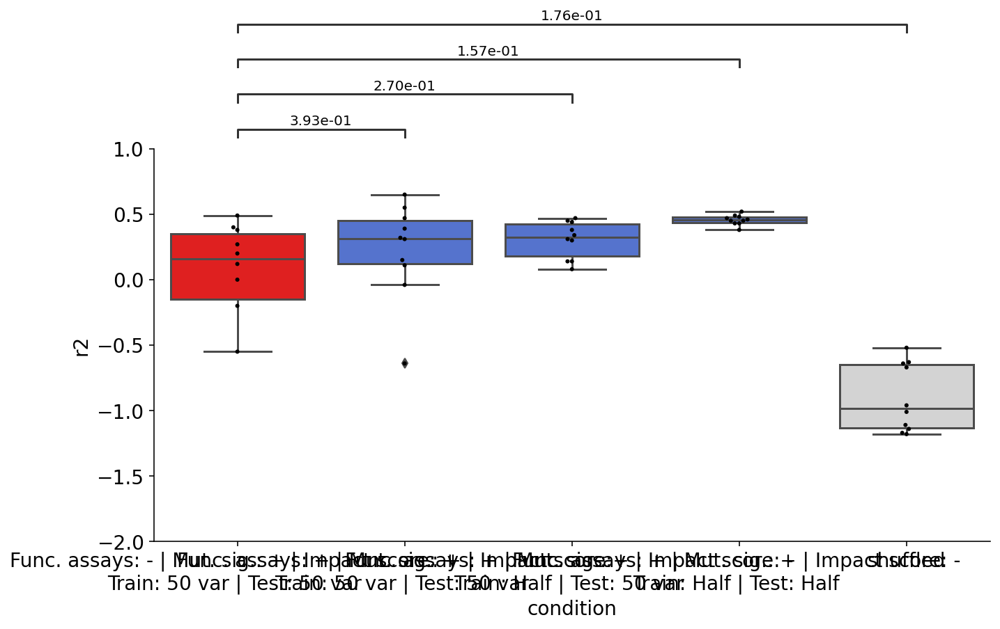

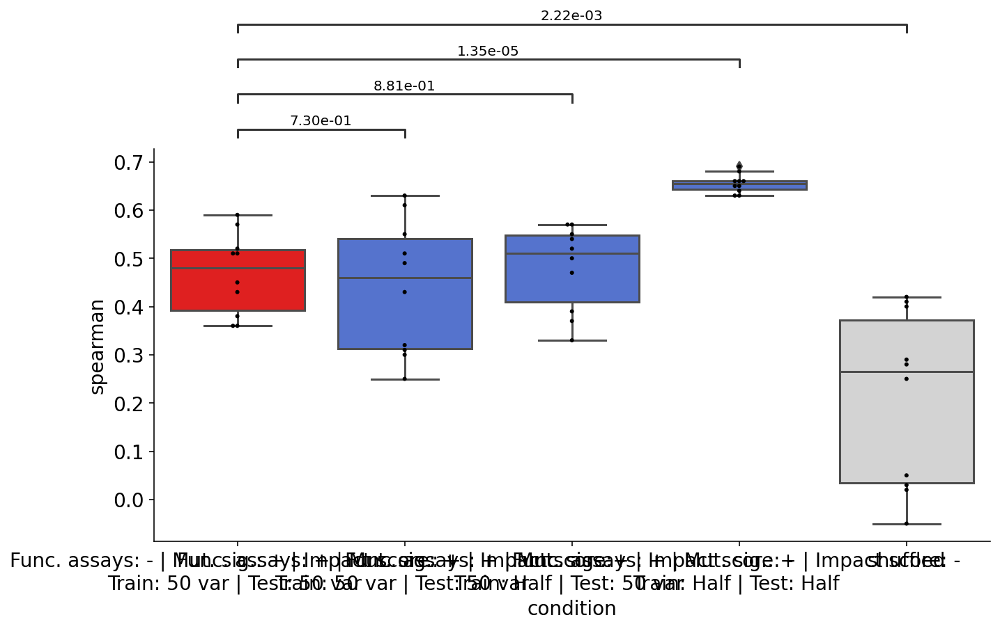

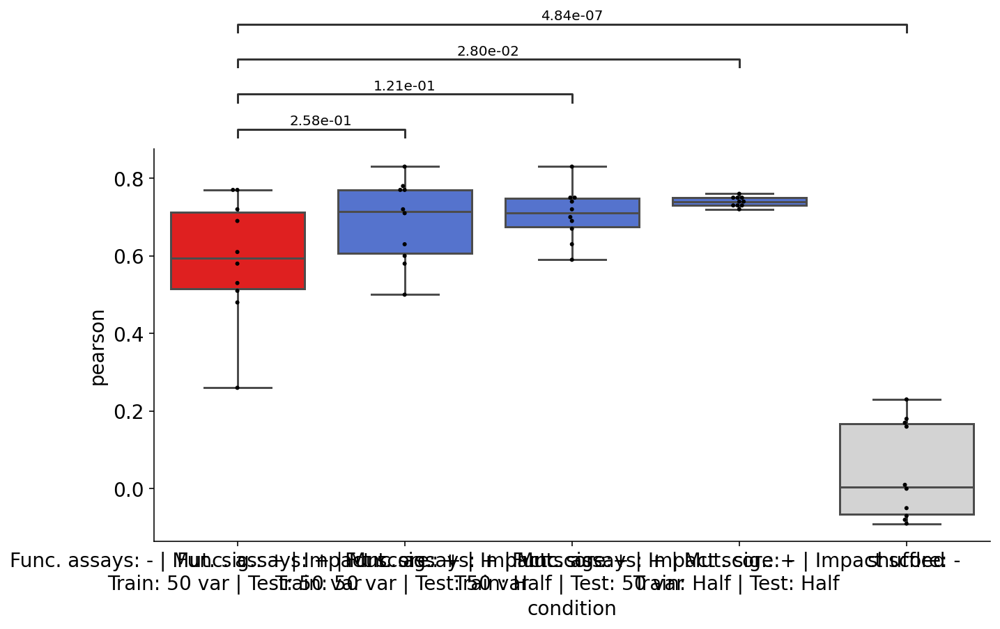

In [29]:
color_dict={'Func. assays: - | Mut. sig.: - | Impact score: + \nTrain: 50 var | Test: 50 var ':'pink',
    'Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var ':'red',
    'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ':'royalblue',
    'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: 50 var ':'royalblue',
            'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: 50 var ':'lightblue',
            'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: 50 var ':'lightblue',
    'Func. assays: Nutlin3 | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ':'lightblue',
            'Func. assays: Nutlin3 | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ':'royalblue',
    'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: Half ':'royalblue',
    'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: Half ':'lightblue',
            'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ':'lightblue',
           'shuffled':'lightgray'}

myorder=['Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var ',
         'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ',
         'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: 50 var ',
         'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: Half ',
         'shuffled'
    
]


pairs=[]
comparison='Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var '
for x in myorder:
    if x==comparison:
        continue
    pairs.append((x,comparison))
    
def pairwise_ttests(df,condition,value):

    pval_m=pd.DataFrame(0.0,index=conditions,columns=conditions)

    for m1 in conditions:
        m1_values=df.loc[df[condition]==m1,value]
        for m2 in conditions:
            m2_values=df.loc[df[condition]==m2,value]

            from scipy.stats import ttest_ind
            res=ttest_ind(m1_values,m2_values,nan_policy='omit')

            pval_m.loc[m1,m2]=res[1]
            pval_m.loc[m2,m1]=pval_m.loc[m1,m2]
            
    #correct for multiple testing
    from statsmodels.stats.multitest import multipletests
    pvals=np.array(pval_m).flatten()
    new_pvals=multipletests(pvals,method='fdr_bh')[1]
    pval_m2=pd.DataFrame(new_pvals.reshape(pval_m.shape),index=pval_m.index,columns=pval_m.columns)
    return(pval_m2)


    
    
from statannot import add_stat_annotation
for item in ['r2','spearman','pearson']:
    
    df=pd.DataFrame({'condition':performances['condition'],
                'value':performances[item]})

    condition='condition'
    value='value'
    conditions=set(df[condition])
    pval_m=pairwise_ttests(df,'condition','value')
    pair_values=[]
    for i in range(len(pairs)):
        p1=pairs[i][0]
        p2=pairs[i][1]
        pair_values.append('{:0.2e}'.format(pval_m.loc[p1,p2]))
    
    g = sns.catplot(x="condition", y=item,kind='box',data=performances,palette=color_dict,
                   order=myorder,aspect=2)##aspect=1.3)#4)
                    #order=myorder)#,palette=color_dict)
    sns.swarmplot(x="condition", y=item, color="k", size=3, data=performances, ax=g.ax,order=myorder)
                  #order=myorder);
        
    ax1 = g.axes[0,0]
    ax1.grid(False)
    
    if item=='r2':
        ax1.set_ylim(-2,1)
        print('')
        
    test_results = add_stat_annotation(ax1,
                                       x="condition", y=item,data=performances,order=myorder,
                                   box_pairs=pairs,
                                   test='t-test_ind', #text_format='star',
                                       text_annot_custom=pair_values,
                                   loc='outside', verbose=2)
    
    

    

In [27]:
pairs

[('Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ',
  'Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var '),
 ('Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: 50 var ',
  'Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var '),
 ('Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: Half ',
  'Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var '),
 ('shuffled',
  'Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var ')]

In [25]:
performances.head()

,condition,pearson,spearman,r2,fold
0,Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: Half,0.75,0.66,0.48,fold0
0,Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: Half,0.69,0.66,0.46,fold0
0,Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: 50 var,0.75,0.57,0.45,fold0
0,Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: 50 var,0.74,0.45,-0.21,fold0
0,Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var,0.50,0.31,-0.64,fold0


In [ ]:


#we'll split into train/test here by using positions below/above 200

#define train, validation sets
#==============================
i=0
foldname='fold'+str(i)
data[foldname]=copy.deepcopy(data['Position'])<=200
data[foldname+'not']=(data[foldname]==False)
    
data['train'+foldname]=np.multiply(data['has_effsize'],data[foldname])
data['valid'+foldname]=np.multiply(data['has_effsize'],data[foldname+'not'])
    
model2features={}
model2features['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: Half ']=list(set(pheno_cols).union(set(signature_cols)))
model2features['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: Half ']=pheno_cols

model2features['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: 50 var ']=list(set(pheno_cols).union(set(signature_cols)))
model2features['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: 50 var ']=list(set(pheno_cols).union(set([])))

model2features['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ']=list(set(pheno_cols).union(set(signature_cols)))
model2features['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ']=list(set(pheno_cols).union(set([])))

model2features['Func. assays: Nutlin3 | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ']=list(set(['A549_p53WT_Nutlin-3_Z-score']).union(set(signature_cols)))
model2features['Func. assays: Nutlin3 | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ']=['A549_p53WT_Nutlin-3_Z-score']

model2features['Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var ']=list(set(impact_cols).union(set(signature_cols)))
model2features['Func. assays: - | Mut. sig.: - | Impact score: + \nTrain: 50 var | Test: 50 var ']=impact_cols



model2train={}
model2train['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: Half ']=foldname
model2train['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: Half ']=foldname

model2train['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: 50 var ']=foldname
model2train['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: 50 var ']=foldname

model2train['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ']='train'+foldname
model2train['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ']='train'+foldname

model2train['Func. assays: Nutlin3 | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ']='train'+foldname
model2train['Func. assays: Nutlin3 | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ']='train'+foldname

model2train['Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var ']='train'+foldname
model2train['Func. assays: - | Mut. sig.: - | Impact score: + \nTrain: 50 var | Test: 50 var ']='train'+foldname


model2valid={}

model2valid['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: Half ']=foldname+'not'
model2valid['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: Half ']=foldname+'not'

model2valid['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: 50 var ']='valid'+foldname
model2valid['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: 50 var ']='valid'+foldname

model2valid['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ']='valid'+foldname
model2valid['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ']='valid'+foldname

model2valid['Func. assays: Nutlin3 | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ']='valid'+foldname
model2valid['Func. assays: Nutlin3 | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ']='valid'+foldname

model2valid['Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var ']='valid'+foldname
model2valid['Func. assays: - | Mut. sig.: - | Impact score: + \nTrain: 50 var | Test: 50 var ']='valid'+foldname


model2num={}
model2num['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: Half ']=1
model2num['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: Half ']=2

model2num['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: 50 var ']=3
model2num['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: 50 var ']=4

model2num['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ']=5
model2num['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ']=6

model2num['Func. assays: Nutlin3 | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ']=7
model2num['Func. assays: Nutlin3 | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ']=8

model2num['Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var ']=9
model2num['Func. assays: - | Mut. sig.: - | Impact score: + \nTrain: 50 var | Test: 50 var ']=10




preds=copy.deepcopy(data)                      
for model_name in myorder:#model2features.keys(): 
    if model_name=='shuffled':
        continue

    print('model name',model_name)
    features=model2features[model_name]
    out=model_full(data,
                features,
                training_pos_col=model2train[model_name],
                valid_pos_col=model2valid[model_name],
                training_y_name=yname,
                valid_y_name=yname,
              toprint=model_name)
    print(out[4])    #preds[model_name]=out[0]['dataset'].loc[preds.index,model_name]

    plot_performance(out[0],'',-0.5,4)
    plt.savefig(FIGS+'/'+PROTEIN+'.performance.model'+str(model2num[model_name])+'.pdf',bbox_inches = "tight") 
    plt.savefig(FIGS+'/'+PROTEIN+'.performance.model'+str(model2num[model_name])+'.png',bbox_inches = "tight")
    plt.show()
    
#and the shuffled model
import copy
import random
model_name='Func. assays: - | Mut. sig.: - | Impact score: + \nTrain: 50 var | Test: 50 var '
features=model2features[model_name]
out=model_full(data,
                features,
                training_pos_col=model2train[model_name],
                valid_pos_col=model2valid[model_name],
                training_y_name=yname,
                valid_y_name=yname,
              toprint=model_name)

for item in ['train','valid','all']:
    idx=list(out[0]['obs_'+item].index)
    stuff=copy.deepcopy(list(out[0]['obs_'+item]))
    print(stuff[:3])
    random.shuffle(stuff)
    out[0]['pred_'+item]=pd.DataFrame(stuff,index=idx)
    print(out[0]['pred_'+item].head())
    
plot_performance(out[0],'shuffled',-0.5,4)
plt.savefig(FIGS+'/'+PROTEIN+'.performance.model'+str(8)+'.pdf',bbox_inches = "tight") 
plt.savefig(FIGS+'/'+PROTEIN+'.performance.model'+str(8)+'.png',bbox_inches = "tight")
plt.show()














In [ ]:
preds=copy.deepcopy(data)   
plt.figure(1)
fig2,plots2=plt.subplots(11,1)
fig2.set_size_inches(2,8)
count=0
for model_name in myorder:#model2features.keys(): 
    if model_name=='shuffled':
        continue

    print(model_name)
    features=model2features[model_name]
    out=model_full(data,
                features,
                training_pos_col=model2train[model_name],
                valid_pos_col=model2valid[model_name],
                training_y_name=yname,
                valid_y_name=yname,
              toprint=model_name)
    preds[model_name]=out[0]['dataset'].loc[preds.index,model_name]
    
    #plotting
    preds_here=out[0]
    titlename=''
    mini=-0.5
    maxi=4
    for item in ['train','valid']:
        if item=='train':
            c='black'
        if item=='valid':
            c='blue'
        plots2[count].scatter(np.log10(preds_here['pred_'+item]+1),
            np.log10(preds_here['obs_'+item].loc[preds_here['pred_'+item].index]+1),s=5,color=c,
                          alpha=0.5)

        plots2[count].set_xlim(mini,maxi)
        plots2[count].set_ylim(mini,maxi)        
        plots2[count].set_xticks([])
        
        plots2[count].set_yticks([0,maxi/2,maxi])
        plots2[count].set_yticks([])
        plots2[count].set_ylabel('observed counts\n(log10(counts+1))')
        plots2[count].set_ylabel('')
        plots2[count].grid(False)
        
    plots2[count].set_xticks([0,maxi/2,maxi])
    plots2[count].set_xlabel('predicted counts\n(log10(counts+1))')
    plots2[count].set_title(titlename)
    
    #plt.savefig(FIGS+'/'+PROTEIN+'.performance.model'+str(model2num[model_name])+'.pdf',bbox_inches = "tight") 
    #plt.savefig(FIGS+'/'+PROTEIN+'.performance.model'+str(model2num[model_name])+'.png',bbox_inches = "tight")
    #plt.show()
    count+=1
    
    
#and the shuffled model
import copy
import random
model_name='Func. assays: - | Mut. sig.: - | Impact score: + \nTrain: 50 var | Test: 50 var '
features=model2features[model_name]
out=model_full(data,
                features,
                training_pos_col=model2train[model_name],
                valid_pos_col=model2valid[model_name],
                training_y_name=yname,
                valid_y_name=yname,
              toprint=model_name)

for item in ['train','valid','all']:
    idx=list(out[0]['obs_'+item].index)
    stuff=copy.deepcopy(list(out[0]['obs_'+item]))
    print(stuff[:3])
    random.shuffle(stuff)
    out[0]['pred_'+item]=pd.DataFrame(stuff,index=idx)
    print(out[0]['pred_'+item].head())
    
#plot_performance(out[0],plots[10],'shuffled',-0.5,4)
#plt.savefig(FIGS+'/'+PROTEIN+'.performance.model'+str(11)+'.pdf',bbox_inches = "tight") 
#plt.savefig(FIGS+'/'+PROTEIN+'.performance.model'+str(11)+'.png',bbox_inches = "tight")
plt.show()